# Setup

In [31]:
# load required packages

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import pandas as pd
import random

from matplotlib import font_manager
_ = font_manager.findSystemFonts(fontpaths=None, fontext="ttf")

import matplotlib as mpl
mpl.rc('text', usetex = False)
mpl.rc('font', family = 'serif')

from matplotlib import rcParams
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Arial']

sns.set(font_scale=1.4)

sns.set_style('white')

sns.set_style("ticks", {"xtick.major.size": 15, "ytick.major.size": 15})
plt.rcParams['svg.fonttype'] = 'none'

from tqdm import tqdm

from random import randint

import mygene
mg = mygene.MyGeneInfo()

In [32]:
import sys
sys.path.append("..")

from analysis_functions import *
from plotting_functions import *
from updated_netcoloc_functions import *

## Load Heierarchy data

In [33]:
nodes, G_int = load_pcnet()
pd.DataFrame(G_int.nodes).to_csv("pcnet_node_list.tsv", sep="\t", index=False, header=False)

number of nodes:
18820

number of edges:
2693109


In [34]:
updated_nodes = mg.querymany(nodes, as_dataframe=True, species='human', scopes='symbol, alias', fields='symbol')
updated_nodes = updated_nodes.sort_values(by="_score", ascending=False)
updated_nodes = updated_nodes.drop_duplicates(subset=["symbol"])

querying 1-1000...done.
querying 1001-2000...done.
querying 2001-3000...done.
querying 3001-4000...done.
querying 4001-5000...done.
querying 5001-6000...done.
querying 6001-7000...done.
querying 7001-8000...done.
querying 8001-9000...done.
querying 9001-10000...done.
querying 10001-11000...done.
querying 11001-12000...done.
querying 12001-13000...done.
querying 13001-14000...done.
querying 14001-15000...done.
querying 15001-16000...done.
querying 16001-17000...done.
querying 17001-18000...done.
querying 18001-18820...done.
Finished.
894 input query terms found dup hits:
	[('FBXO30', 2), ('ARF1', 2), ('UBE2F-SCLY', 2), ('FHL3', 2), ('UBC', 2), ('COP1', 2), ('SP3', 2), ('
159 input query terms found no hit:
	['AC022826.2', 'AL136295.5', 'MT-CO3', 'LOC105369243', 'AL136295.1', 'LOC101060399', 'AC006486.1', '
Pass "returnall=True" to return complete lists of duplicate or missing query terms.


In [35]:
G_overlap = load_network()

number of nodes:
657

number of edges:
5287


In [36]:
## load hierarchy data
hier_df_genes = pd.read_csv("hier_df_genes.tsv", sep="\t", index_col=0)
hier_df_genes.head()

,CD_MemberList,frac_d1_seeds,frac_d2_seeds
C877,HELZ EMX2 HIST1H3A RAD51 SYT12 GYPC KDM3B ERC1...,0.353583,0.177570
C898,STX4 LSAMP SPOCK1 SGCB STXBP5 TRP-AGG2-6 GPRC5...,0.363636,0.181818
C904,BCL11B PKIB PKIA LMO1 NR2F1 LDB2 ZFPM2 GATA3 A...,0.300000,0.200000
C906,PROM2 SPINT1 TNIK PKP3 SSH3 FEZ2 CORIN WWC1 CAPN1,0.333333,0.111111
C911,ZNF629 ZKSCAN5 LINGO1 ZNF202 ZKSCAN2 ZNF263 ZN...,0.571429,0.142857


In [37]:
## Load enrichment results
results = pd.read_csv("updated_enrichment_results_02_28_22.tsv", sep = "\t", index_col=0)
results = results.assign(MP = results.index)
results.head()

,observed,total,OR,OR_p,OR_CI_lower,OR_CI_upper,hyper_p,sig_5e6,description,size,name,MP
MP:0000001,464,12416,1.357896,6.337290e-04,1.139331,1.618390,2.117363e-04,False,mammalian phenotype,642,C877,MP:0000001
MP:0010768,265,6248,1.432740,1.076482e-05,1.220738,1.681560,5.554697e-06,False,mortality/aging,642,C877,MP:0010768
MP:0010769,254,5844,1.474168,2.407434e-06,1.254574,1.732198,1.353154e-06,True,abnormal survival,642,C877,MP:0010769
MP:0005376,242,6165,1.251777,6.792763e-03,1.063922,1.472801,3.189302e-03,False,homeostasis/metabolism phenotype,642,C877,MP:0005376
MP:0010770,239,5265,1.551894,1.325976e-07,1.318102,1.827155,9.082748e-08,True,preweaning lethality,642,C877,MP:0010770


In [38]:
old_results = pd.read_csv("full_results.tsv", sep="\t", index_col=0)
old_results = old_results.assign(MP = old_results.index)


## Load mouse data

In [39]:
mgi_df = load_MGI_mouseKO_data(url='http://www.informatics.jax.org/downloads/reports/MGI_PhenoGenoMP.rpt', map_using="mgi")

In [40]:
mgi_df = change_symbols(mgi_df, updated_nodes)

In [50]:
mgi_df.shape

(363949, 11)

In [41]:
MPO2 = load_MPO(url='http://www.informatics.jax.org/downloads/reports/MPheno_OBO.ontology', use_genes=True, mapping=mgi_df)

14673


In [42]:
from analysis_functions import get_mp_graph
mp_graph = get_mp_graph()
root="MP:0000001"
top_level = get_top_level_terms(mp_graph, root)
node_levels = nx.shortest_path_length(mp_graph, root)

In [43]:
term_counts, gene_mapping, term_mapping = genes_per_node(MPO2)

# Analysis

In [44]:
old_temp = old_results.copy()
old_temp["name"] = old_temp["name"] + "_old"
all_results = pd.concat([results, old_temp])

## Full network results

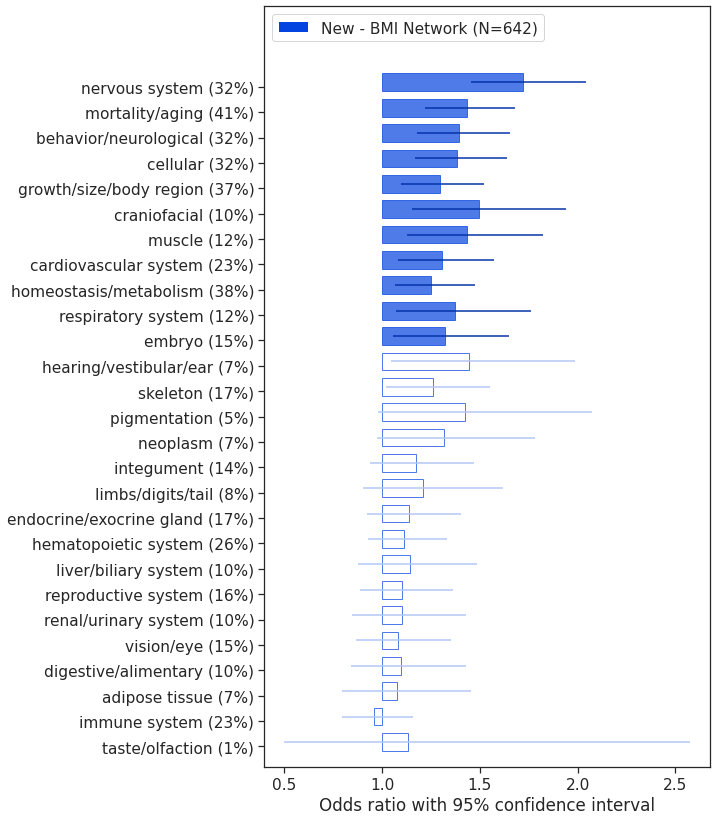

In [23]:
a = plot_hbar_comparison(all_results, communities=["C877"], mps=top_level, vert=14, horz = 8,
                         sig_level=0.05, community_names=[ "New - BMI Network"], sort_by="q", 
                         label_number="percent_community", correct_by_community=False)

In [33]:
a[0].loc["MP:0005384"].q

0.001118181206380275

PARENT: MP:0000001 mammalian phenotype


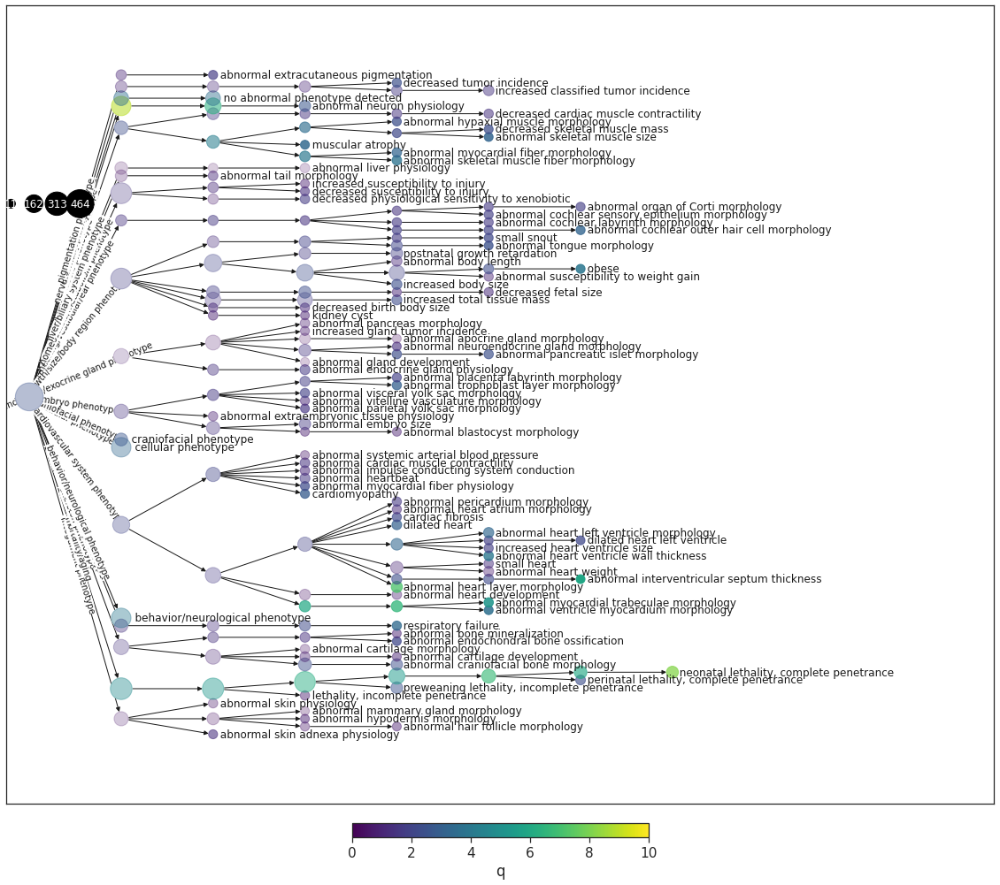

In [30]:
n = draw_significance_hierarchy(results.loc[results.observed > 10], "C877", "MP:0000001", mp_graph, MPO2, 
                                hier_df_genes, term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=20, label="leaf", descriptive_labels=True)

## Community selection

In [45]:
new_annotations = pd.read_csv("~/Data/Transfer/rat/update_GO_annotations.csv", usecols=["name", "represents"])
body_size_traits = ["MP:0005378","MP:0010866", "MP:0003956" , "MP:0005451"]
node_list = ["C917", "C889", "C887", "C885", "C888", "C900", "C886", "C882", "C905", "C881", "C920",
                "C880", "C934", "C931", "C912", "C883", "C878", "C891", "C884", "C879", "C907", "C909", "C894"]

### Heatmap with parent

#### previous results

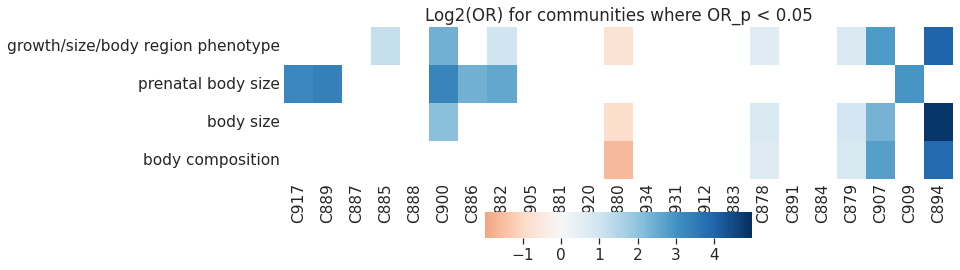

In [189]:
_ = plot_community_heatmap(old_results, body_size_traits, node_list, new_annotations, stat="OR", filter_stat="OR_p", 
                       color_range = [-2, 0, 5], MPO=MPO2, vert = 4)

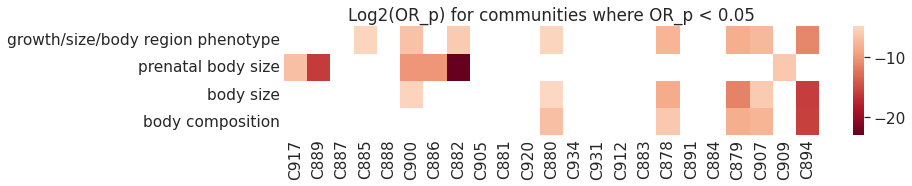

In [196]:
_ = plot_community_heatmap(old_results, body_size_traits, node_list, new_annotations,MPO2, stat="OR_p", filter_stat="OR_p", vert = 2)

#### updated results

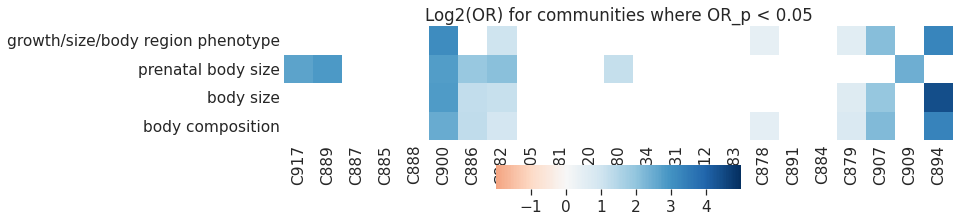

In [195]:
_ = plot_community_heatmap(results, body_size_traits, node_list, new_annotations, stat="OR", filter_stat="OR_p", 
                       color_range = [-2, 0, 5], MPO=MPO2, vert = 3)

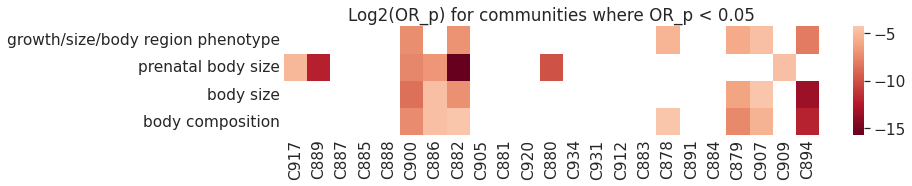

In [193]:
_ = plot_community_heatmap(results, body_size_traits, node_list, new_annotations,MPO2, stat="OR_p", filter_stat="OR_p", vert = 2)

### Heatmap without parent

#### Previous results

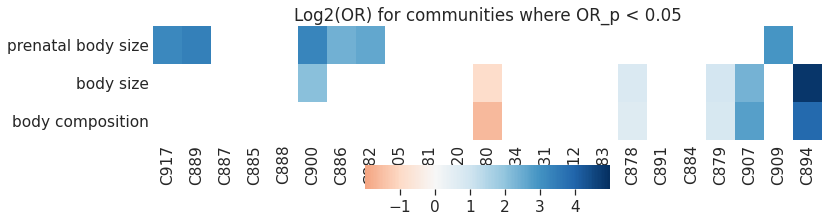

In [197]:
_ = plot_community_heatmap(old_results, body_size_traits[1:], node_list, new_annotations, stat="OR", filter_stat="OR_p", MPO=MPO2,
                      color_range = [-2, 0, 5], vert=3)

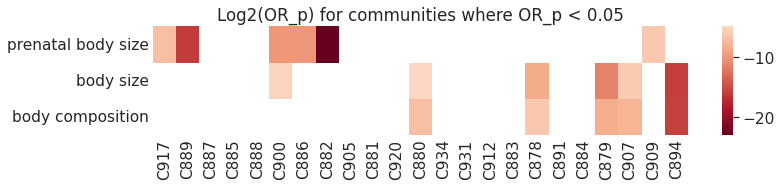

In [198]:
_ = plot_community_heatmap(old_results, body_size_traits[1:], node_list, new_annotations, MPO=MPO2,stat="OR_p", filter_stat="OR_p", vert =2)

#### updated results

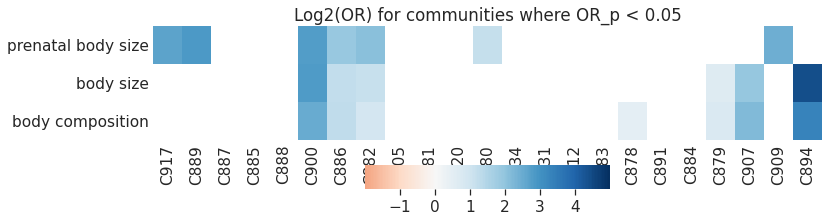

In [199]:
_ = plot_community_heatmap(results, body_size_traits[1:], node_list, new_annotations, stat="OR", filter_stat="OR_p", MPO=MPO2,
                      color_range = [-2, 0, 5], vert=3)

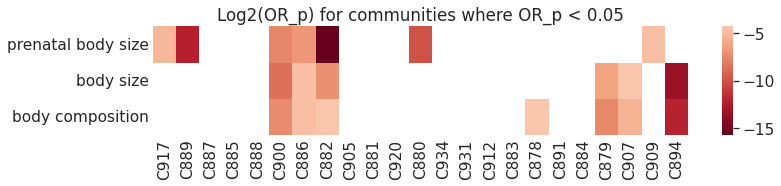

In [200]:
_ = plot_community_heatmap(results, body_size_traits[1:], node_list, new_annotations, MPO=MPO2,stat="OR_p", filter_stat="OR_p", vert =2)

## GSR - C894

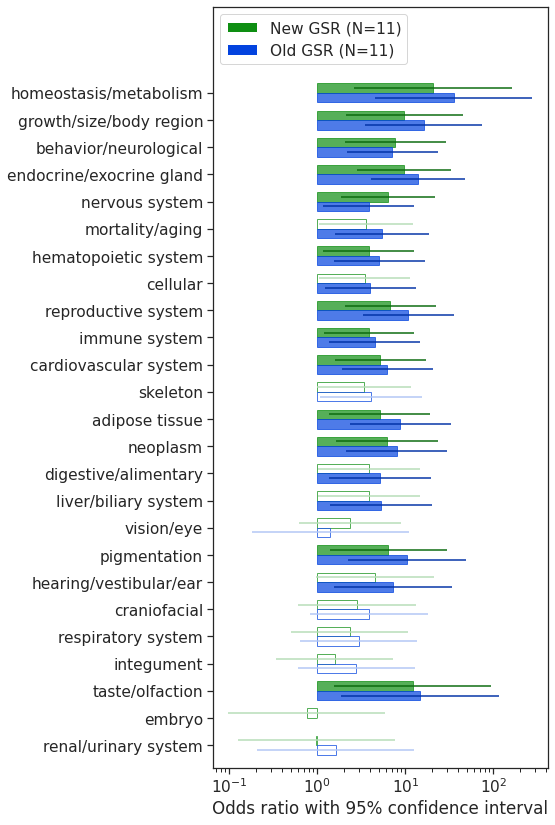

In [295]:
a = plot_hbar_comparison(all_results, communities=["C894", "C894_old"], mps=top_level, vert = 14, horz=6,
                         sig_level=0.05, community_names=["New GSR", "Old GSR"], sort_by="observed", label_number="percent_community")

PARENT: MP:0000001 mammalian phenotype


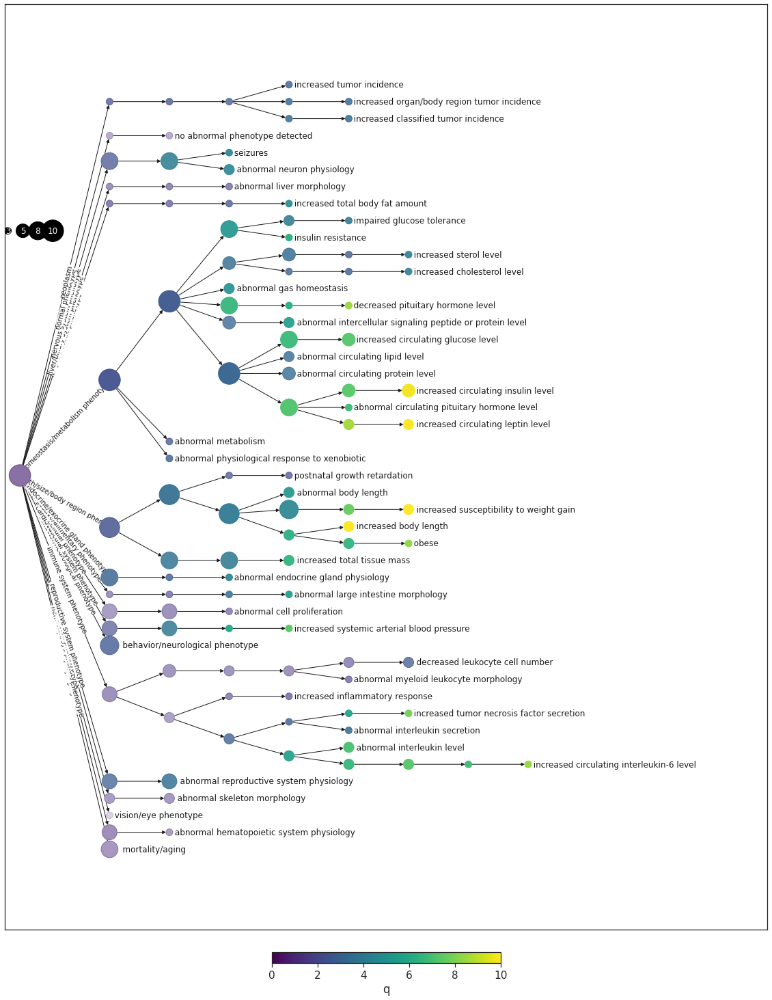

In [208]:
n = draw_significance_hierarchy(results.loc[results.observed>=3], "C894", "MP:0000001", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=30, label="leaf", 
                                descriptive_labels=True, adjust_root=0.1)

### Homestasis/Metabolism

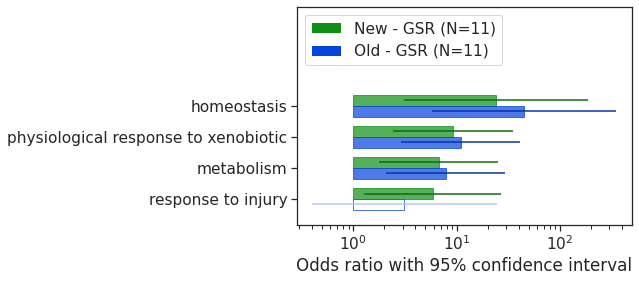

In [544]:
b = plot_hbar_comparison(all_results, communities=["C894", "C894_old"], mps="MP:0005376", vert = 4, mp_graph=mp_graph, horz=6,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", 
                         label_number="percent_community", correct_by_community=False)


In [545]:
def get_gene_hits_no_annotation(genes, term, MPO, term_mapping):
    term_genes = [MPO.genes[idx] for idx in term_mapping[term]]
    overlap = set(genes).intersection(set(term_genes))
    return overlap

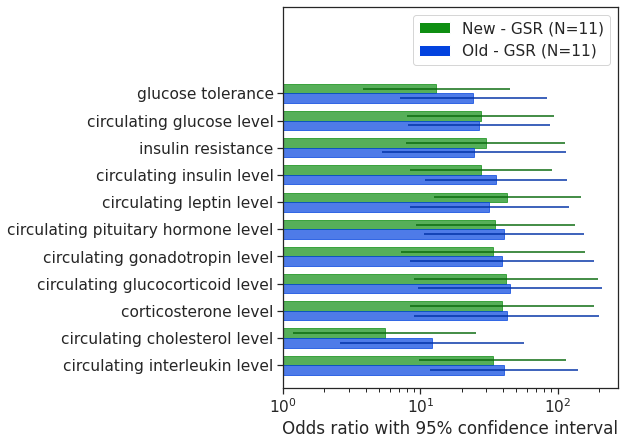

In [546]:
hormone_terms = [5291, 188,5331, 1560, 5667, 5116, 3361, 3366, 3963, 180, 8588]
hormone_terms = [num_to_mp(n) for n in hormone_terms]
a = plot_hbar_comparison(all_results, communities=["C894", "C894_old"], mps=hormone_terms, vert = 7, mp_graph=mp_graph,horz=6,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by=None, label_number="percent_community")

In [745]:
hier_df_genes

,CD_MemberList,frac_d1_seeds,frac_d2_seeds
C877,HELZ EMX2 HIST1H3A RAD51 SYT12 GYPC KDM3B ERC1...,0.353583,0.177570
C898,STX4 LSAMP SPOCK1 SGCB STXBP5 TRP-AGG2-6 GPRC5...,0.363636,0.181818
C904,BCL11B PKIB PKIA LMO1 NR2F1 LDB2 ZFPM2 GATA3 A...,0.300000,0.200000
C906,PROM2 SPINT1 TNIK PKP3 SSH3 FEZ2 CORIN WWC1 CAPN1,0.333333,0.111111
C911,ZNF629 ZKSCAN5 LINGO1 ZNF202 ZKSCAN2 ZNF263 ZN...,0.571429,0.142857
...,...,...,...
C928,MAPK6 CLHC1 CAMK4 STK33 AC138811.2,0.400000,0.400000
C917,MAP2K5 DAPK2 CAMK2G MAP2K3 DAPK3 MAP2K6 MAP2K1,0.571429,0.142857
C918,NSD2 KNSTRN KIF22 PYDC1 CCDC34 CENPF OIP5,0.428571,0.285714
C927,ZDHHC21 RFT1 AKT3 TSPAN5 CMC4,0.600000,0.200000


In [216]:
c894_genes = hier_df_genes.loc["C894", "CD_MemberList"].split(" ")
hit_dict = {}
for h in hormone_terms:
    hit_dict[h] = list(get_gene_hits_no_annotation(c894_genes, h, MPO2, term_mapping))

In [217]:
for h in hit_dict:
    print(h, hit_dict[h])

MP:0005291 ['POMC', 'VIPR1', 'GNAO1', 'MC4R']
MP:0000188 ['BDNF', 'GNAO1', 'MC4R', 'POMC', 'VIPR1', 'ADORA2B', 'PRLHR']
MP:0005331 ['POMC', 'BDNF', 'PRLHR']
MP:0001560 ['BDNF', 'GNAO1', 'MC4R', 'POMC', 'PRLHR']
MP:0005667 ['POMC', 'BDNF', 'PRLHR', 'MC4R']
MP:0005116 ['POMC', 'NPFFR1', 'POU1F1']
MP:0003361 ['NPFFR1', 'POU1F1']
MP:0003366 ['POMC', 'PRLHR']
MP:0003963 ['POMC', 'PRLHR']
MP:0000180 ['PRLHR', 'MC4R']
MP:0008588 ['GNAI2', 'POMC', 'MC4R', 'ADORA2B']


Abnormal homeostasis


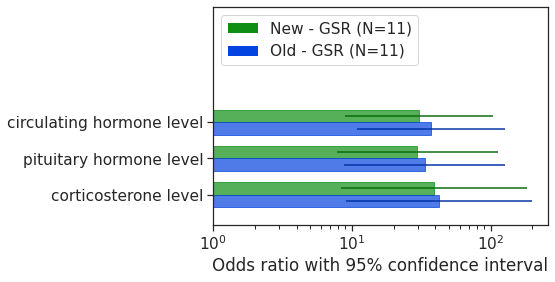

In [547]:
print("Abnormal homeostasis")
a = plot_hbar_comparison(all_results[all_results.observed > 1], communities=["C894", "C894_old"], mps="MP:0003953", horz=6, vert = 4, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

Abnormal blood homeostasis


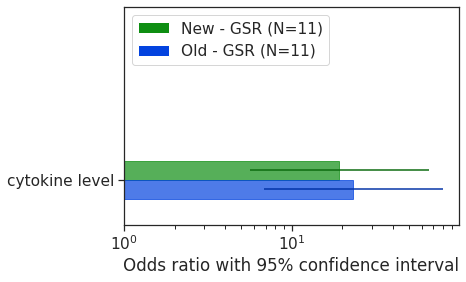

In [548]:
print("Abnormal blood homeostasis")
a = plot_hbar_comparison(all_results[all_results.observed > 1], communities=["C894", "C894_old"], mps="MP:0008835", horz=6, vert = 4, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

Abnormal circulating hormone level ~ abnormal hormone level


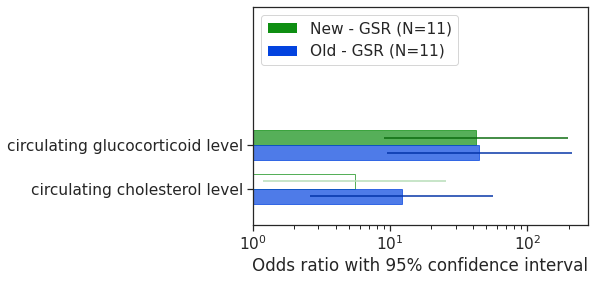

In [549]:
print("Abnormal circulating hormone level ~ abnormal hormone level")
a = plot_hbar_comparison(all_results[all_results.observed > 1], communities=["C894", "C894_old"], mps="MP:0003949", horz=6, vert =4, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

PARENT: MP:0009642 abnormal blood homeostasis


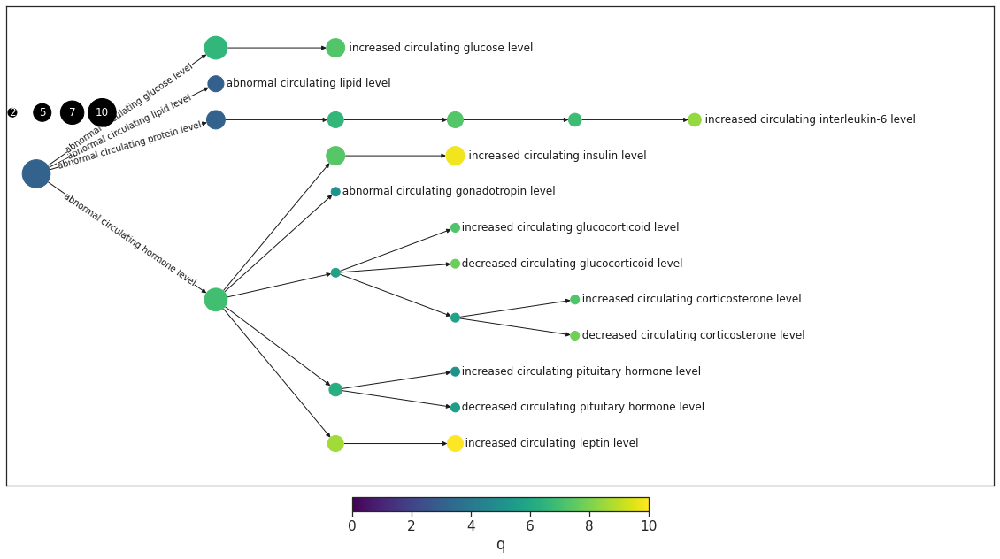

no hits passing filters


In [553]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C894", "MP:0009642", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="x",color_by="q", vert=12, label="leaf", 
                                descriptive_labels=True, adjust_root=0.1)
#get_hits(n, results, p=0.01, OR=2, obs_min=3, total=100000, level= 2)

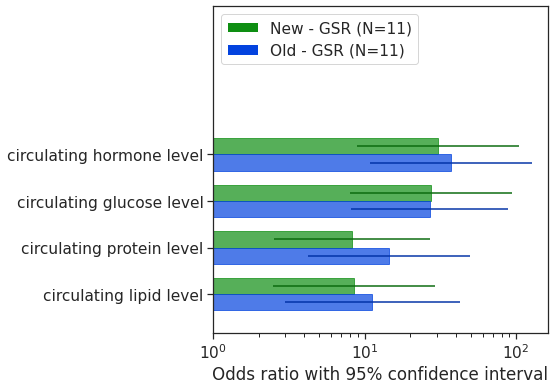

In [556]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C894", "C894_old"], mps="MP:0009642", horz=6, vert = 6, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

### Growth/body size

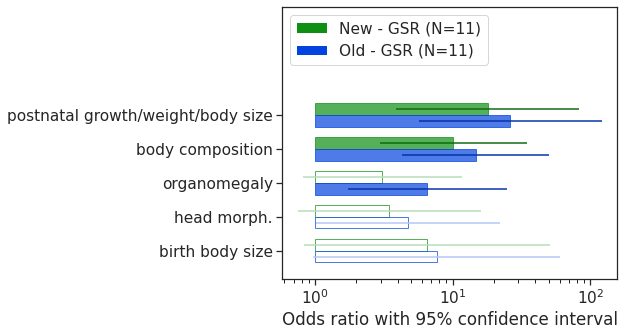

In [557]:
a = plot_hbar_comparison(all_results, communities=["C894", "C894_old"], mps="MP:0005378", horz=6, vert = 5, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

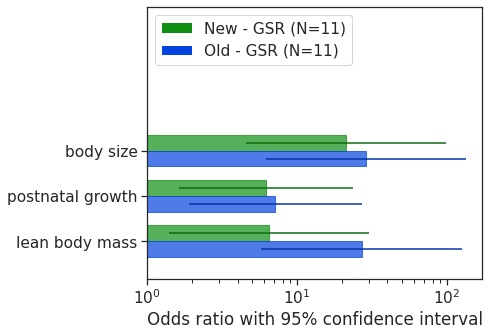

In [568]:
a = plot_hbar_comparison(all_results, communities=["C894", "C894_old"], mps="MP:0002089", horz=6, vert = 5, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

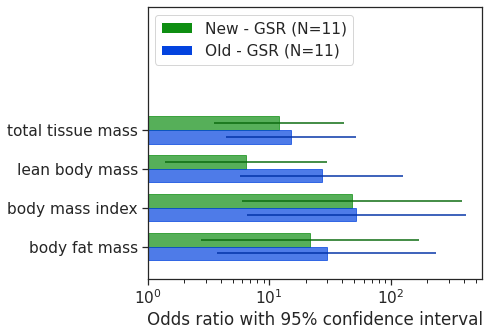

In [569]:
a = plot_hbar_comparison(all_results, communities=["C894", "C894_old"], mps="MP:0005451", horz=6, vert = 5, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

PARENT: MP:0005378 growth/size/body region phenotype


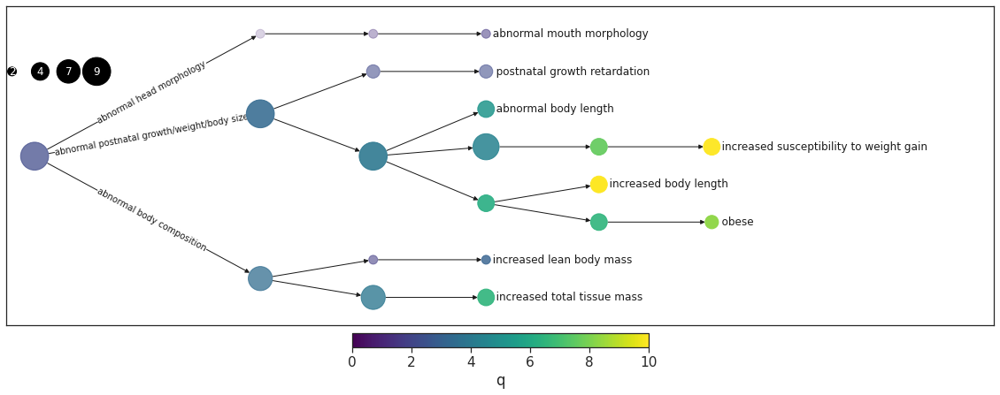

no hits passing filters


In [558]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C894", "MP:0005378", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=8, label="leaf", 
                                descriptive_labels=True, adjust_root=0.2)
get_hits(n, results, p=0.001, OR=2, obs_min=3, total=10000, level=4)

### Behavior/neurological

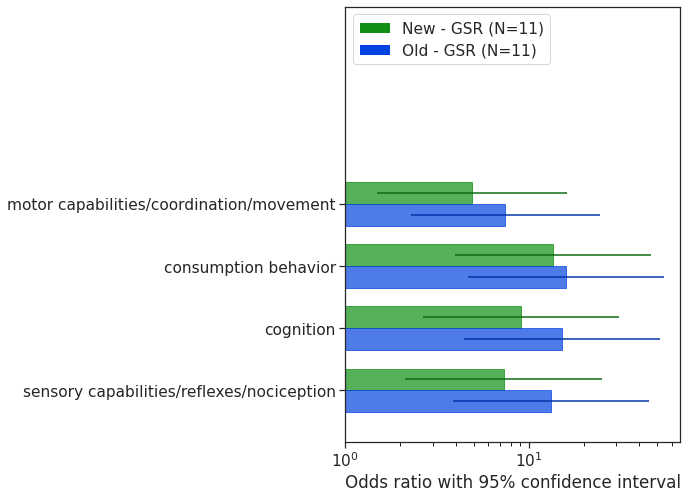

In [565]:
a = plot_hbar_comparison(all_results[all_results.observed>=4], communities=["C894", "C894_old"], mps="MP:0004924", horz=6, vert = 8, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

PARENT: MP:0004924 abnormal behavior


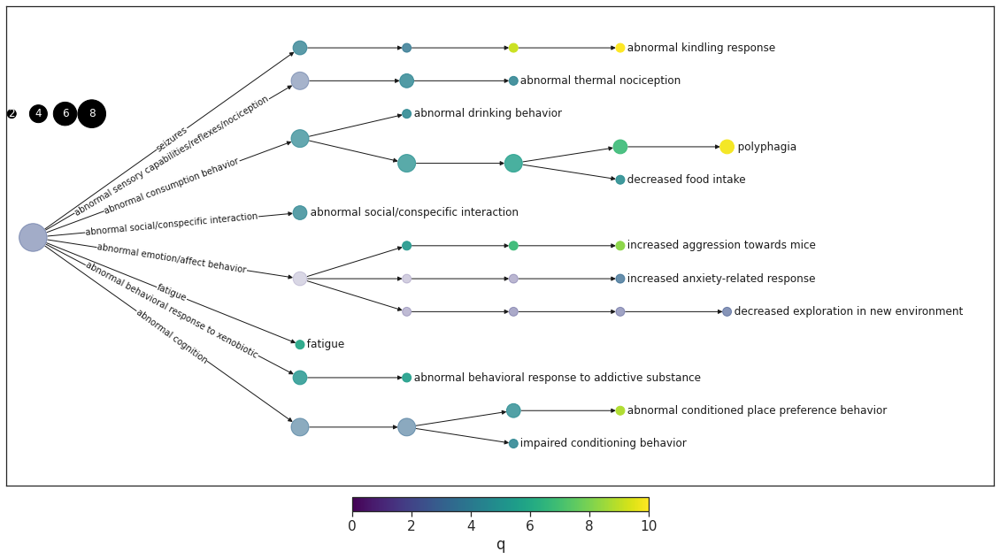

no hits passing filters


In [567]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C894", "MP:0004924", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=12, label="leaf", 
                                descriptive_labels=True, adjust_root=0.3)
get_hits(n, results, p=0.001, OR=2, obs_min=3, total=10000, level=3)

### Endo/exocrine gland

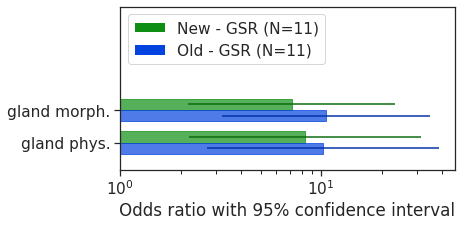

In [570]:
a = plot_hbar_comparison(all_results, communities=["C894", "C894_old"], mps="MP:0005379", horz=6, vert = 3, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

PARENT: MP:0005379 endocrine/exocrine gland phenotype


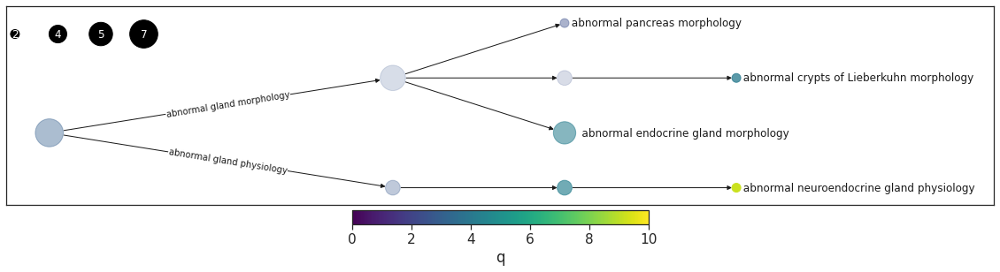

no hits passing filters


In [574]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C894", "MP:0005379", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=5, label="leaf", 
                                descriptive_labels=True, adjust_root=0.2)
get_hits(n, results, p=0.001, OR=2, obs_min=3, total=10000, level=3)

### Nervous system

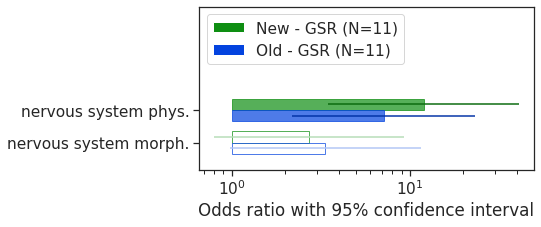

In [575]:
a = plot_hbar_comparison(all_results, communities=["C894", "C894_old"], mps="MP:0003631", horz=6, vert = 3, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

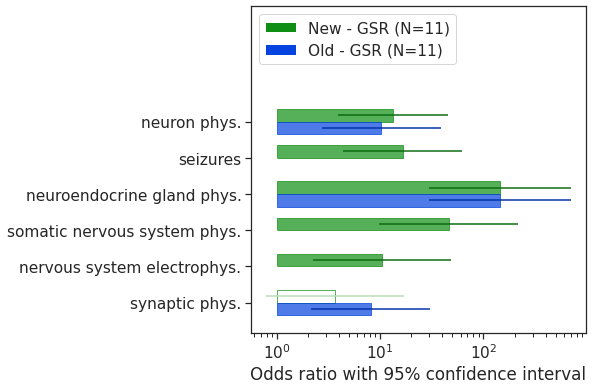

In [582]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C894", "C894_old"], mps="MP:0003633", horz=6, vert = 6, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

PARENT: MP:0003631 nervous system phenotype


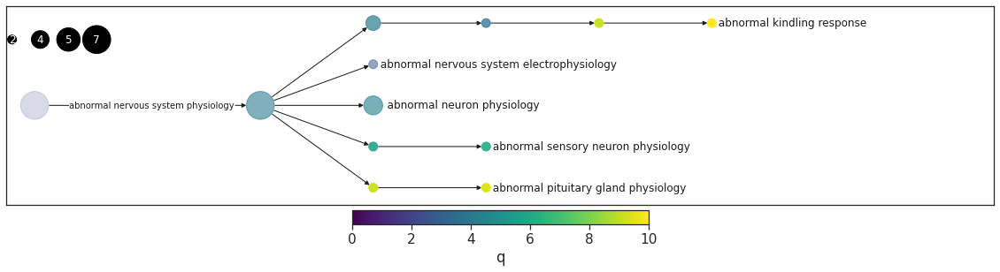

no hits passing filters


In [583]:
x = draw_significance_hierarchy(results.loc[results.observed>=2], "C894", "MP:0003631", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=5, label="leaf", 
                                descriptive_labels=True, adjust_root=0.2)
get_hits(x, results, p=0.001, OR=2, obs_min=3, total=10000, level=3)

### Mortality/aging

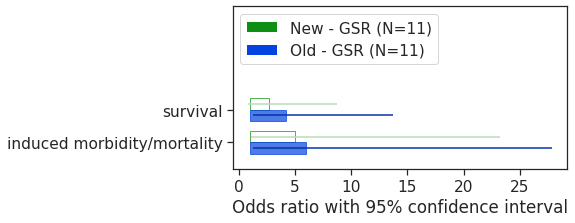

In [584]:
a = plot_hbar_comparison(all_results, communities=["C894", "C894_old"], mps="MP:0010768", horz=6, vert = 3, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

PARENT: MP:0010768 mortality/aging


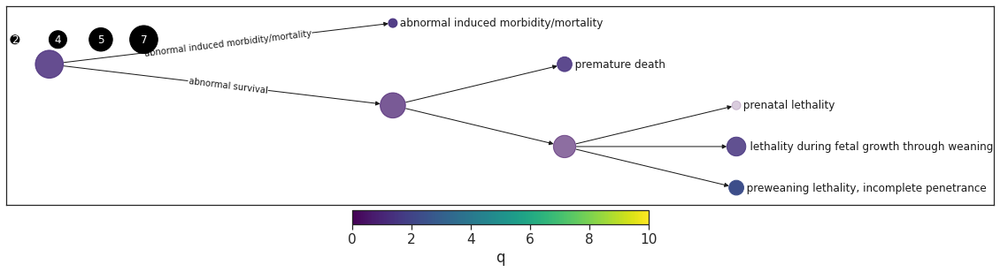

no hits passing filters


In [586]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C894", "MP:0010768", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=5, label="leaf", 
                                descriptive_labels=True, adjust_root=0.2)
get_hits(n, results, p=0.001, OR=2, obs_min=3, total=10000, level=3)

### Hematopoetic

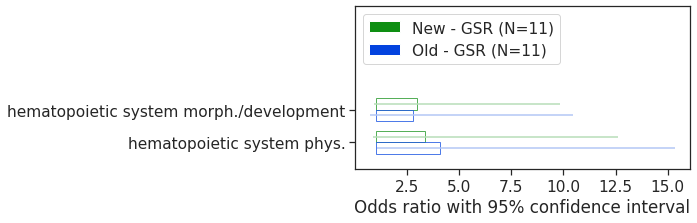

In [587]:
a = plot_hbar_comparison(all_results, communities=["C894", "C894_old"], mps="MP:0005397", horz=6, vert = 3, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

PARENT: MP:0005397 hematopoietic system phenotype


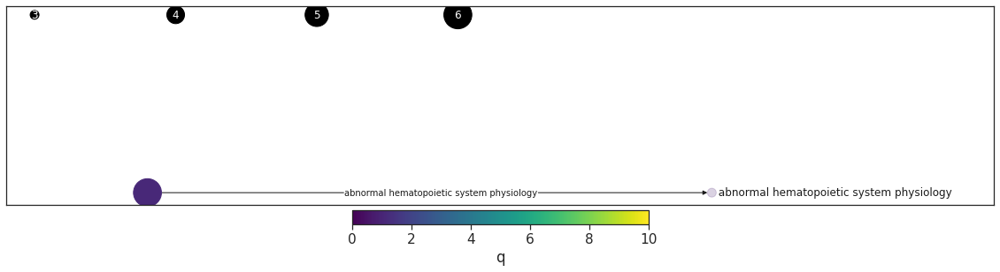

no hits passing filters


In [591]:
x = draw_significance_hierarchy(results.loc[results.observed>=2], "C894", "MP:0005397", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=5, label="leaf", 
                                descriptive_labels=True, adjust_root=0)
get_hits(x, results, p=0.001, OR=2, obs_min=3, total=10000, level=3)

### Cellular

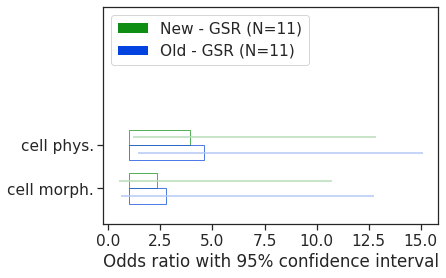

In [589]:
a = plot_hbar_comparison(all_results, communities=["C894", "C894_old"], mps="MP:0005384", horz=6, vert = 4, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

PARENT: MP:0005384 cellular phenotype


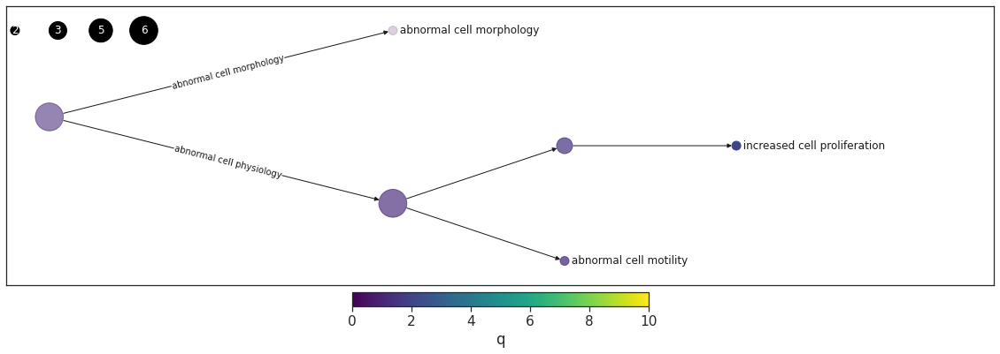

no hits passing filters


In [593]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C894", "MP:0005384", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=7, label="leaf", 
                                descriptive_labels=True, adjust_root=0.2)
get_hits(n, results, p=0.001, OR=2, obs_min=3, total=10000, level=3)

### Reproductive

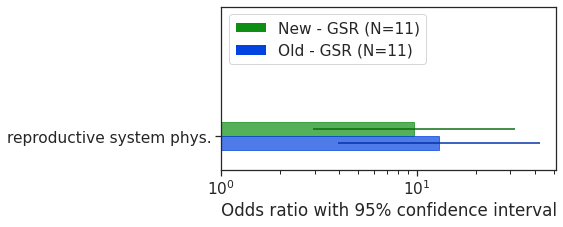

In [594]:
a = plot_hbar_comparison(all_results, communities=["C894", "C894_old"], mps="MP:0005389", horz=6, vert = 3, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")


PARENT: MP:0005389 reproductive system phenotype


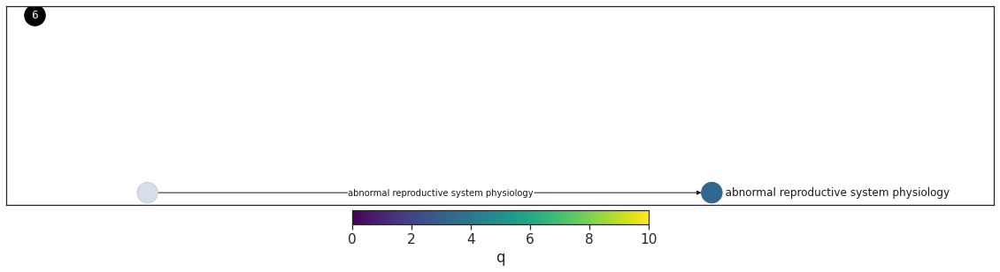

no hits passing filters


In [597]:
x = draw_significance_hierarchy(results.loc[results.observed>=2], "C894", "MP:0005389", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=5, label="leaf", 
                                descriptive_labels=True, adjust_root=0)
get_hits(x, results, p=0.001, OR=2, obs_min=3, total=10000, level=3)

### Immune system


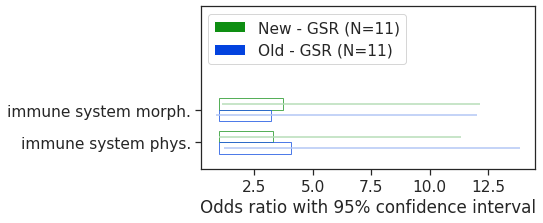

In [598]:
a = plot_hbar_comparison(all_results, communities=["C894", "C894_old"], mps="MP:0005387", horz=6, vert = 3, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

PARENT: MP:0005387 immune system phenotype


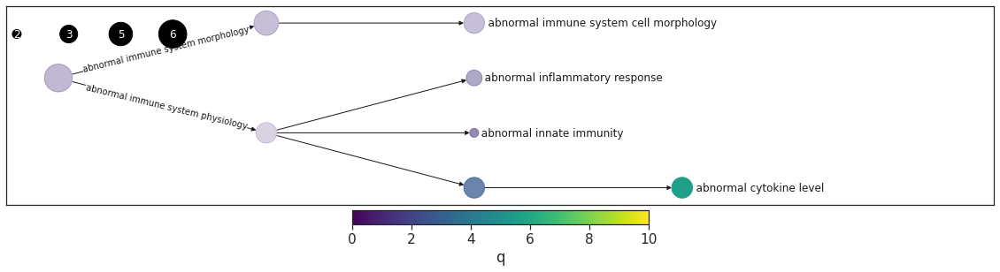

no hits passing filters


In [599]:
x = draw_significance_hierarchy(results.loc[results.observed>=2], "C894", "MP:0005387", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=5, label="leaf", 
                                descriptive_labels=True, adjust_root=0)
get_hits(x, results, p=0.001, OR=2, obs_min=3, total=10000, level=3)

### Cardiovascular

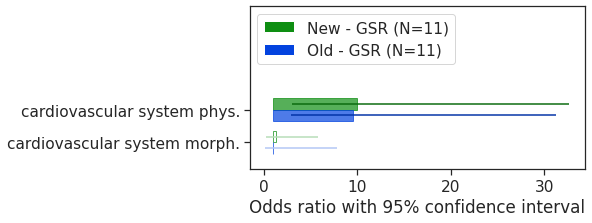

In [600]:
a = plot_hbar_comparison(all_results, communities=["C894", "C894_old"], mps="MP:0005385", horz=6, vert = 3, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

PARENT: MP:0005385 cardiovascular system phenotype


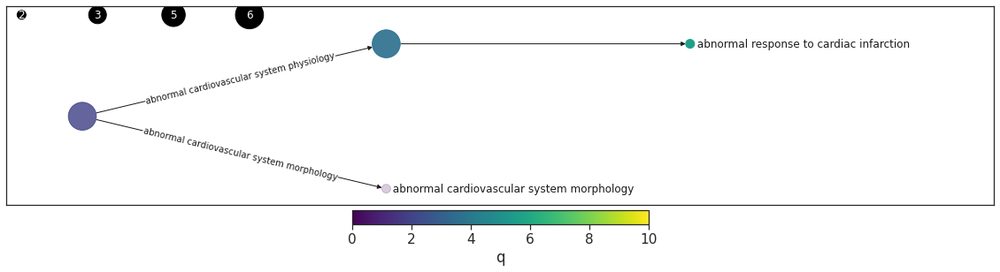

no hits passing filters


In [601]:
x = draw_significance_hierarchy(results.loc[results.observed>=2], "C894", "MP:0005385", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=5, label="leaf", 
                                descriptive_labels=True, adjust_root=0)
get_hits(x, results, p=0.001, OR=2, obs_min=3, total=10000, level=3)

### Adipose

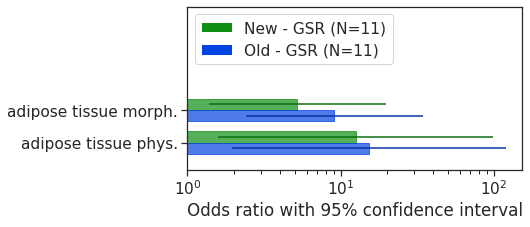

In [602]:
a = plot_hbar_comparison(all_results, communities=["C894", "C894_old"], mps="MP:0005375", horz=6, vert = 3, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

PARENT: MP:0005375 adipose tissue phenotype


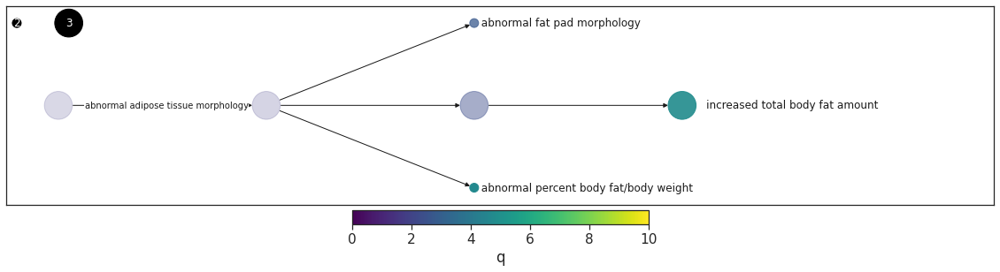

no hits passing filters


In [603]:
x = draw_significance_hierarchy(results.loc[results.observed>=2], "C894", "MP:0005375", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=5, label="leaf", 
                                descriptive_labels=True, adjust_root=0)
get_hits(x, results, p=0.001, OR=2, obs_min=3, total=10000, level=3)

### Adipose

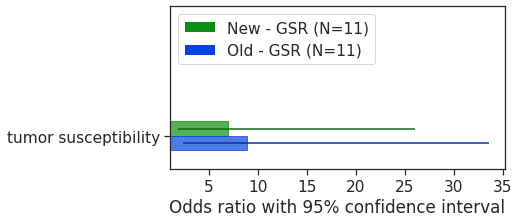

In [604]:
a = plot_hbar_comparison(all_results, communities=["C894", "C894_old"], mps="MP:0002006", horz=6, vert = 3, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - GSR", "Old - GSR"], sort_by="observed", label_number="percent_community")

PARENT: MP:0002006 neoplasm


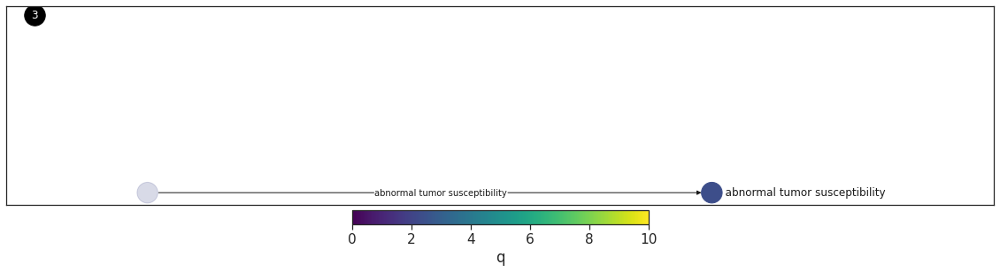

no hits passing filters


In [605]:
x = draw_significance_hierarchy(results.loc[results.observed>=2], "C894", "MP:0002006", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=5, label="leaf", 
                                descriptive_labels=True, adjust_root=0)
get_hits(x, results, p=0.001, OR=2, obs_min=3, total=10000, level=3)

## DM1/DM2/DM3 - C882/C886/C900

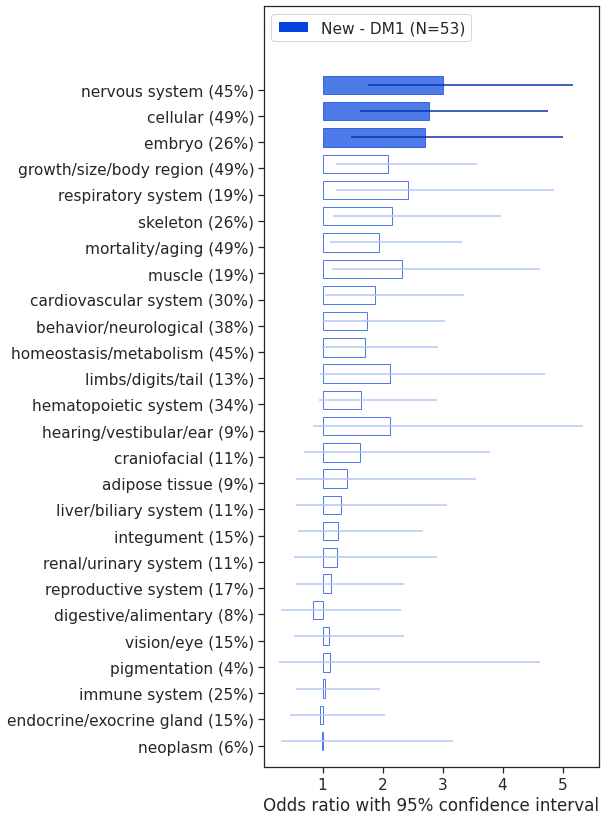

In [47]:
a = plot_hbar_comparison(all_results, communities=["C882"], mps=top_level, horz=6, vert = 14,
                         sig_level=0.05, community_names=["New - DM1"], sort_by="q", 
                         label_number="percent_community")

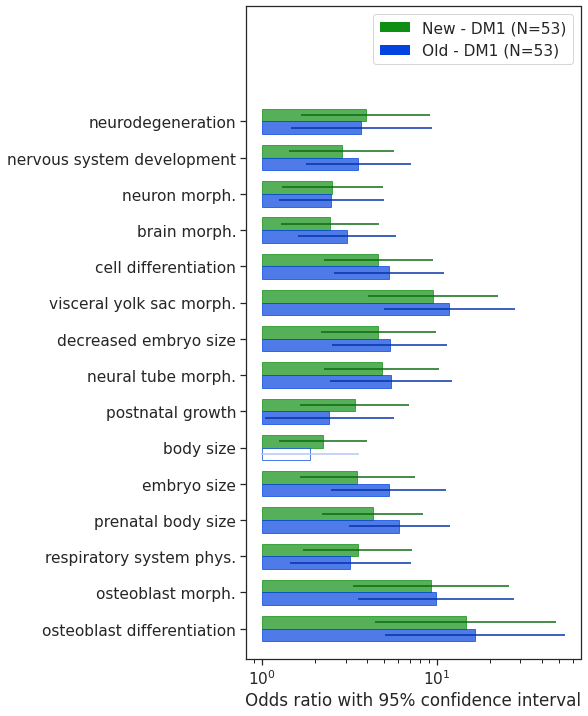

In [38]:
terms = [2229,3861,2882,2152,5076,1718,1698,2151,1731,3956,1697,10866,2133,4986,8395]
terms = [num_to_mp(t) for t in terms]
a = plot_hbar_comparison(all_results, communities=["C882", "C882_old"], mps=terms, horz=6, vert = 12,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - DM1", "Old - DM1"], sort_by=None, label_number="percent_community", 
                        correct_by_community=False)

PARENT: MP:0000001 mammalian phenotype


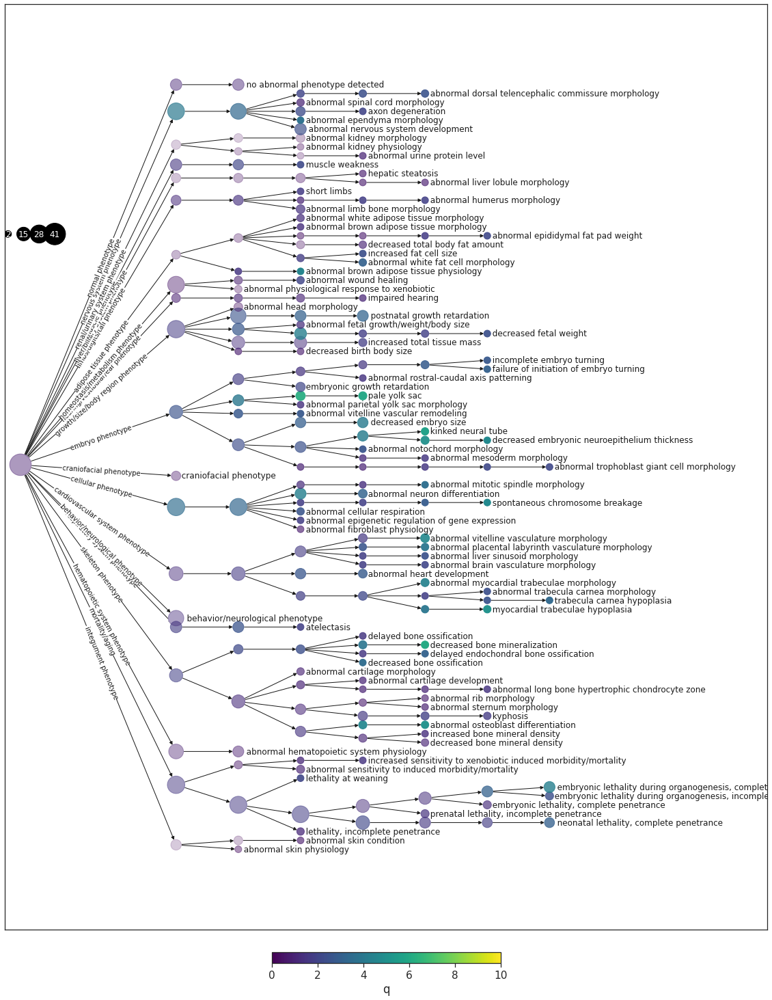

In [301]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C882", "MP:0000001", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=30, label="leaf", 
                                descriptive_labels=True, adjust_root=0.3)

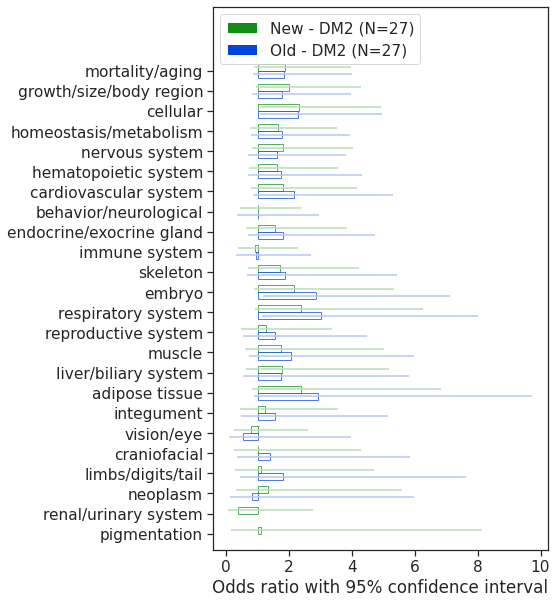

In [302]:
a = plot_hbar_comparison(all_results, communities=["C886", "C886_old"], mps=top_level, horz=6, vert = 10,
                         sig_level=0.05, community_names=["New - DM2", "Old - DM2"], sort_by="observed", label_number="percent_community")

PARENT: MP:0000001 mammalian phenotype


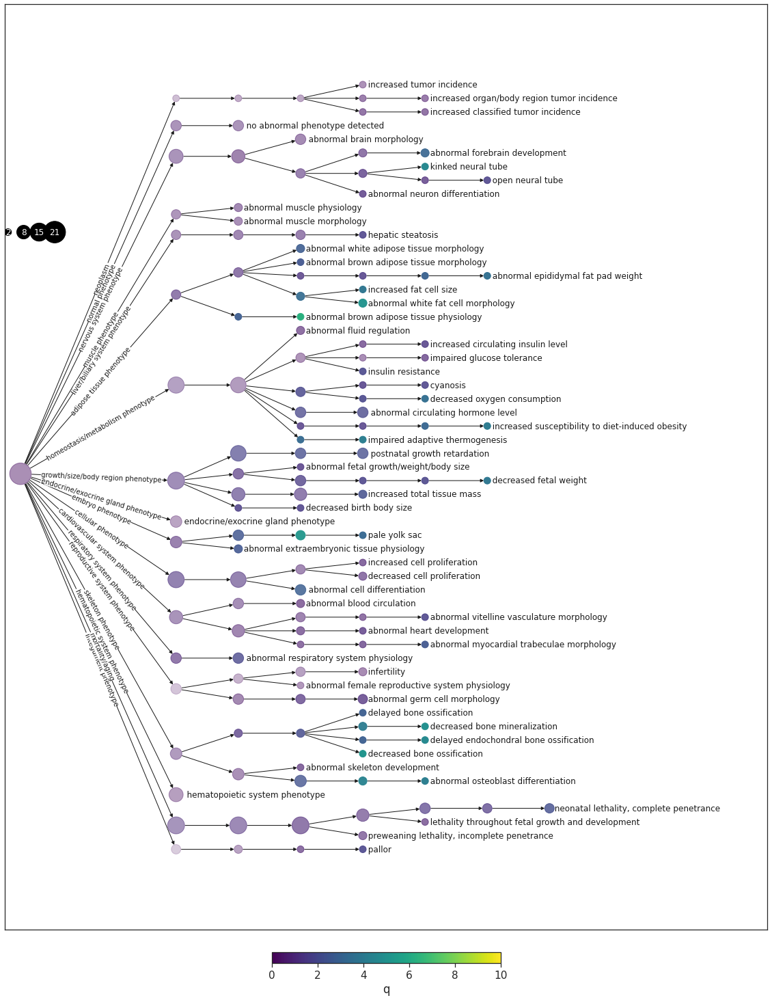

In [303]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C886", "MP:0000001", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=30, label="leaf", 
                                descriptive_labels=True, adjust_root=0.3)


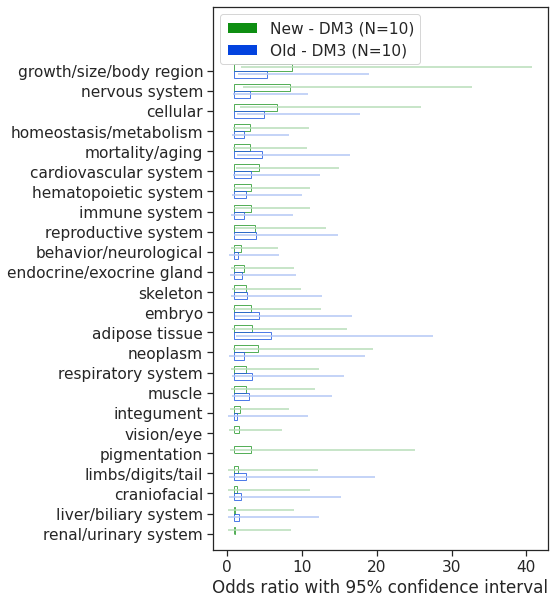

In [304]:
a = plot_hbar_comparison(all_results, communities=["C900", "C900_old"], mps=top_level, horz=6, vert = 10,
                         sig_level=0.05, community_names=["New - DM3", "Old - DM3"], sort_by="observed", label_number="percent_community")

PARENT: MP:0000001 mammalian phenotype


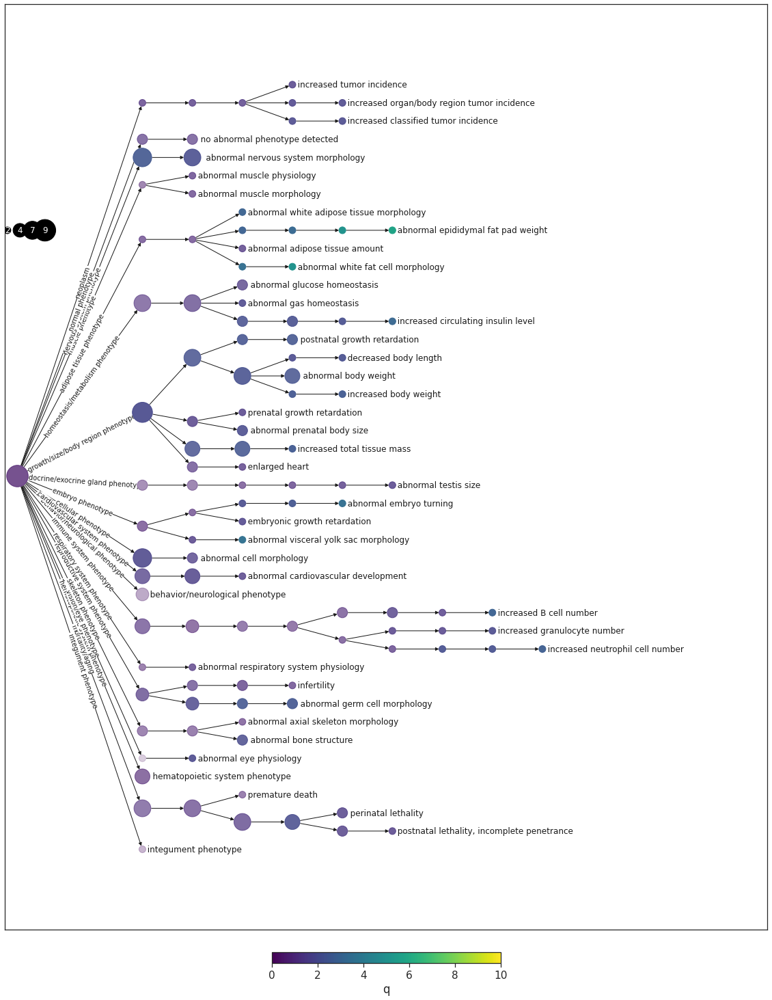

In [305]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C900", "MP:0000001", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=30, label="leaf", 
                                descriptive_labels=True, adjust_root=0.3)


### Nervous System

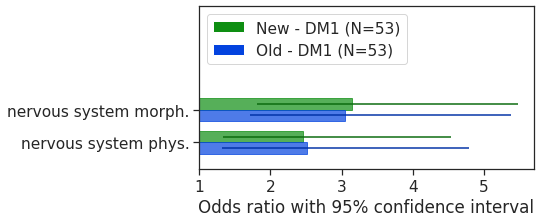

In [509]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C882", "C882_old"], mps="MP:0003631", horz=6, vert = 3,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - DM1", "Old - DM1"], sort_by="observed", label_number="percent_community")

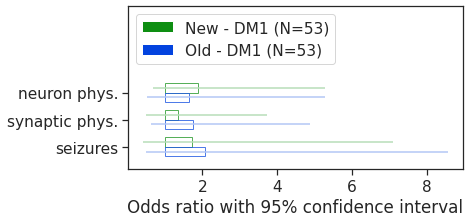

In [510]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C882", "C882_old"], mps="MP:0003633", horz=6, vert = 3,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - DM1", "Old - DM1"], sort_by="observed", label_number="percent_community")

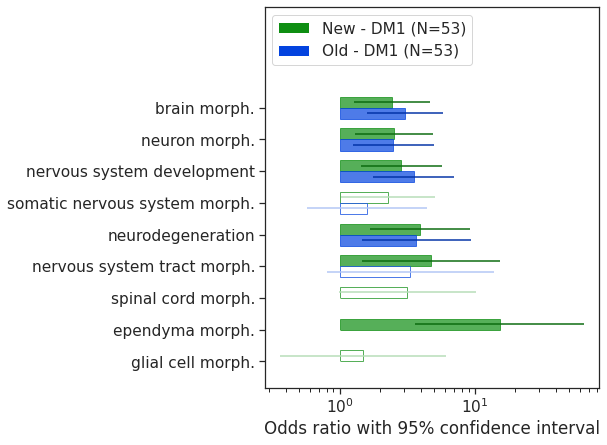

In [512]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C882", "C882_old"], mps="MP:0003632", horz=6, vert = 7,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - DM1", "Old - DM1"], sort_by="observed", label_number="percent_community")

PARENT: MP:0003631 nervous system phenotype


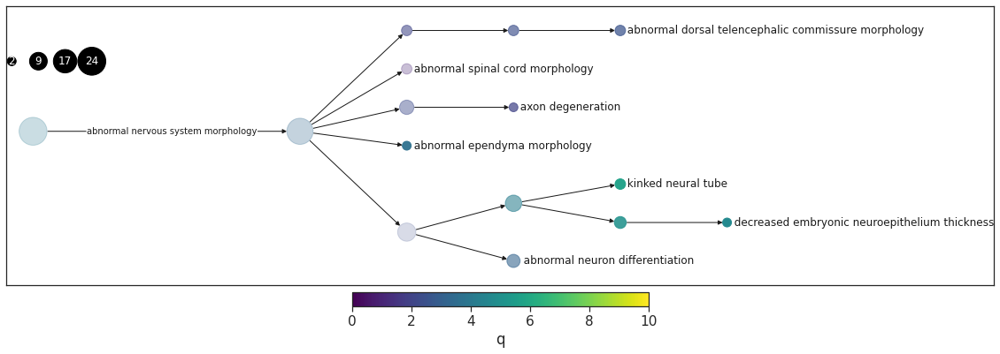

no hits passing filters


In [33]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C882", "MP:0003631", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=7, label="leaf", 
                                descriptive_labels=True, adjust_root=0.3)
get_hits(n, results, p=0.01, OR=2, obs_min=7, total=10000, level=3)

### Cellular

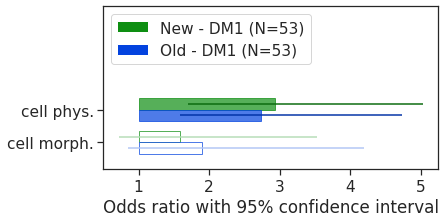

In [489]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C882", "C882_old"], mps="MP:0005384", horz=6, vert = 3,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - DM1", "Old - DM1"], sort_by="observed", label_number="percent_community")


PARENT: MP:0005384 cellular phenotype


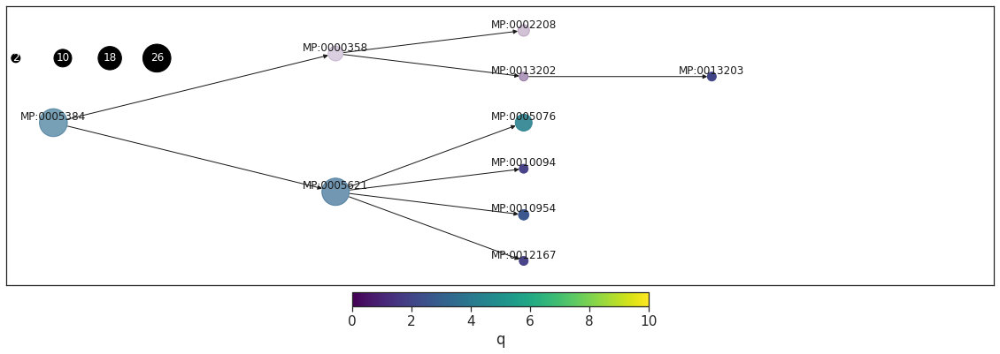

no hits passing filters


In [491]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C882", "MP:0005384", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=7, label="all", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.01, OR=2, obs_min=7, total=10000, level=3)


### Embryo

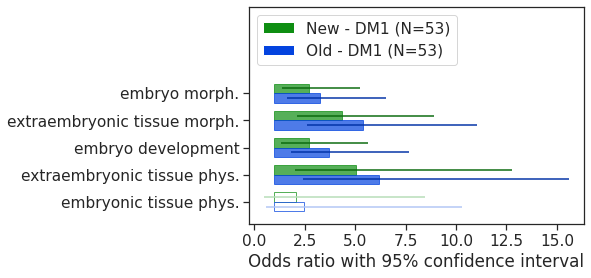

In [492]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C882", "C882_old"], mps="MP:0005380", horz=6, vert = 4,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - DM1", "Old - DM1"], sort_by="observed", label_number="percent_community")

PARENT: MP:0005380 embryo phenotype


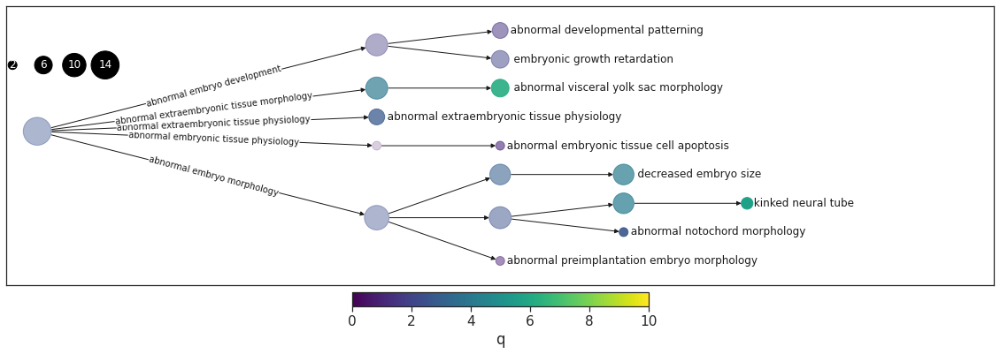

no hits passing filters


In [495]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C882", "MP:0005380", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=7, label="leaf", 
                                descriptive_labels=True, adjust_root=0.35)
get_hits(n, results, p=0.01, OR=2, obs_min=7, total=10000, level=3)

### Growth/body size

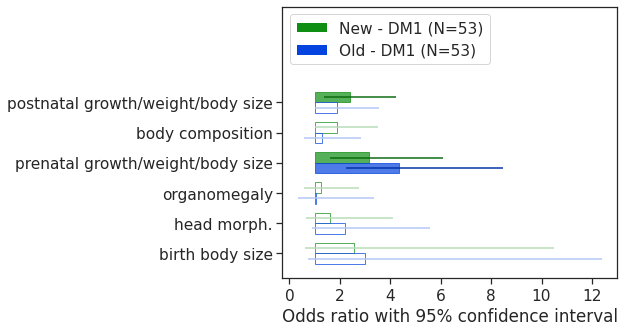

In [496]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C882", "C882_old"], mps="MP:0005378", horz=6, vert = 5,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - DM1", "Old - DM1"], sort_by="observed", label_number="percent_community")

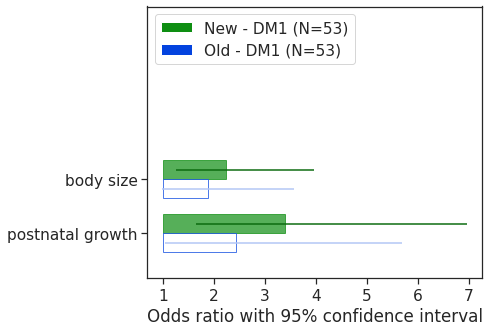

In [499]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C882", "C882_old"], mps="MP:0002089", horz=6, vert = 5,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - DM1", "Old - DM1"], sort_by="observed", label_number="percent_community")

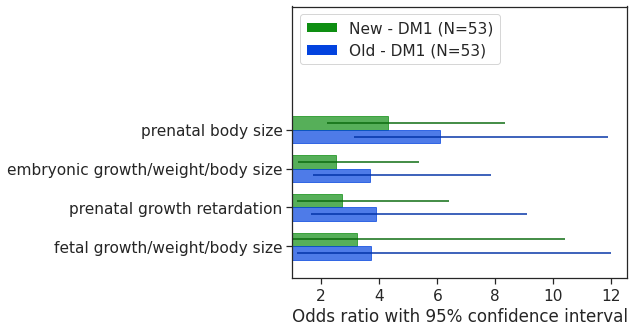

In [501]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C882", "C882_old"], mps="MP:0004196", horz=6, vert = 5,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - DM1", "Old - DM1"], sort_by="observed", label_number="percent_community")

PARENT: MP:0004196 abnormal prenatal growth/weight/body size


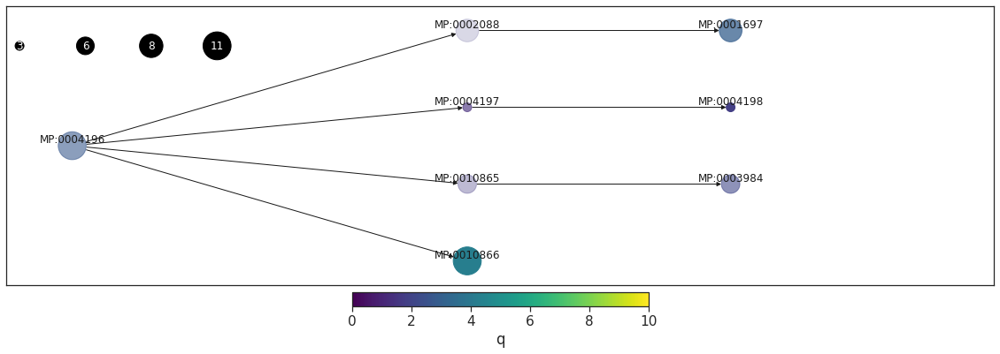

no hits passing filters


In [503]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C882", "MP:0004196", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=7, label="all", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.01, OR=2, obs_min=7, total=10000, level=3)

PARENT: MP:0002089 abnormal postnatal growth/weight/body size


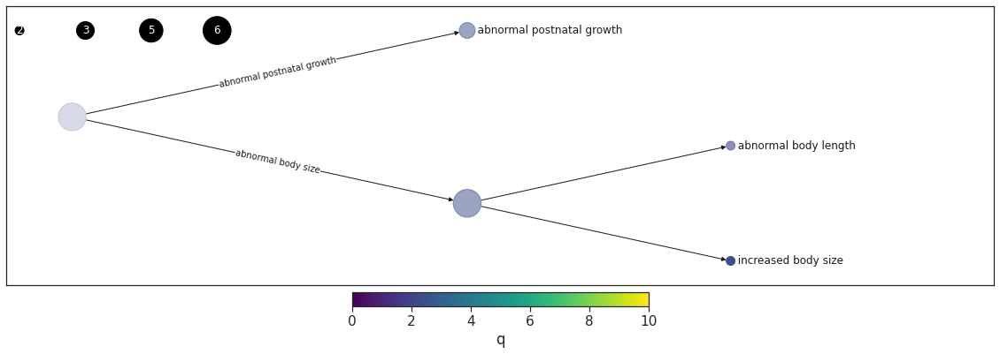

no hits passing filters


In [504]:
# check the C900 postnatal body size signal
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C900", "MP:0002089", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=7, label="leaf", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=10000, level=3)

### respiratory

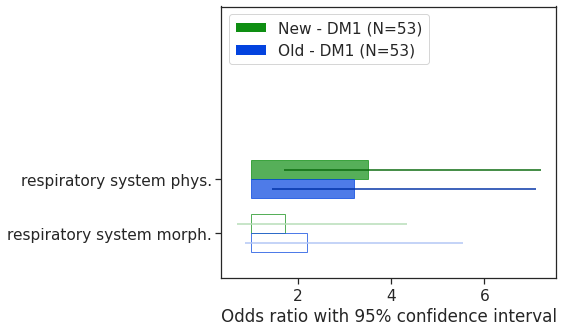

In [507]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C882", "C882_old"], mps="MP:0005388", horz=6, vert = 5,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - DM1", "Old - DM1"], sort_by="observed", label_number="percent_community")

PARENT: MP:0005388 respiratory system phenotype


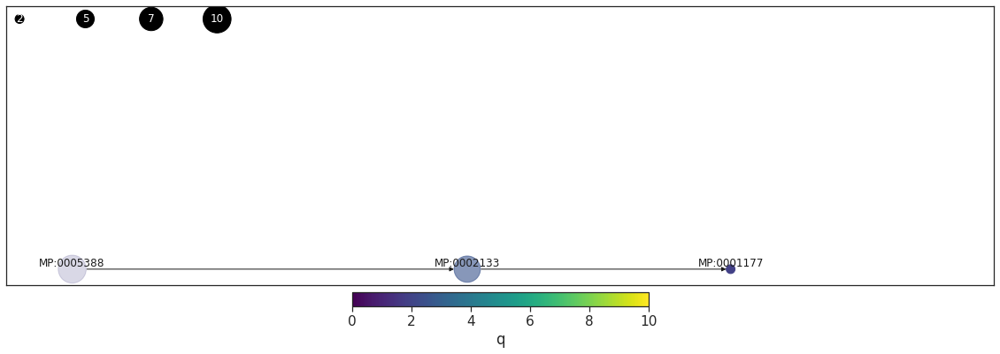

no hits passing filters


In [37]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C882", "MP:0005388", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=7, label="all", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.01, OR=2, obs_min=7, total=10000, level=3)

### Skeleton

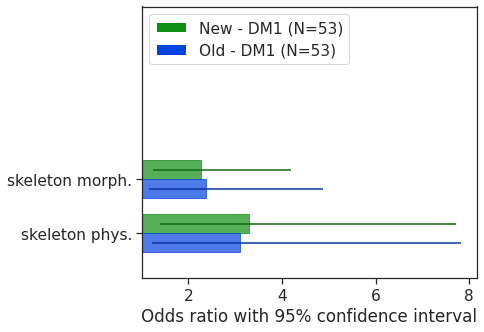

In [533]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C882", "C882_old"], mps="MP:0005390", horz=6, vert = 5,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - DM1", "Old - DM1"], sort_by="observed", label_number="percent_community")

PARENT: MP:0005390 skeleton phenotype


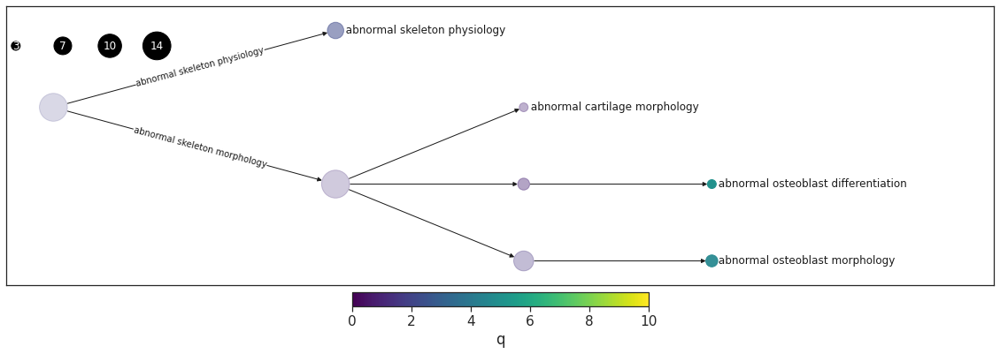

no hits passing filters


In [534]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C882", "MP:0005390", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=7, label="leaf", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.01, OR=2, obs_min=7, total=10000, level=3)

In [535]:
n

,OR,q,obs,hits
MP:0005390,2.151037,1.848660,14,"[SPG7, DOCK2, UTRN, KDM3A, CCP110, ZNF106, SP3..."
MP:0005508,2.270562,1.218284,14,"[SPG7, DOCK2, UTRN, KDM3A, CCP110, ZNF106, SP3..."
MP:0003795,2.487043,1.446085,8,"[DOCK2, KDM3A, SP3, KDM6B, NBR1, GDAP2, KDM6A,..."
MP:0004986,9.259831,4.635670,4,"[NBR1, USP34, SP3, KDM6B]"
MP:0002113,2.787281,1.004369,4,"[NBR1, STK4, SP3, KDM6B]"
MP:0008395,14.563636,5.016156,3,"[NBR1, SP3, KDM6B]"
MP:0000163,2.570888,0.945464,3,"[CCP110, STK4, KDM6B]"
MP:0001533,3.285143,2.202111,6,"[CCP110, SP3, KDM6B, NBR1, STK4, USP34]"


### Mortality/aging

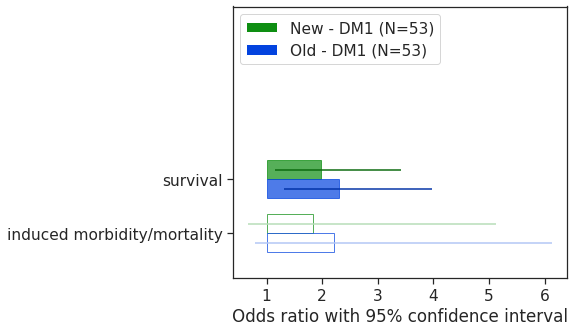

In [44]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C882", "C882_old"], mps="MP:0010768", horz=6, vert = 5,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - DM1", "Old - DM1"], sort_by="observed", label_number="percent_community")

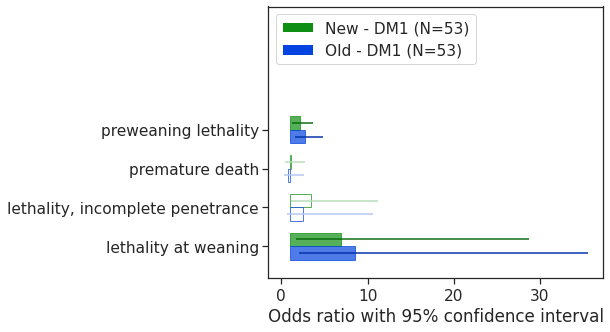

In [45]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C882", "C882_old"], mps="MP:0010769", horz=6, vert = 5,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - DM1", "Old - DM1"], sort_by="observed", label_number="percent_community")

PARENT: MP:0010768 mortality/aging


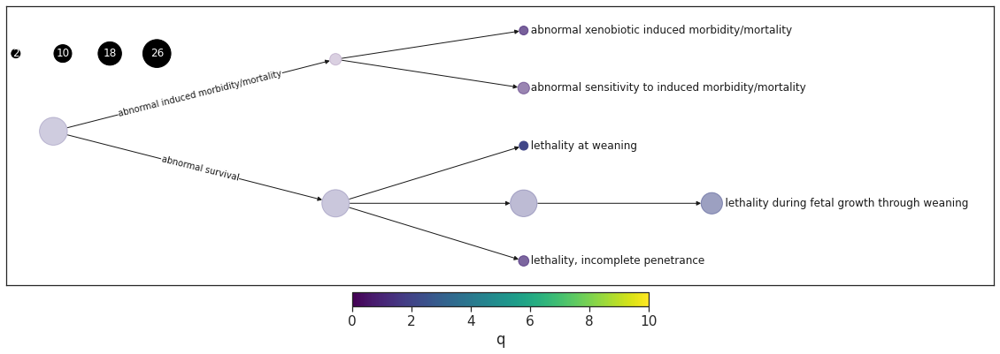

no hits passing filters


In [506]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C882", "MP:0010768", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=7, label="leaf", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.01, OR=2, obs_min=7, total=10000, level=3)

### Homeostasis/metabolism

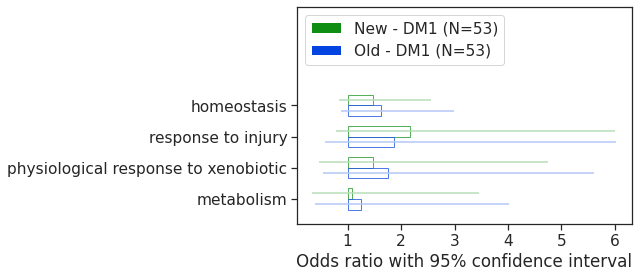

In [314]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C882", "C882_old"], mps="MP:0005376", horz=6, vert = 4,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - DM1", "Old - DM1"], sort_by="observed", label_number="percent_community")

PARENT: MP:0005376 homeostasis/metabolism phenotype


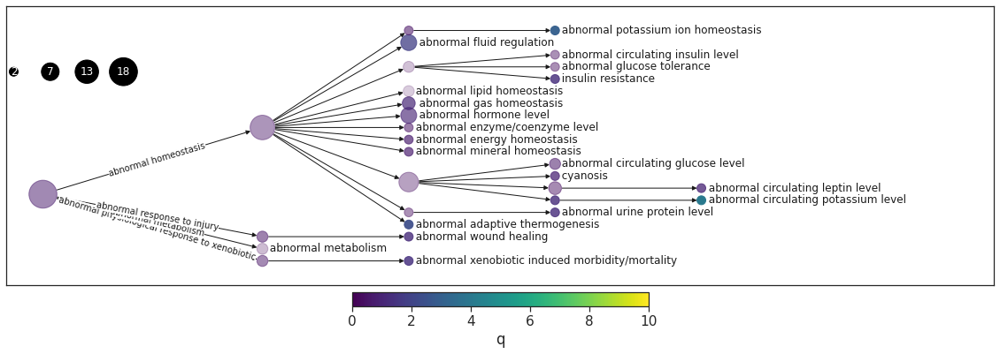

,OR,q,obs,hits,total,description,depth


In [578]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C882", "MP:0005376", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=7, label="leaf", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.01, OR=2, obs_min=7, total=10000, level=3)

### Cardiovascular

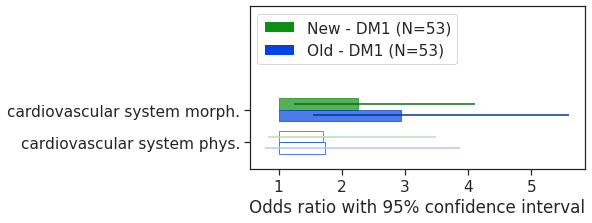

In [315]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C882", "C882_old"], mps="MP:0005385", horz=6, vert = 3,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - DM1", "Old - DM1"], sort_by="observed", label_number="percent_community")

PARENT: MP:0005385 cardiovascular system phenotype


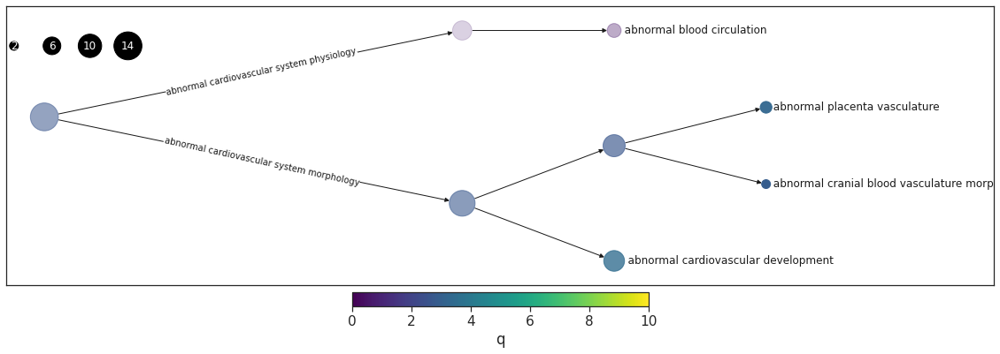

,OR,q,obs,hits,total,description,depth
MP:0002925,4.443213,3.482551,8.0,"[KDM6A, WNK1, AXIN1, UBR2, KDM8, STK4, CCP110,...",730.0,abnormal cardiovascular development,3
MP:0001614,3.310752,2.691109,9.0,"[ZBTB20, JMJD8, WNK1, HPS4, SP3, UBR2, STK4, K...",1101.0,abnormal blood vessel morphology,3


In [579]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C882", "MP:0005385", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=7, label="leaf", 
                                descriptive_labels=True, adjust_root=0.35)
get_hits(n, results, p=0.01, OR=2, obs_min=7, total=10000, level=3)

## MSC - C907

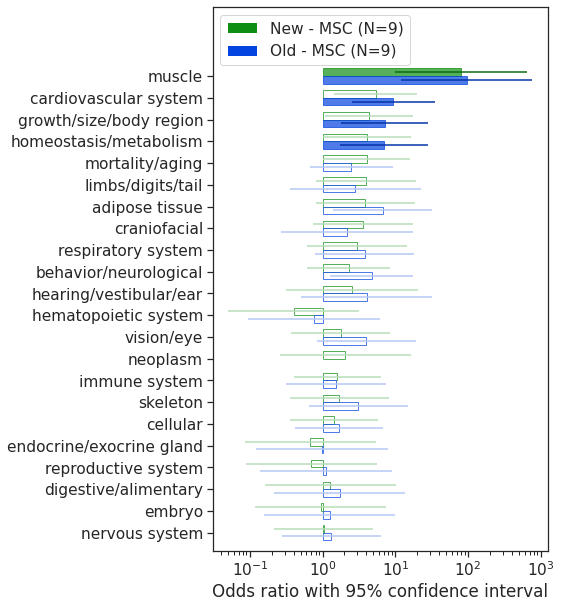

In [18]:
a = plot_hbar_comparison(all_results, communities=["C907", "C907_old"], mps=top_level, horz=6, vert = 10,
                         sig_level=0.05, community_names=["New - MSC", "Old - MSC"], sort_by="q", label_number="percent_community",
                        correct_by_community=True)

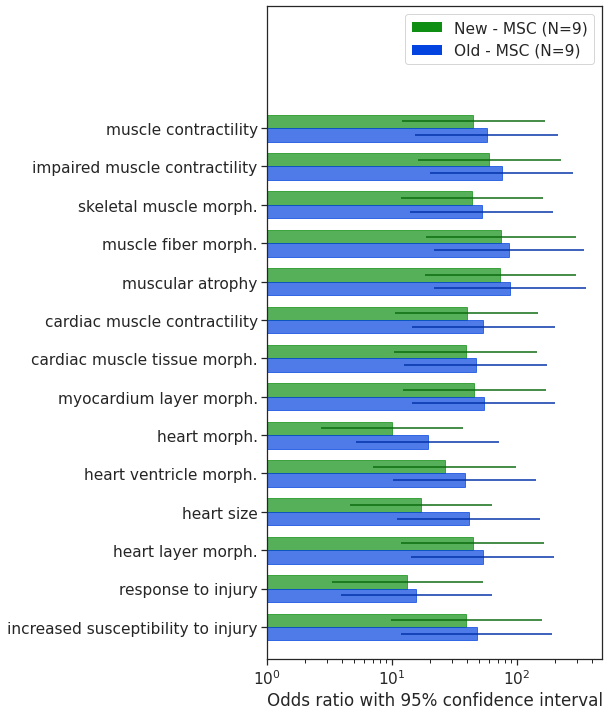

In [25]:
terms = [5620, 738,759,4087,2269,2972, 10630, 5329,266, 5294, 5406, 10545, 5164, 5165]
terms = [num_to_mp(t) for t in terms]
a = plot_hbar_comparison(all_results, communities=["C907", "C907_old"], mps=terms, horz=6, vert = 12,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - MSC", "Old - MSC"], sort_by=None, label_number="percent_community", 
                        correct_by_community=False)

PARENT: MP:0000001 mammalian phenotype


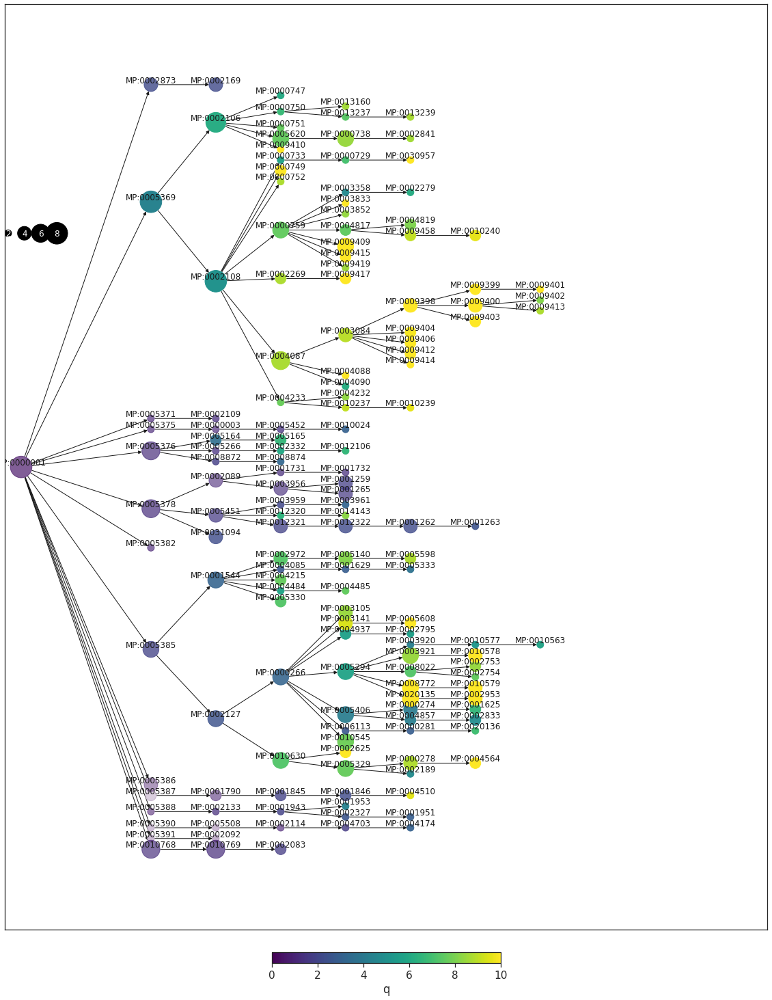

In [19]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C907", "MP:0000001", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=30, label="all", 
                                descriptive_labels=True, adjust_root=0.2)

### Muscle

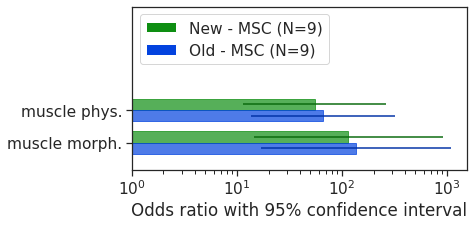

In [468]:
a = plot_hbar_comparison(all_results.loc[all_results.observed>=2], communities=["C907", "C907_old"], mps="MP:0005369", horz=6, vert=3, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - MSC", "Old - MSC"], sort_by="q", label_number="percent_community")


PARENT: MP:0002106 abnormal muscle physiology


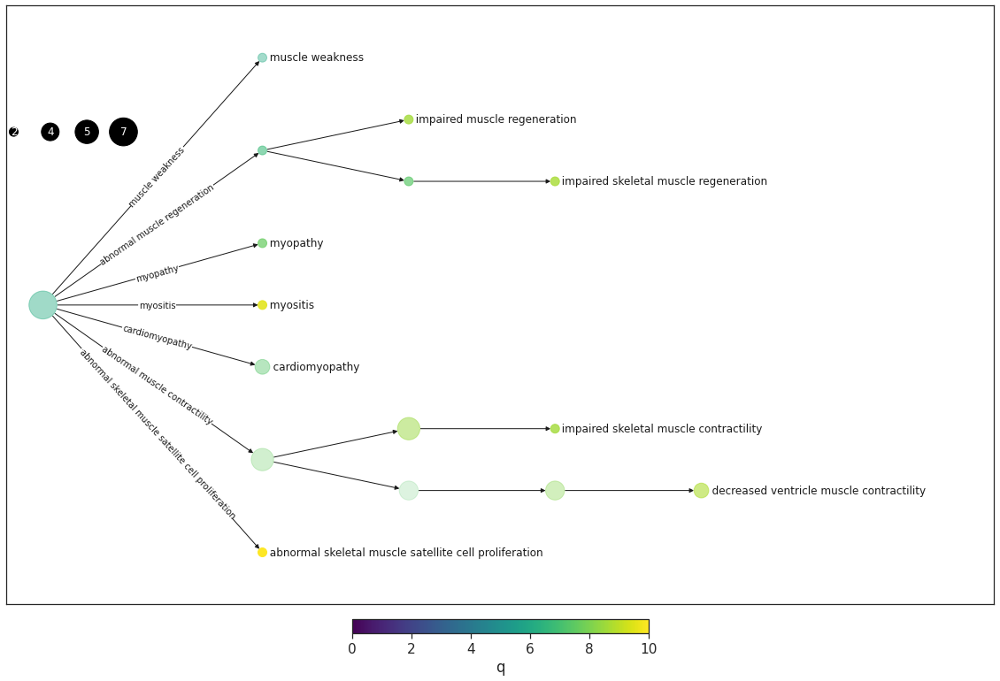

no hits passing filters


In [470]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C907", "MP:0002106", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=15, label="leaf", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=10000, level=3)

PARENT: MP:0002108 abnormal muscle morphology


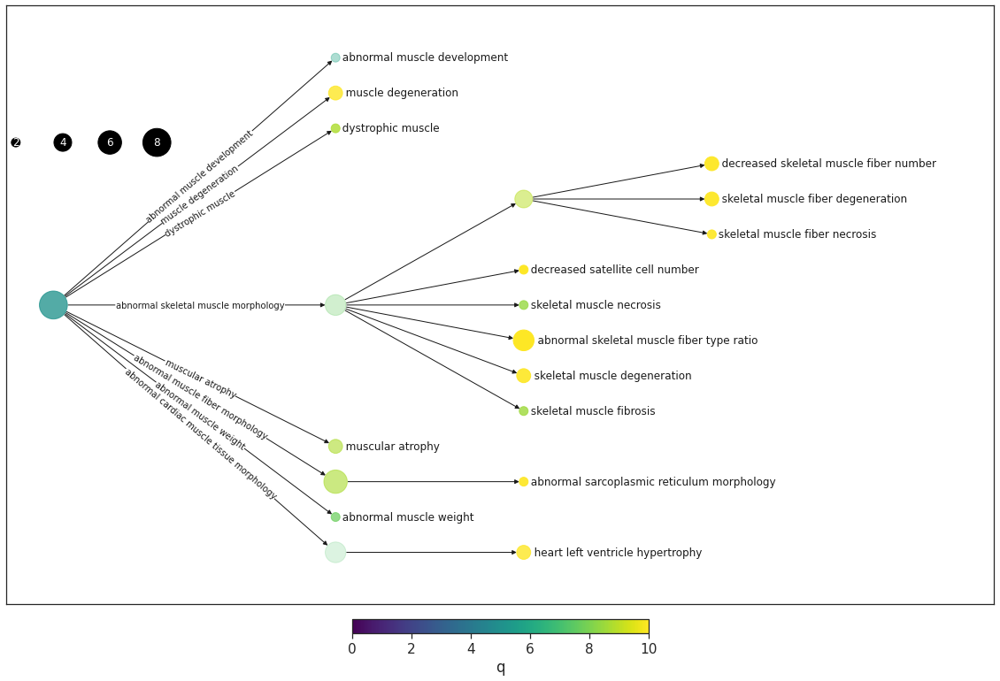

no hits passing filters


In [471]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C907", "MP:0002108", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=15, label="leaf", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=10000, level=3)

### Cardiovascular

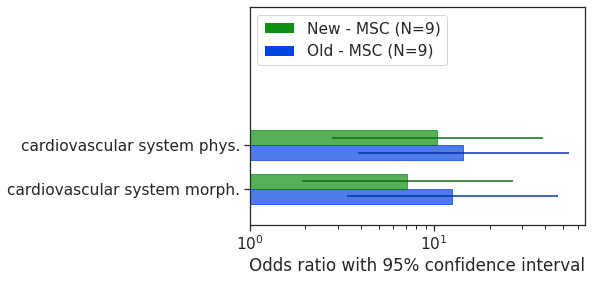

In [483]:
a = plot_hbar_comparison(all_results.loc[all_results.observed>=2], communities=["C907", "C907_old"], mps="MP:0005385", horz=6, vert=4, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - MSC", "Old - MSC"], sort_by="q", label_number="percent_community")

PARENT: MP:0005385 cardiovascular system phenotype


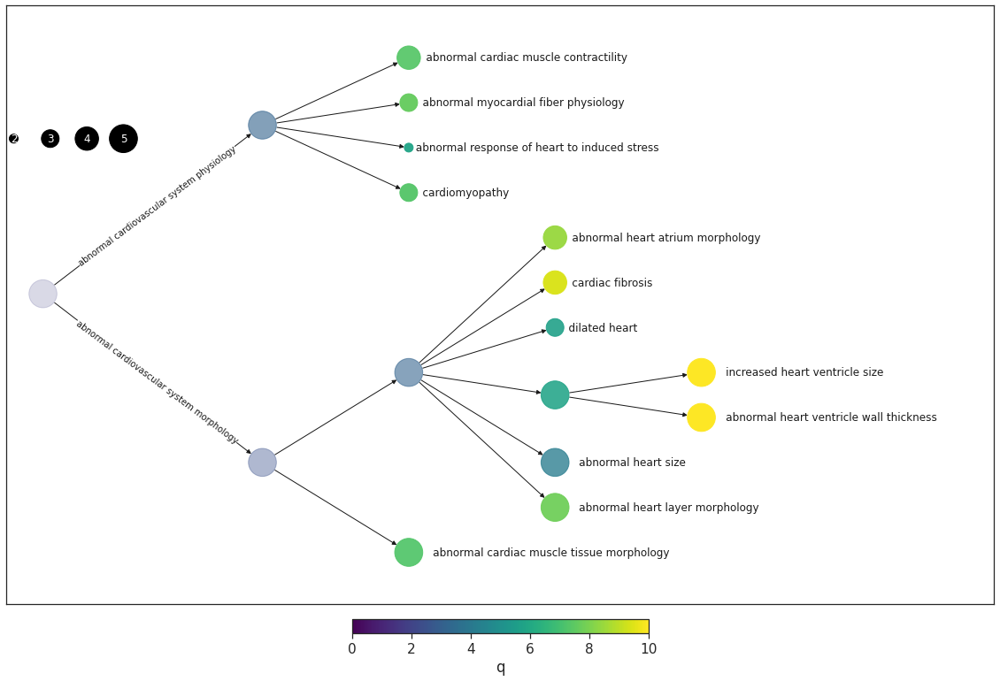

no hits passing filters


In [484]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C907", "MP:0005385", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=15, label="leaf", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=10000, level=3)

### Growth/body size

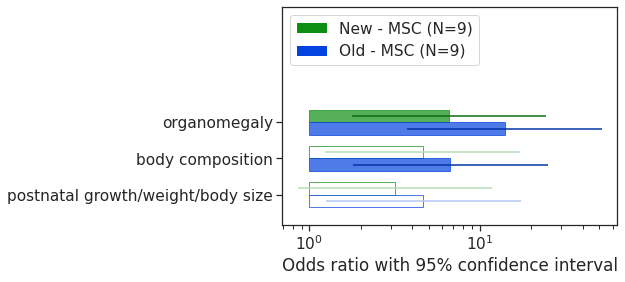

In [478]:
a = plot_hbar_comparison(all_results.loc[all_results.observed>=2], communities=["C907", "C907_old"], mps="MP:0005378", horz=6, vert=4, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - MSC", "Old - MSC"], sort_by="q", label_number="percent_community")

PARENT: MP:0002089 abnormal postnatal growth/weight/body size


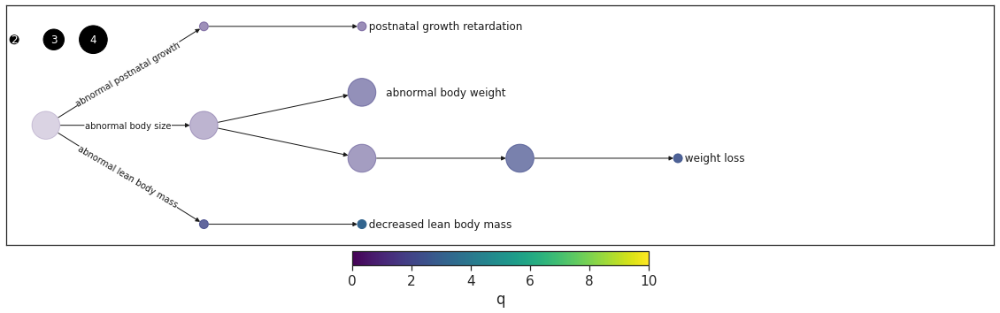

no hits passing filters


In [479]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C907", "MP:0002089", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=6, label="leaf", 
                                descriptive_labels=True)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=10000, level=3)

PARENT: MP:0005451 abnormal body composition


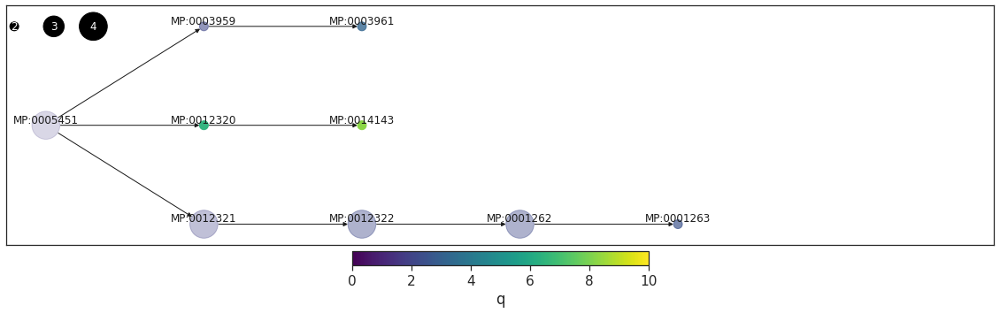

no hits passing filters


In [482]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C907", "MP:0005451", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=6, label="all", 
                                descriptive_labels=True)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=10000, level=3)

### Homeostasis/metabolism

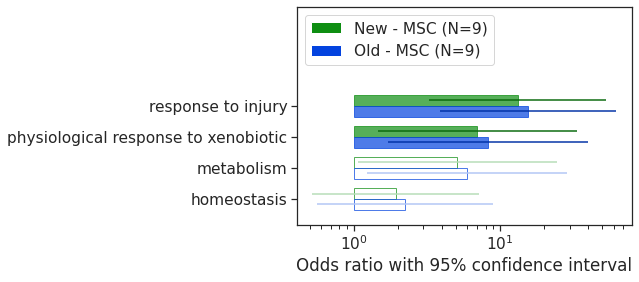

In [472]:
a = plot_hbar_comparison(all_results.loc[all_results.observed>=2], communities=["C907", "C907_old"], mps="MP:0005376", horz=6, vert=4, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - MSC", "Old - MSC"], sort_by="q", label_number="percent_community")

PARENT: MP:0005376 homeostasis/metabolism phenotype


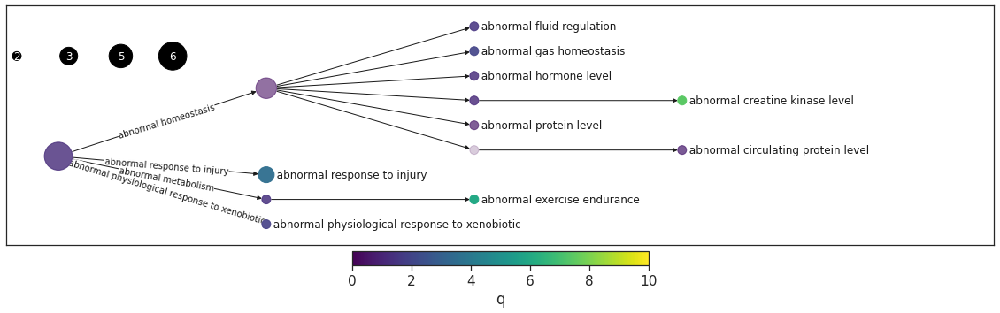

no hits passing filters


In [475]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C907", "MP:0005376", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=6, label="leaf", 
                                descriptive_labels=True)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=10000, level=2)

## PP/MPK2 - C889/C917

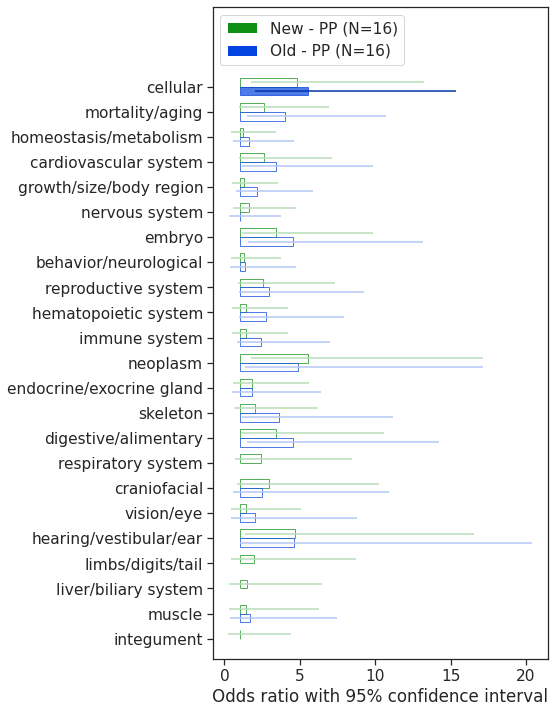

In [539]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C889", "C889_old"], mps=top_level, horz=6, vert = 12,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - PP", "Old - PP"], sort_by="observed", label_number="percent_community", 
                        correct_by_community=False)

In [27]:
from plotting_functions import *

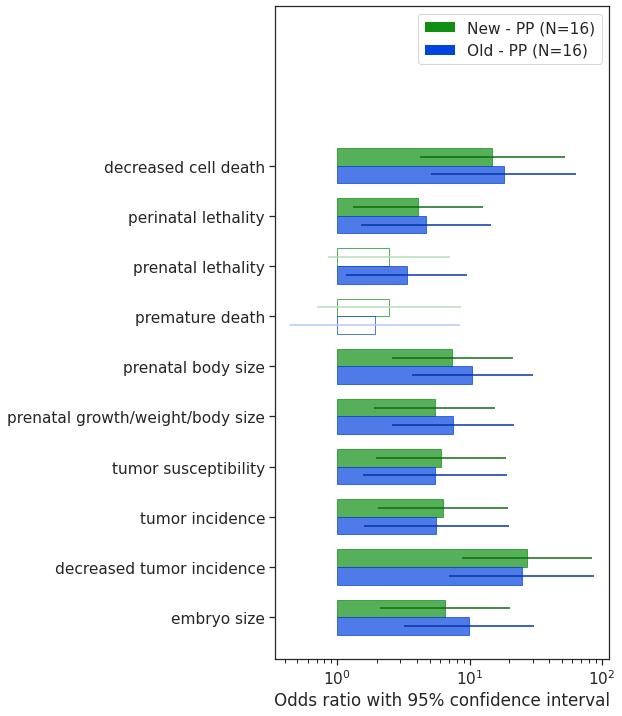

In [34]:
terms = [12555, 2081, 2080, 2083, 10866, 4196, 2166, 2019, 2052, 1697]
terms = [num_to_mp(t) for t in terms]
a = plot_hbar_comparison(all_results, communities=["C889", "C889_old"], mps=terms, horz=6, vert = 12,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - PP", "Old - PP"], sort_by=None, label_number="percent_community", 
                        correct_by_community=False)

In [35]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C889", "MP:0000001", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=20, label="leaf", 
                                descriptive_labels=True, adjust_root=0.3)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=1000, level=2)

NameError: name 'get_gene_hits_no_annotation' is not defined

PARENT: MP:0000001 mammalian phenotype


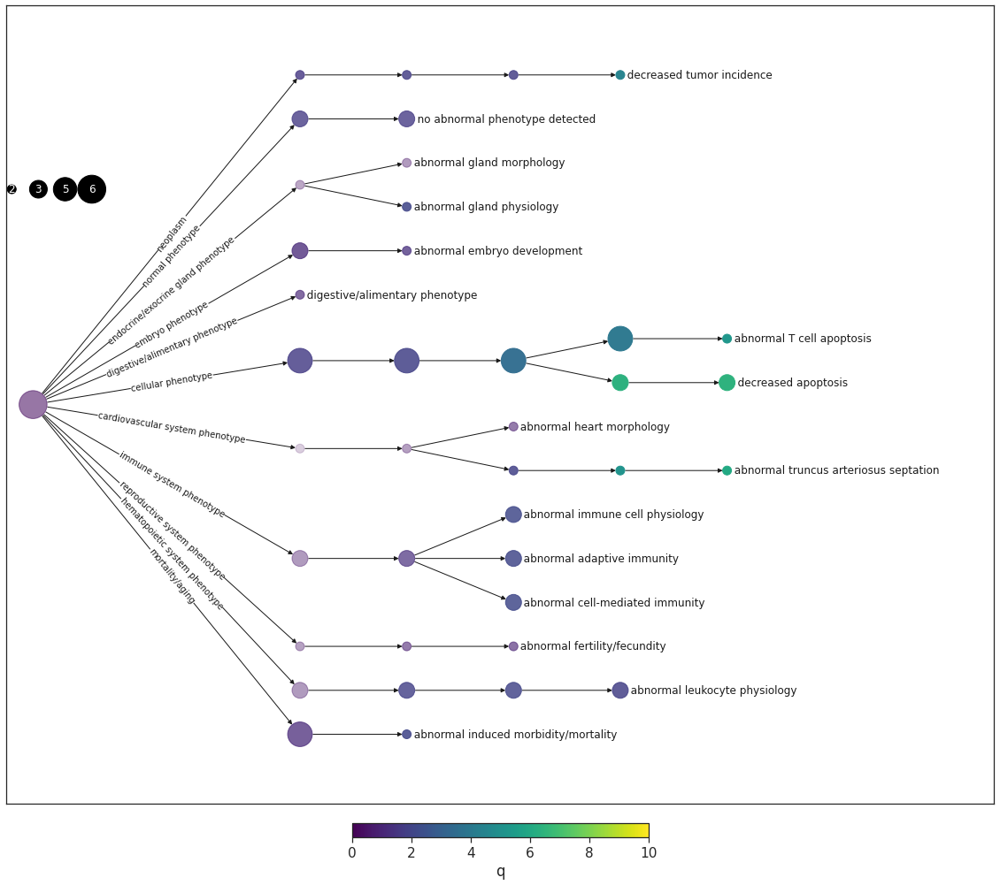

no hits passing filters


In [541]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C917", "MP:0000001", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=20, label="leaf", 
                                descriptive_labels=True, adjust_root=0.3)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=1000, level=2)

### Cellular

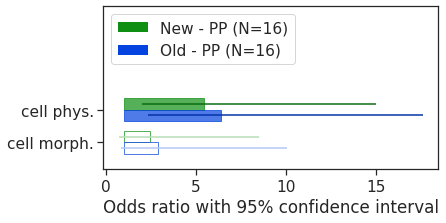

In [437]:
a = plot_hbar_comparison(all_results.loc[all_results.observed>=2], communities=["C889", "C889_old"], mps="MP:0005384", horz=6, vert=3, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - PP", "Old - PP"], sort_by="observed", label_number="percent_community")

PARENT: MP:0005384 cellular phenotype


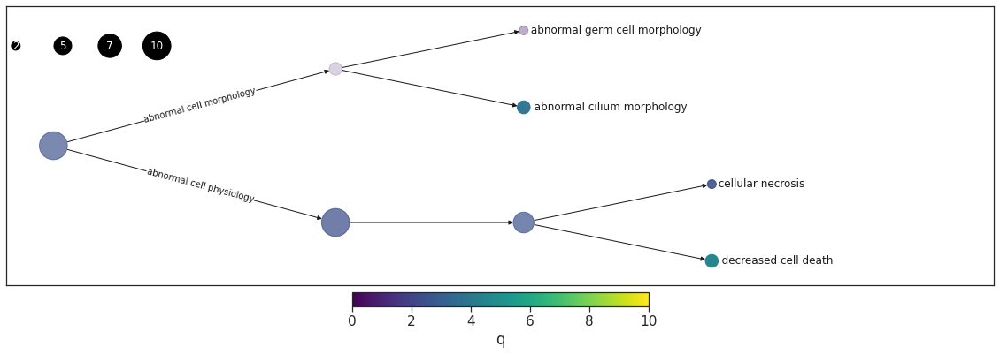

no hits passing filters


In [443]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C889", "MP:0005384", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=7, label="leaf", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=1000, level=2)

In [441]:
n

,OR,q,obs,hits
MP:0005384,4.795189,2.441418,10,"[MAP2K6, MAP2K1, CAMK2G, MAPK1, MAP2K3, CAMK4,..."
MP:0005621,5.456061,2.420002,10,"[MAP2K6, MAP2K1, CAMK2G, MAPK1, MAP2K3, CAMK4,..."
MP:0000313,5.150459,2.596094,6,"[MAP2K6, MAP2K1, CAMK2G, MAPK1, MAP2K3, MAP2K5]"
MP:0012555,14.889038,4.570337,3,"[MAP2K6, CAMK2G, MAP2K3]"
MP:0000316,8.722772,2.368748,2,"[MAPK1, MAP2K1]"
MP:0000358,2.413585,0.771393,3,"[STK33, TTBK2, CAMK4]"
MP:0013202,11.924370,3.637819,3,"[STK33, TTBK2, CAMK4]"
MP:0002208,2.895928,0.795953,2,"[STK33, CAMK4]"


### Mortality/aging

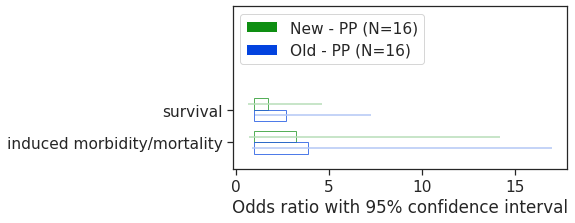

In [444]:
a = plot_hbar_comparison(all_results.loc[all_results.observed>=2], communities=["C889", "C889_old"], mps="MP:0010768", horz=6, vert=3, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - PP", "Old - PP"], sort_by="observed", label_number="percent_community")

PARENT: MP:0010768 mortality/aging


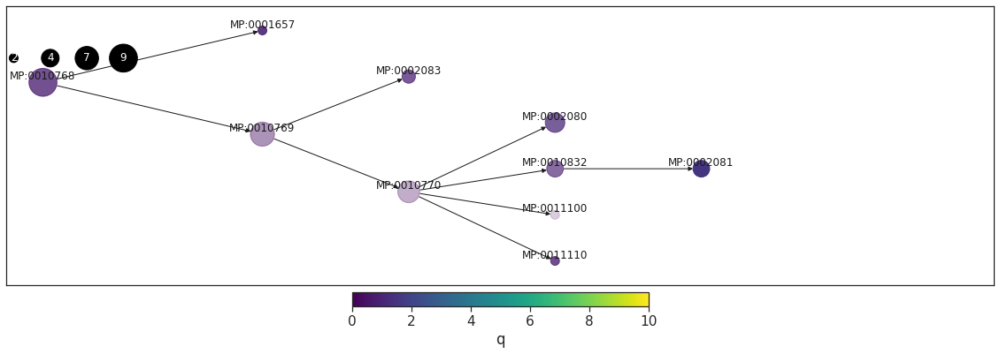

no hits passing filters


In [448]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C889", "MP:0010768", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=7, label="all", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=10000, level=3)

### Neoplasm

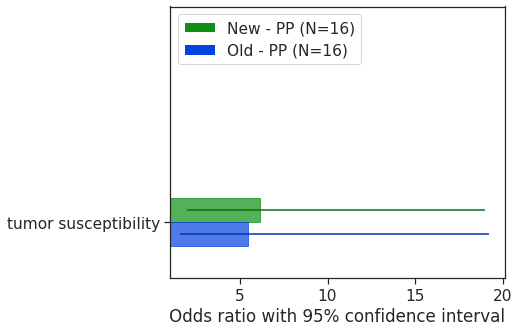

In [460]:
a = plot_hbar_comparison(all_results.loc[all_results.observed>=2], communities=["C889", "C889_old"], mps="MP:0002006",horz=6, vert=5, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - PP", "Old - PP"], sort_by="observed", label_number="percent_community")

PARENT: MP:0002006 neoplasm


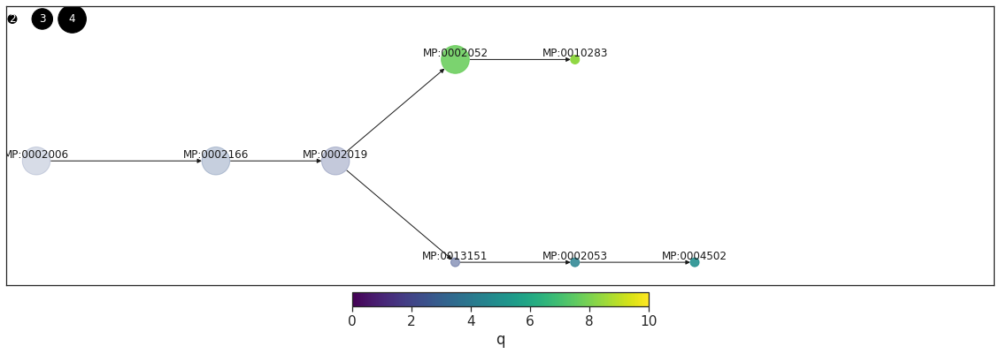

no hits passing filters


In [462]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C889", "MP:0002006", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=7, label="all", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.1, OR=2, obs_min=2, total=1000, level=2)

### Embryo

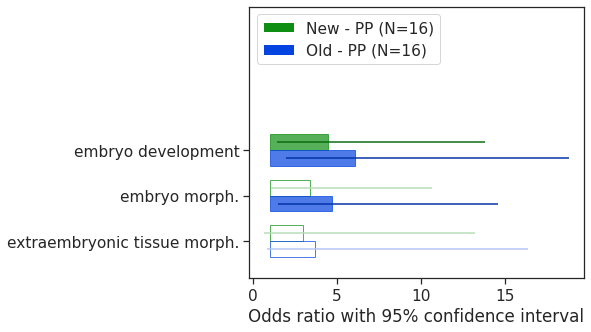

In [46]:
a = plot_hbar_comparison(all_results.loc[all_results.observed>=2], communities=["C889", "C889_old"], mps="MP:0005380",horz=6, vert=5, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - PP", "Old - PP"], sort_by="observed", label_number="percent_community")

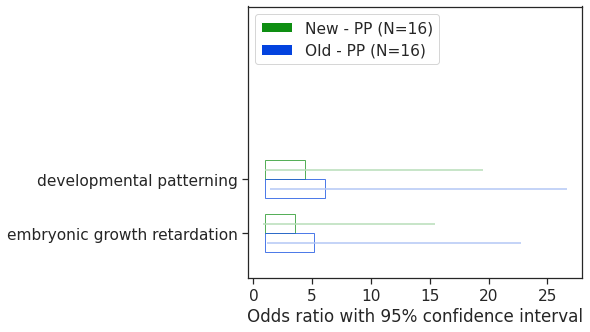

In [47]:
a = plot_hbar_comparison(all_results.loc[all_results.observed>=2], communities=["C889", "C889_old"], mps="MP:0001672",horz=6, vert=5, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - PP", "Old - PP"], sort_by="observed", label_number="percent_community")

PARENT: MP:0005380 embryo phenotype


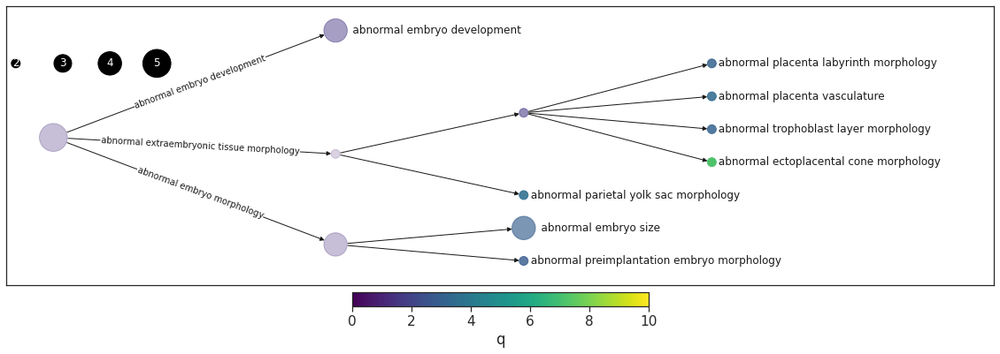

no hits passing filters


In [466]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C889", "MP:0005380", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=7, label="leaf", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.1, OR=2, obs_min=2, total=1000, level=2)

### Growth/body size

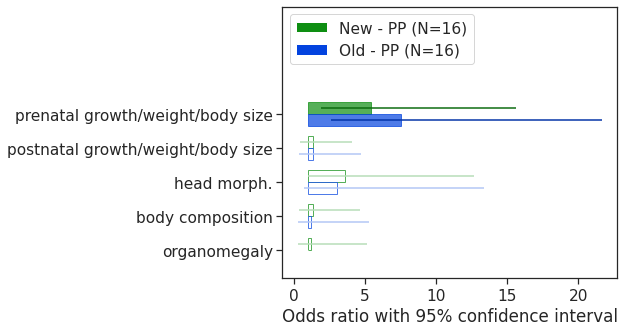

In [449]:
a = plot_hbar_comparison(all_results.loc[all_results.observed>=2], communities=["C889", "C889_old"], mps="MP:0005378",horz=6, vert=5, mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - PP", "Old - PP"], sort_by="observed", label_number="percent_community")

PARENT: MP:0005378 growth/size/body region phenotype


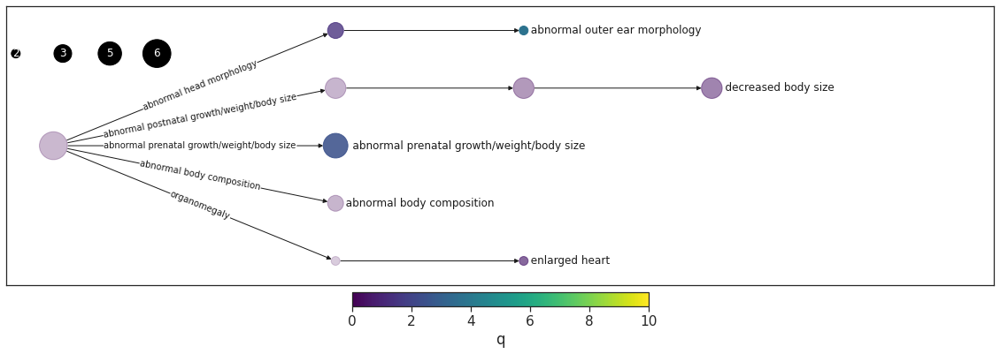

no hits passing filters


In [455]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C889", "MP:0005378", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=7, label="leaf", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.1, OR=2, obs_min=2, total=1000, level=2)

## RPA/C909

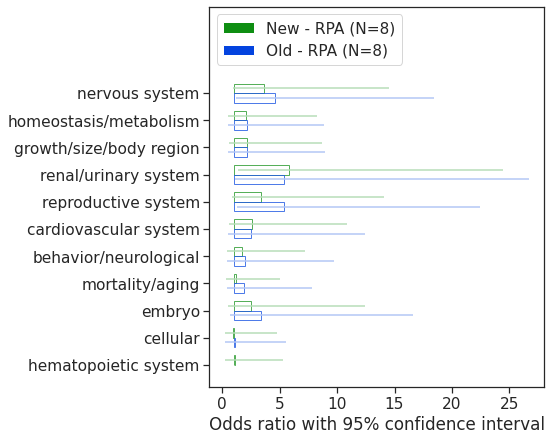

In [408]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C909", "C909_old"], mps=top_level, horz=6, vert = 7,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - RPA", "Old - RPA"], sort_by="observed", 
                         label_number="percent_community", correct_by_community=False)

PARENT: MP:0000001 mammalian phenotype


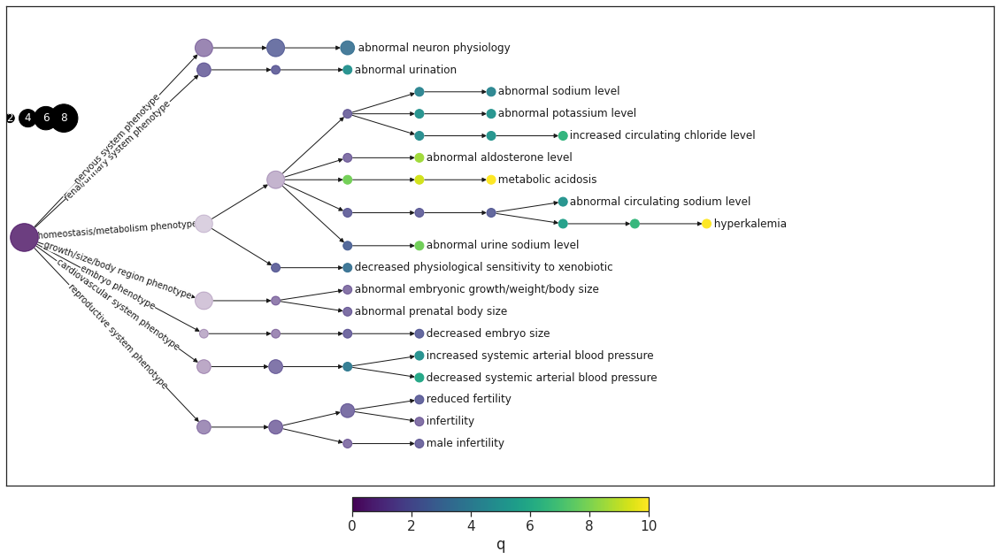

no hits passing filters


In [542]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C909", "MP:0000001", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=12, label="leaf", 
                                descriptive_labels=True, adjust_root=0.3)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=1000, level=2)

### Nervous System

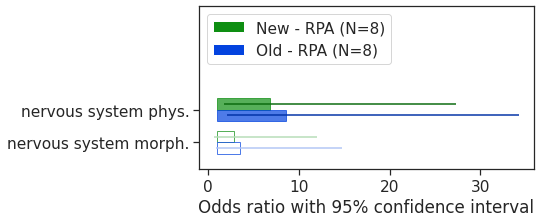

In [411]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C909", "C909_old"], mps="MP:0003631", horz=6, vert = 3,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - RPA", "Old - RPA"], sort_by="observed", label_number="percent_community")

PARENT: MP:0003631 nervous system phenotype


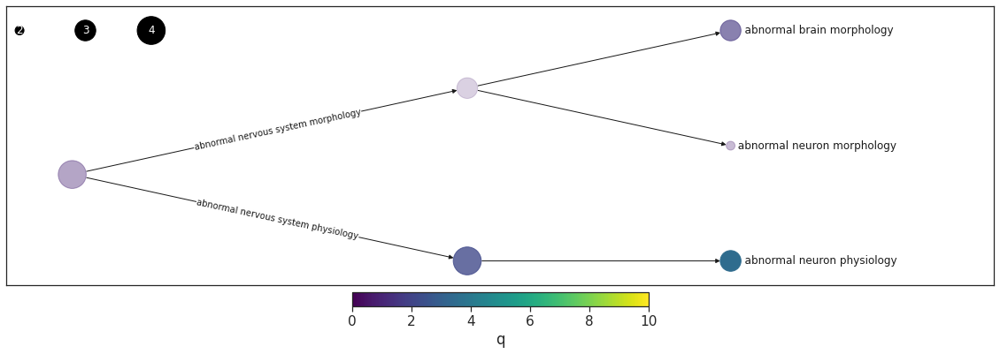

no hits passing filters


In [417]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C909", "MP:0003631", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=7, label="leaf", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=1000, level=2)

In [418]:
n

,OR,q,obs,hits
MP:0003631,3.622113,0.986198,4,"[NUMBL, LMTK3, AATK, WNK1]"
MP:0003633,6.831807,2.180274,4,"[NUMBL, LMTK3, AATK, WNK1]"
MP:0004811,13.964129,3.506668,3,"[NUMBL, LMTK3, AATK]"
MP:0003632,2.870849,0.806640,3,"[NUMBL, AATK, WNK1]"
MP:0002882,3.185559,0.806640,2,"[NUMBL, AATK]"
MP:0002152,5.012730,1.562663,3,"[NUMBL, AATK, WNK1]"


In [423]:
n

,OR,q,obs,hits
MP:0005376,2.053400,0.510011,4,"[LMTK3, ANGEL1, WNK4, WNK1]"
MP:0008872,8.209809,1.999906,2,"[WNK4, WNK1]"
MP:0001764,2.423476,0.609314,4,"[LMTK3, ANGEL1, WNK4, WNK1]"
MP:0009643,11.520479,2.553114,2,"[WNK4, WNK1]"
MP:0006274,107.781609,7.817431,2,"[WNK4, WNK1]"
MP:0005636,7.505000,1.864625,2,"[WNK4, WNK1]"
MP:0004043,109.678363,7.867710,2,"[WNK4, WNK1]"
MP:0003953,5.077078,1.330175,2,"[WNK4, WNK1]"
MP:0011415,139.014815,8.558626,2,"[WNK4, WNK1]"
MP:0001765,6.178262,1.587561,2,"[WNK4, WNK1]"


### Homestasis/Metabolism

### Growth/body size

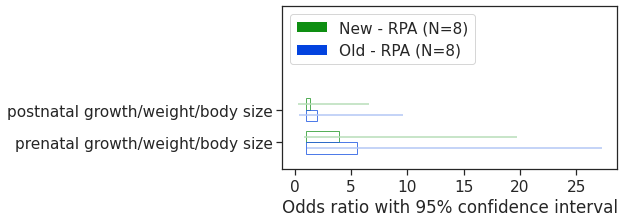

In [424]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C909", "C909_old"], mps="MP:0005378", horz=6, vert = 3,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - RPA", "Old - RPA"], sort_by="observed", label_number="percent_community")

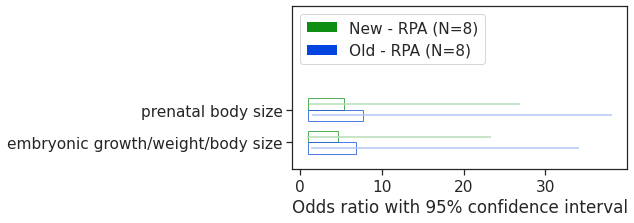

In [426]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C909", "C909_old"], mps="MP:0004196", horz=6, vert = 3,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - RPA", "Old - RPA"], sort_by="observed", label_number="percent_community")

PARENT: MP:0004196 abnormal prenatal growth/weight/body size


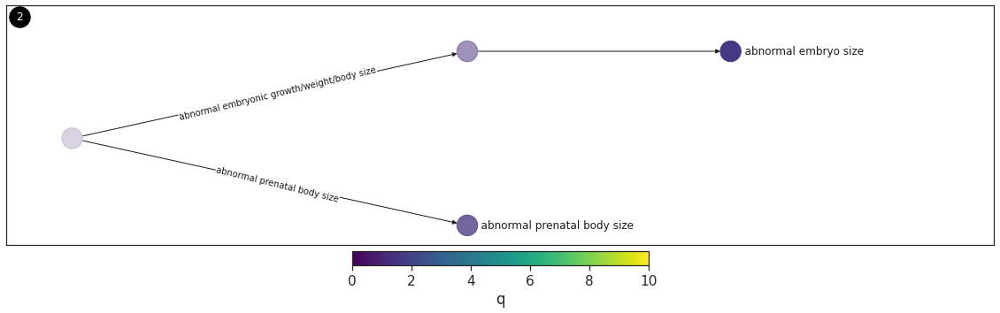

no hits passing filters


In [427]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C909", "MP:0004196", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=6, label="leaf", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=1000, level=2)

In [428]:
n

,OR,q,obs,hits
MP:0004196,3.976403,1.040521,2,"[NUMBL, WNK1]"
MP:0010866,5.419572,1.413311,2,"[NUMBL, WNK1]"
MP:0002088,4.715513,1.239030,2,"[NUMBL, WNK1]"
MP:0001697,6.527352,1.663615,2,"[NUMBL, WNK1]"


### Renal/Urinary

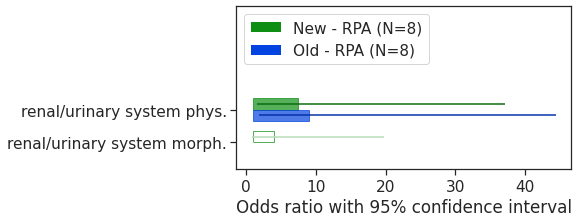

In [536]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C909", "C909_old"], mps="MP:0005367", horz=6, vert = 3,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - RPA", "Old - RPA"], sort_by="observed", label_number="percent_community")

PARENT: MP:0005367 renal/urinary system phenotype


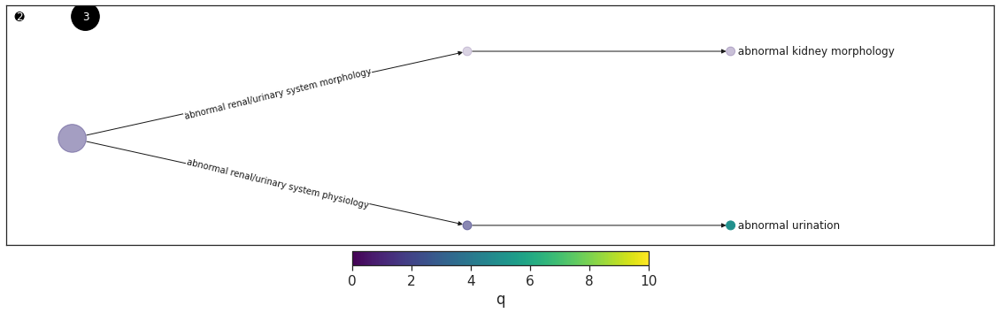

no hits passing filters


In [537]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C909", "MP:0005367", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="hypergeom", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=6, label="leaf", 
                                descriptive_labels=True, adjust_root=0.1)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=1000, level=2)

## C880

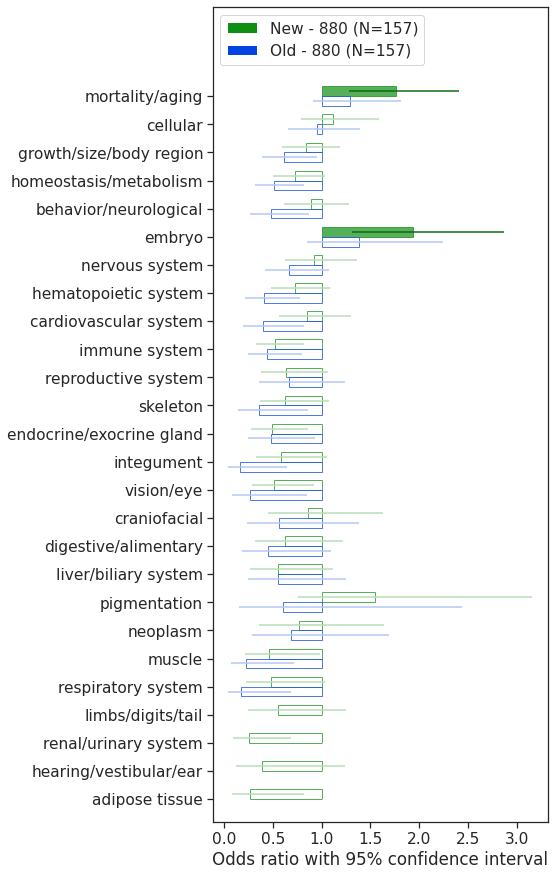

In [163]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C880", "C880_old"], mps=top_level, horz=6, vert = 15,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - 880", "Old - 880"], sort_by="observed", 
                         label_number="percent_community", correct_by_community=False)

PARENT: MP:0000001 mammalian phenotype


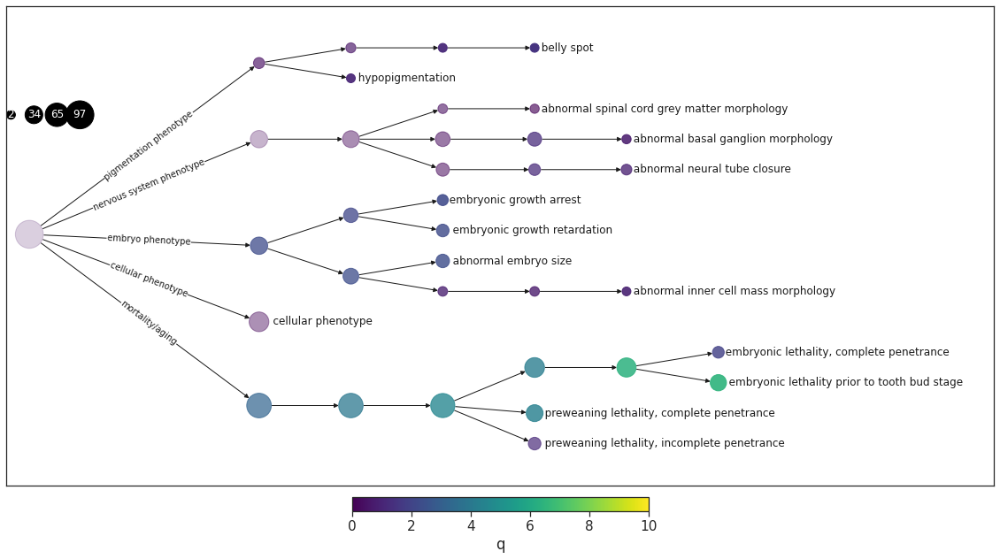

no hits passing filters


In [164]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C880", "MP:0000001", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=12, label="leaf", 
                                descriptive_labels=True, adjust_root=0.3)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=1000, level=2)

## C885

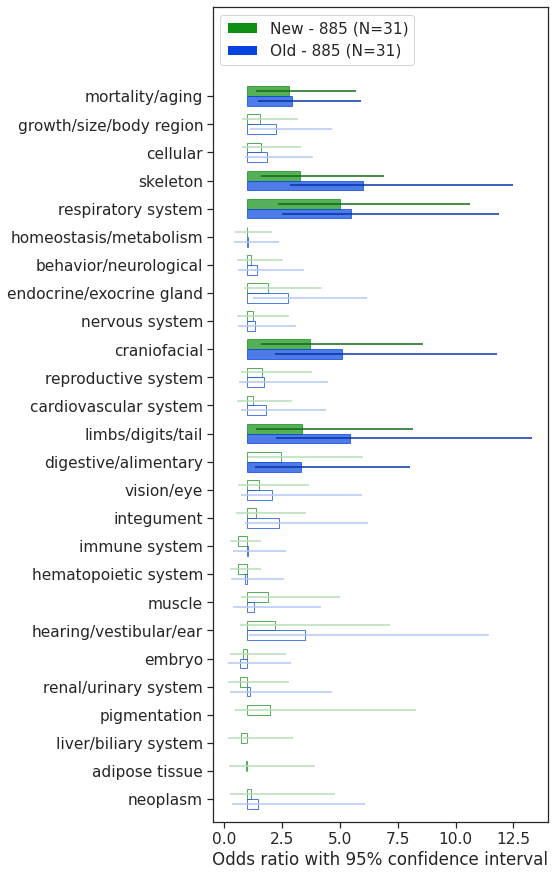

In [167]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C885", "C885_old"], mps=top_level, horz=6, vert = 15,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - 885", "Old - 885"], sort_by="observed", 
                         label_number="percent_community", correct_by_community=False)

PARENT: MP:0000001 mammalian phenotype


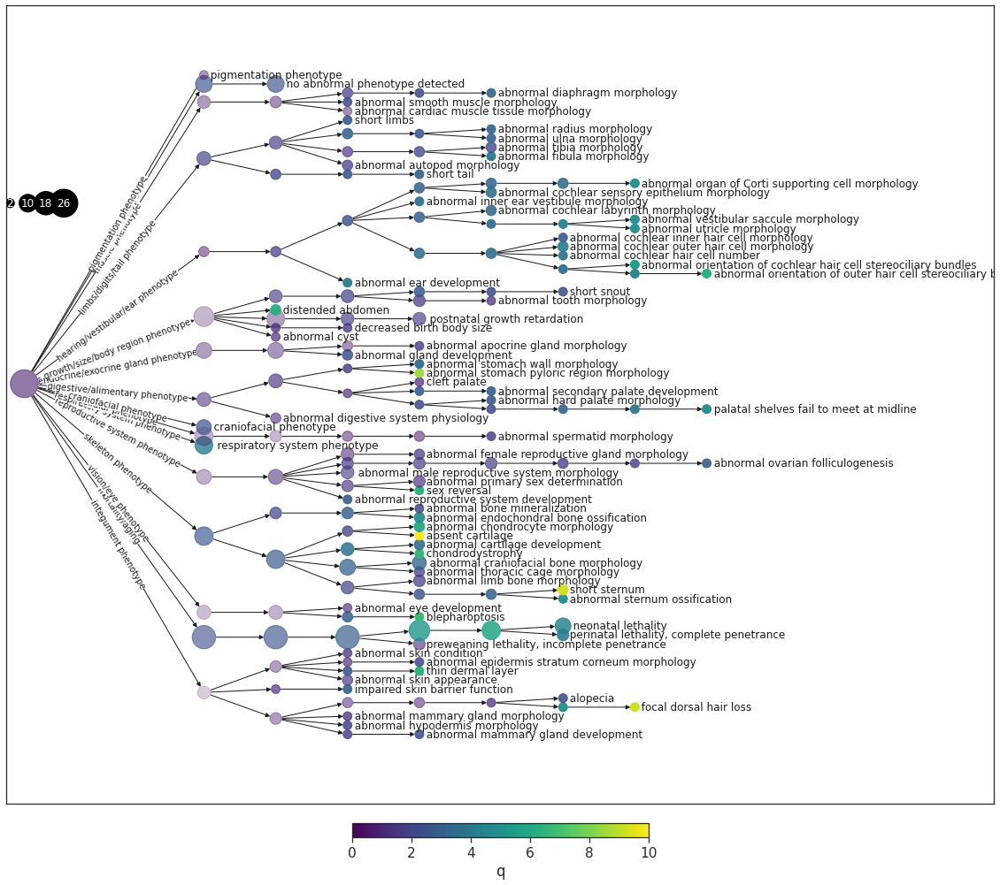

no hits passing filters


In [169]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C885", "MP:0000001", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=20, label="leaf", 
                                descriptive_labels=True, adjust_root=0.3)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=1000, level=2)

## C884

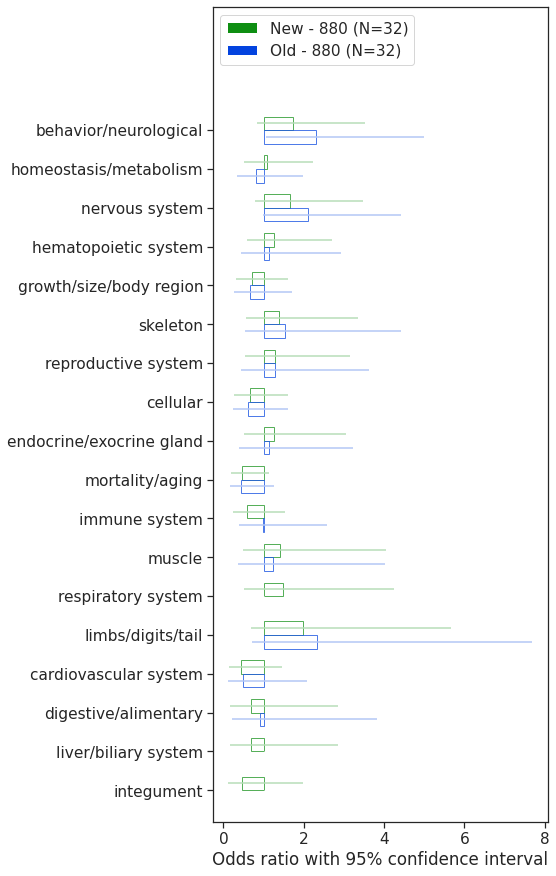

In [170]:
a = plot_hbar_comparison(all_results[all_results.observed>=2], communities=["C884", "C884_old"], mps=top_level, horz=6, vert = 15,mp_graph=mp_graph,
                         sig_level=0.05, community_names=["New - 880", "Old - 880"], sort_by="observed", 
                         label_number="percent_community", correct_by_community=False)

PARENT: MP:0000001 mammalian phenotype


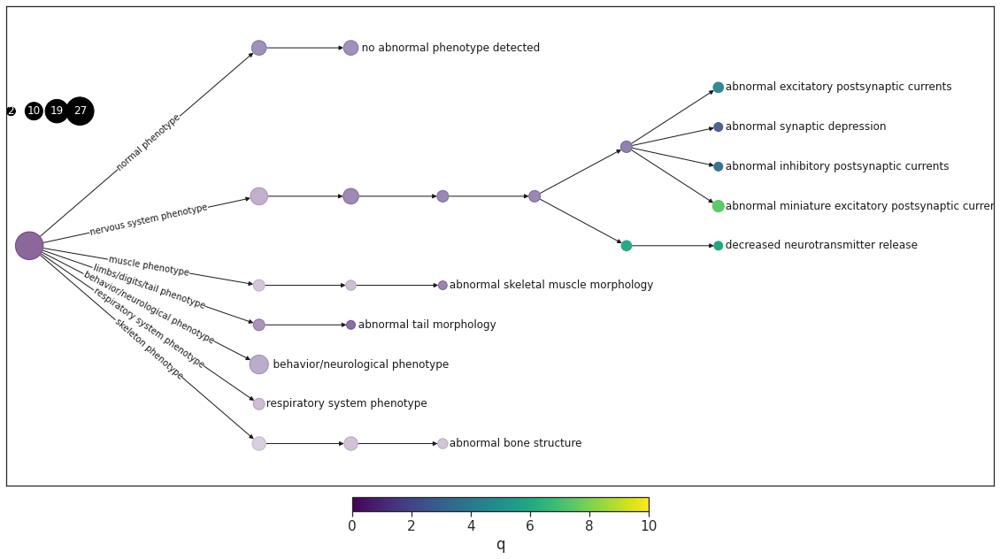

no hits passing filters


In [171]:
n = draw_significance_hierarchy(results.loc[results.observed>=2], "C884", "MP:0000001", mp_graph, MPO2, hier_df_genes, 
                                term_mapping, select_on="ppv", 
                                size_by="obs", alpha_by="OR",color_by="q", vert=12, label="leaf", 
                                descriptive_labels=True, adjust_root=0.3)
get_hits(n, results, p=0.01, OR=2, obs_min=3, total=1000, level=2)

## Test for "essentiality"

In [186]:
mortality_terms = []
for term in tqdm(MPO2.terms):
    if " complete penetrance" in get_MP_description(term, MPO2):
        if term in all_results.index:
            mortality_terms.append(term)

100%|██████████| 13507/13507 [00:00<00:00, 17453.52it/s]


In [215]:
hier_df_genes

,CD_MemberList,frac_d1_seeds,frac_d2_seeds
C877,HELZ EMX2 HIST1H3A RAD51 SYT12 GYPC KDM3B ERC1...,0.353583,0.177570
C898,STX4 LSAMP SPOCK1 SGCB STXBP5 TRP-AGG2-6 GPRC5...,0.363636,0.181818
C904,BCL11B PKIB PKIA LMO1 NR2F1 LDB2 ZFPM2 GATA3 A...,0.300000,0.200000
C906,PROM2 SPINT1 TNIK PKP3 SSH3 FEZ2 CORIN WWC1 CAPN1,0.333333,0.111111
C911,ZNF629 ZKSCAN5 LINGO1 ZNF202 ZKSCAN2 ZNF263 ZN...,0.571429,0.142857
...,...,...,...
C928,MAPK6 CLHC1 CAMK4 STK33 AC138811.2,0.400000,0.400000
C917,MAP2K5 DAPK2 CAMK2G MAP2K3 DAPK3 MAP2K6 MAP2K1,0.571429,0.142857
C918,NSD2 KNSTRN KIF22 PYDC1 CCDC34 CENPF OIP5,0.428571,0.285714
C927,ZDHHC21 RFT1 AKT3 TSPAN5 CMC4,0.600000,0.200000


In [238]:
counts = {}
fractions = {}
for comm in tqdm(new_node_list):
    comm_count = 0
    genes = hier_df_genes.loc[comm, "CD_MemberList"].split(" ")
    n=len(genes)
    for gene in genes:
        if gene in gene_mapping:
            gene_terms = [MPO2.terms[i] for i in list(gene_mapping[gene])]
            for term in gene_terms:
                if term in mortality_terms:
                    comm_count += 1
                    break
        else:
            n -= 1
        
    counts[comm] = comm_count
    fractions[comm] = comm_count/len(genes)

100%|██████████| 23/23 [00:00<00:00, 4858.19it/s]


In [239]:
pd.DataFrame.from_dict(fractions, "index").sort_values(by=0)

,0
C887,0.000000
C920,0.000000
C931,0.000000
C912,0.142857
C884,0.156250
C883,0.176471
C878,0.200935
C879,0.207101
C905,0.222222
C907,0.222222


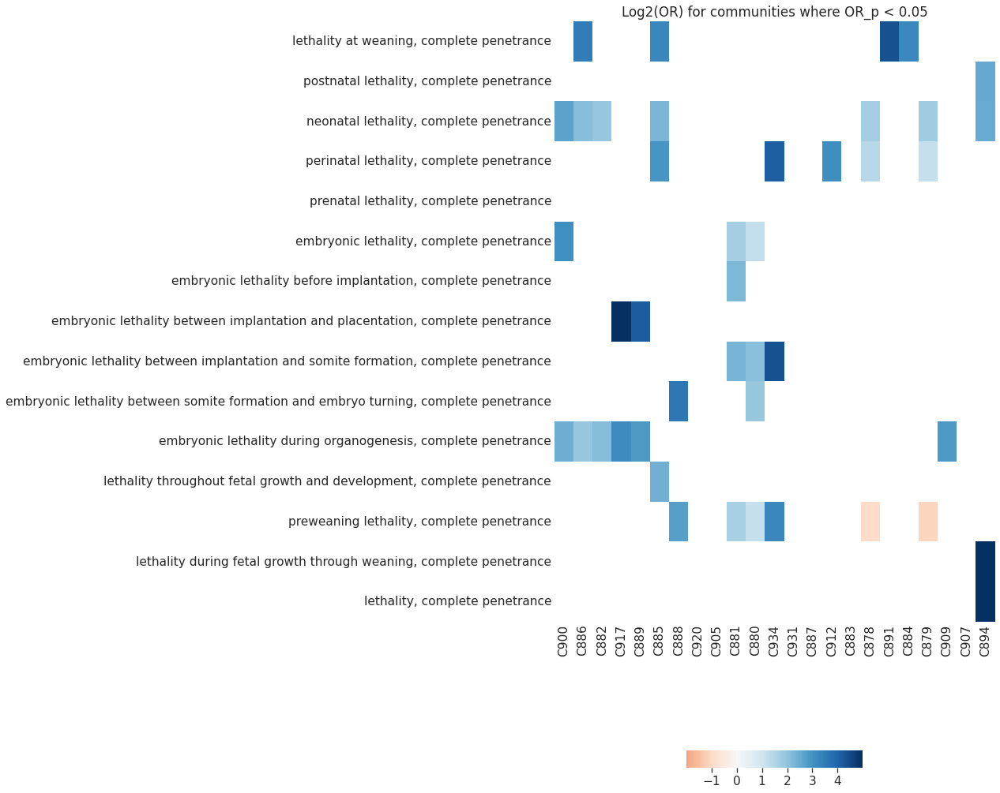

In [188]:
a = a = plot_community_heatmap(all_results, mortality_terms, new_node_list, new_annotations, stat="OR", filter_stat="OR_p", MPO=MPO2,
                             ylabel_groups = None, color_range = [-2, 0, 5], vert=20, horz = 10)

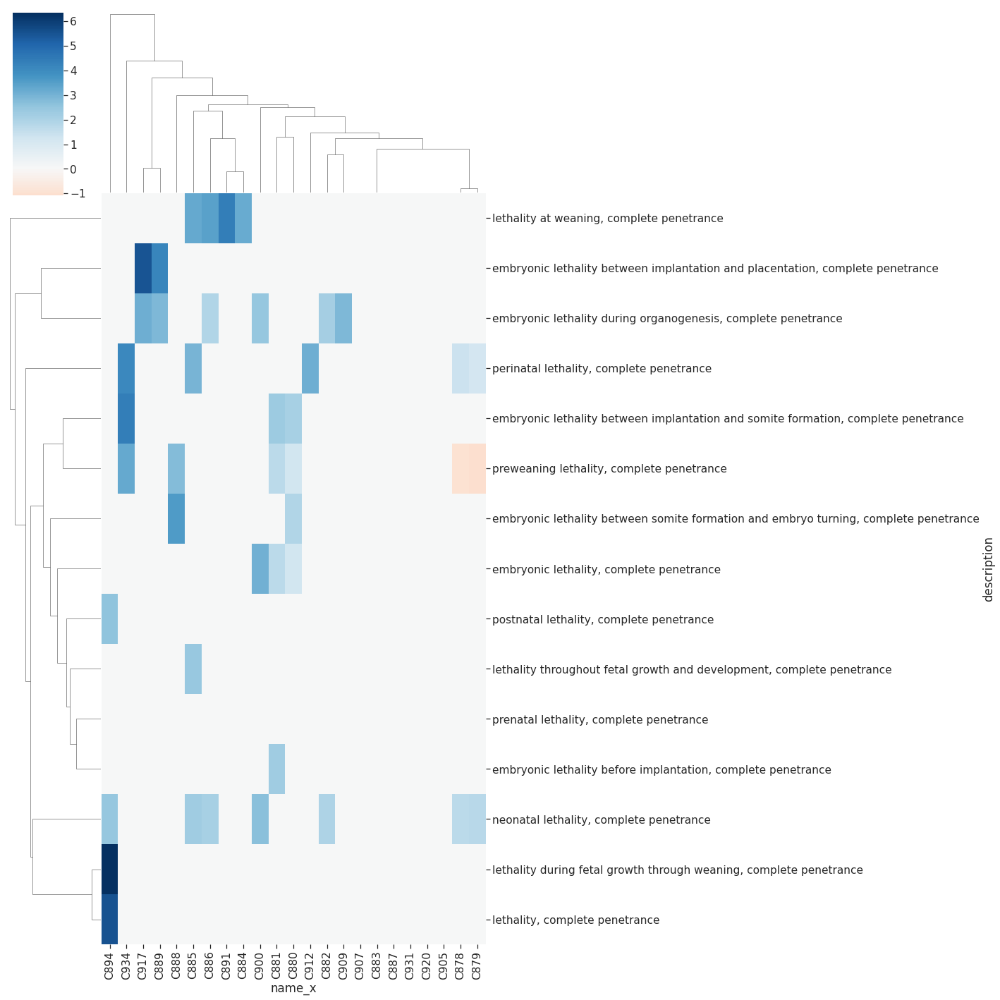

In [189]:
a2 = np.log2(a)
sns.clustermap(a2.fillna(0), method= "average", col_cluster=True, cmap="RdBu", center=0, figsize=(20,20))

In [185]:
[term in all_results.index for term in mortality_terms]

[True,
 True,
 True,
 True,
 True,
 True,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True]

# Updated Results

In [52]:
new_node_list = [900, 886, 882,917, 889, 885, 888, 920, 905, 881, 880, 934, 931, 887, 
                 912,  883, 878, 891, 884, 879, 909, 907, 894]
new_node_list = ["C" + str(node) for node in new_node_list]

## Prenatal - DM1/PP/RPA

In [52]:
def get_groups(term_lists):
    groups = []
    for i, term_list in enumerate(term_lists):
        groups += [i%2]*len(term_list)
    return groups

In [71]:
size1 = [10866, 1697] + [1731, 3956]
cell1 = [5076, 313]
nervous1 = [3861,2152, 4811, 2229]
cardio1 = [2925]
#repro = [1925,2161 ]
ag1 = [10770, 8762]
neo1 = [2019]
#digestive = [10155]
#embryonic = [2085, 1672]
#homestasis = [1764]
#urinary = [1756]
resp1 = [2133]
skel1 = [8395]
prenatal_terms = size1 + cell1 + ag1 + nervous1 + cardio1 + neo1 +resp1 + skel1#+embryonic
prenatal_terms = [num_to_mp(term) for term in prenatal_terms]

prenatal_groups = get_groups([size1, cell1, ag1, nervous1, cardio1, neo1, resp1, skel1])


In [59]:
for term in prenatal_terms:
    print(get_MP_description(term, MPO2))
    

abnormal prenatal body size
abnormal embryo size
abnormal postnatal growth
abnormal body size
abnormal cell differentiation
decreased cell death
abnormal cell death
preweaning lethality
embryonic lethality
abnormal nervous system development
abnormal brain morphology
abnormal neuron physiology
neurodegeneration
abnormal cardiovascular development
abnormal tumor incidence
abnormal respiratory system physiology
abnormal osteoblast differentiation


In [87]:
print(prenatal_terms)

['MP:0010866', 'MP:0001697', 'MP:0005076', 'MP:0013202', 'MP:0012555', 'MP:0010770', 'MP:0008762', 'MP:0003861', 'MP:0002152', 'MP:0004811', 'MP:0001614', 'MP:0002925', 'MP:0002019', 'MP:0002085', 'MP:0001672']


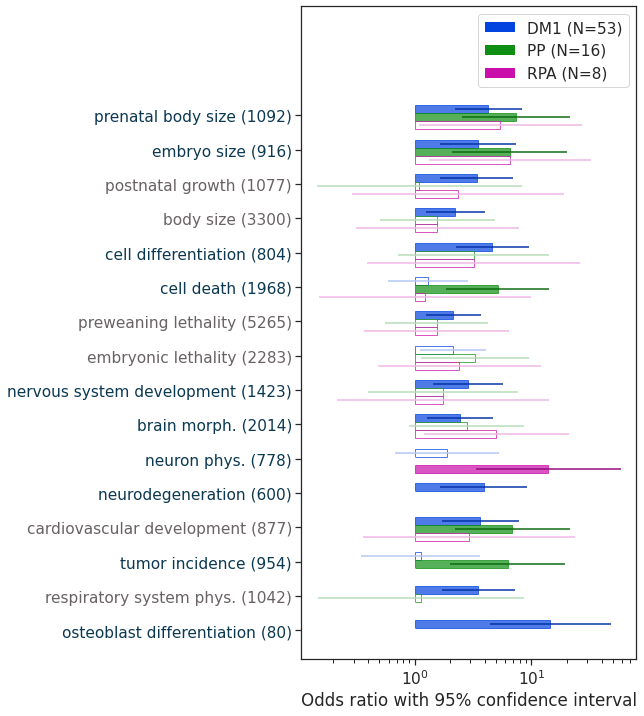

In [62]:
_, ax = plot_hbar_comparison(all_results, communities=["C882", "C889", "C909"], mps=prenatal_terms, sig_level=0.05, 
                         community_names=["DM1", "PP", "RPA"], sort_by=None, 
                         label_number="total", vert=12, color_idx=[1,0,4] , mp_graph=None, horz=6, save_to=None,
                            ylabel_groups=prenatal_groups)


## Postnatal - GSR/MSC

In [73]:
size2 = [1259, 3956,  1256, 12321, 12320]
homeostasis2 = [5164, 9642, 3953, 2078]
exo2 = [13561, 13560, 13558]
behavior2 = [2069, 14114, 2067, 2066]
nervous2 = [8946]
immune2 = [2723]
adi2 = [10024]
muscle2 = [5620,759, 4087, 2269]
cardio2 = [4215, 2972, 10630, 266]
postnatal_terms = size2+ homeostasis2 + exo2 + behavior2 + nervous2 + immune2 + adi2 + muscle2 + cardio2
postnatal_terms = [num_to_mp(term) for term in postnatal_terms]

postnatal_groups = get_groups([size2, homeostasis2, exo2, behavior2, nervous2, immune2, adi2, muscle2, cardio2])

In [89]:
print(postnatal_terms)

['MP:0001259', 'MP:0001265', 'MP:0001264', 'MP:0001256', 'MP:0012321', 'MP:0005164', 'MP:0009642', 'MP:0003953', 'MP:0002078', 'MP:0013561', 'MP:0013560', 'MP:0013558', 'MP:0002069', 'MP:0014114', 'MP:0002067', 'MP:0008946', 'MP:0002723', 'MP:0005330', 'MP:0005620', 'MP:0002269', 'MP:0004087', 'MP:0000759', 'MP:0004215', 'MP:0002972', 'MP:0010630', 'MP:0000266']


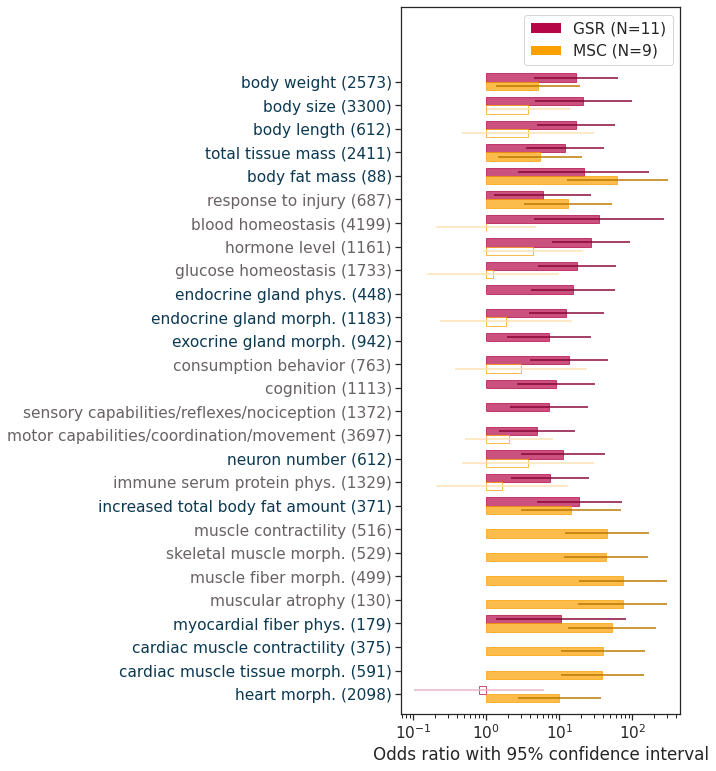

In [74]:
_, ax = plot_hbar_comparison(all_results, communities=["C894", "C907"], mps=postnatal_terms, sig_level=0.05, 
                         community_names=["GSR", "MSC"], sort_by=None, 
                         label_number="total", vert=13, color_idx=[3,2], mp_graph=None, horz=5, save_to=None,
                            ylabel_groups = postnatal_groups)


## Full Heatmap

In [119]:
## All prenatal
size1 = [ 1697, 10866] + [1731, 3956]
cell1 = [5076, 313]
nervous1 = [3861, 2152,4811 ]
cardio1 = [2925]
#repro = [1925,2161 ]
ag1 = [8762, 10770]
neo1 = [2019]
#digestive = [10155]
#embryonic = [2085, 1672]
#homestasis = [1764]
#urinary = [1756]
resp1 = [2133]
skel1 = [8395]

In [148]:
size2 = [1259, 3956,  1256, 12321, 12320]
homeostasis2 = [5164, 3953, 2078]
exo2 = [13561, 13560, 13558]
exo3 = [2164, 2163]
behavior2 = [14114,2069, 2066,  2067]
nervous2 = [8946]
immune2 = [2723]
adi2 = [10024]
muscle2 = [759, 4087, 2269]
cardio2 = [10630, 4215]

 [growth , cell, embryonic , ag ,  cardio, muscle,
              homeostasis , exo ,neo,  behavior,nervous]:

In [151]:
growth = [1697, 10866 ] + [ 3956, 5451]
cell = cell1
nervous = [4811, 8946,2152,3861]
cardio = cardio1+cardio2

all_terms = growth+skel1 +cell +neo1+ag1 +cardio + muscle2 + homeostasis2 + exo3 + behavior2+nervous
all_terms = [num_to_mp(term) for term in all_terms]
all_groups = get_groups([growth, skel1, cell,neo1,ag1, cardio, muscle2, homeostasis2, exo3, behavior2,
                        nervous])

In [242]:
all_terms

['MP:0001697',
 'MP:0010866',
 'MP:0003956',
 'MP:0005451',
 'MP:0008395',
 'MP:0005076',
 'MP:0000313',
 'MP:0002019',
 'MP:0008762',
 'MP:0010770',
 'MP:0002925',
 'MP:0010630',
 'MP:0004215',
 'MP:0000759',
 'MP:0004087',
 'MP:0002269',
 'MP:0005164',
 'MP:0003953',
 'MP:0002078',
 'MP:0002164',
 'MP:0002163',
 'MP:0014114',
 'MP:0002069',
 'MP:0002066',
 'MP:0002067',
 'MP:0004811',
 'MP:0008946',
 'MP:0002152',
 'MP:0003861']

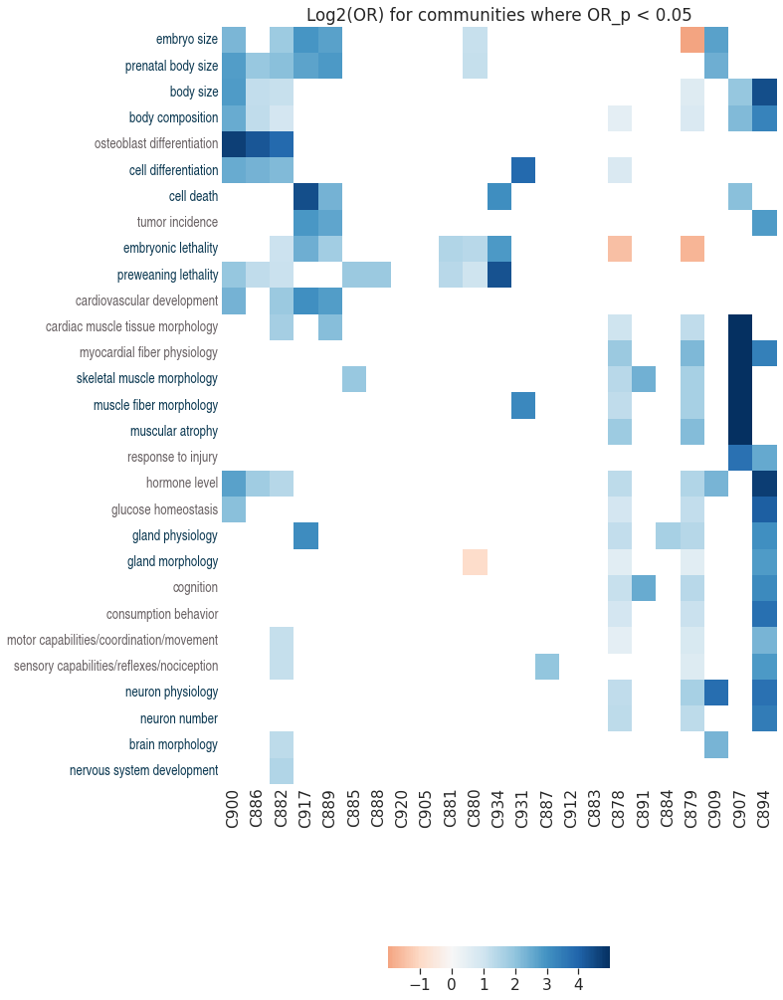

In [152]:
a = plot_community_heatmap(all_results, all_terms, new_node_list, new_annotations, stat="OR", filter_stat="OR_p", MPO=MPO2,
                             ylabel_groups = all_groups, color_range = [-2, 0, 5], vert=20, horz = 10)

ValueError: too many values to unpack (expected 2)

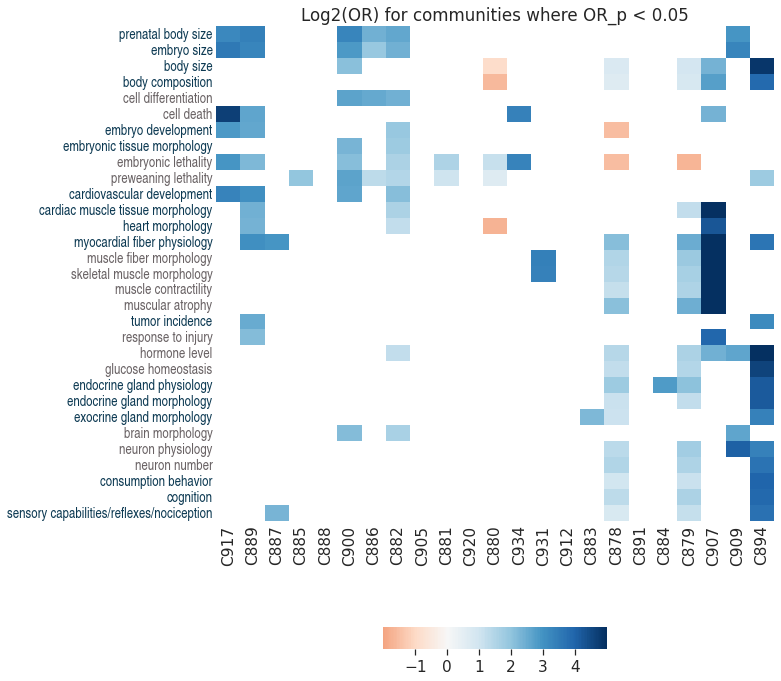

In [149]:
a, b  = plot_community_heatmap(results, all_terms, node_list, new_annotations, stat="OR", filter_stat="OR_p", MPO=MPO2,
                             ylabel_groups = groups, color_range = [-2, 0, 5], vert=13, horz = 10)

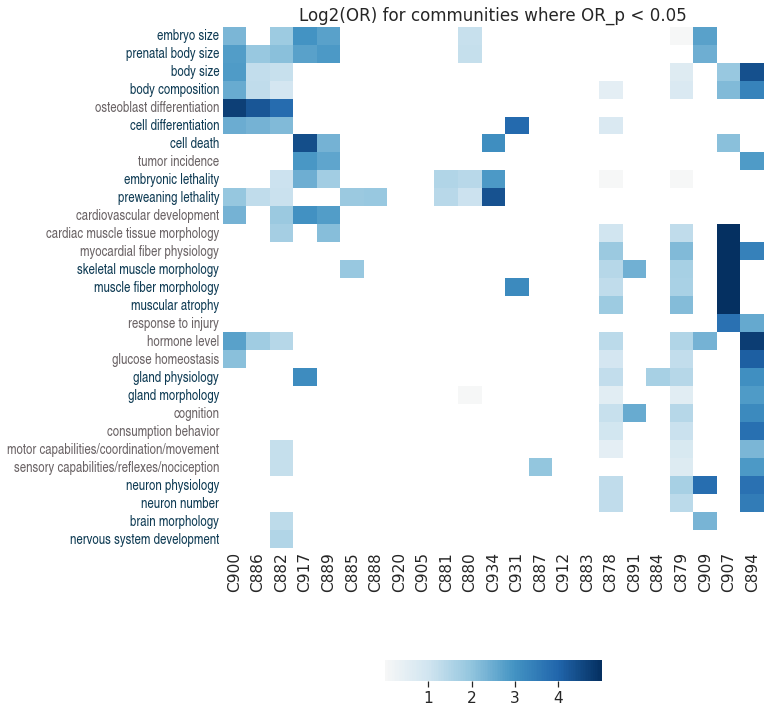

In [158]:
a  = plot_community_heatmap(results, all_terms, new_node_list, new_annotations, stat="OR", filter_stat="OR_p", MPO=MPO2,
                             ylabel_groups = all_groups, color_range = [0, 0, 5], vert=13.7, horz=9.7)

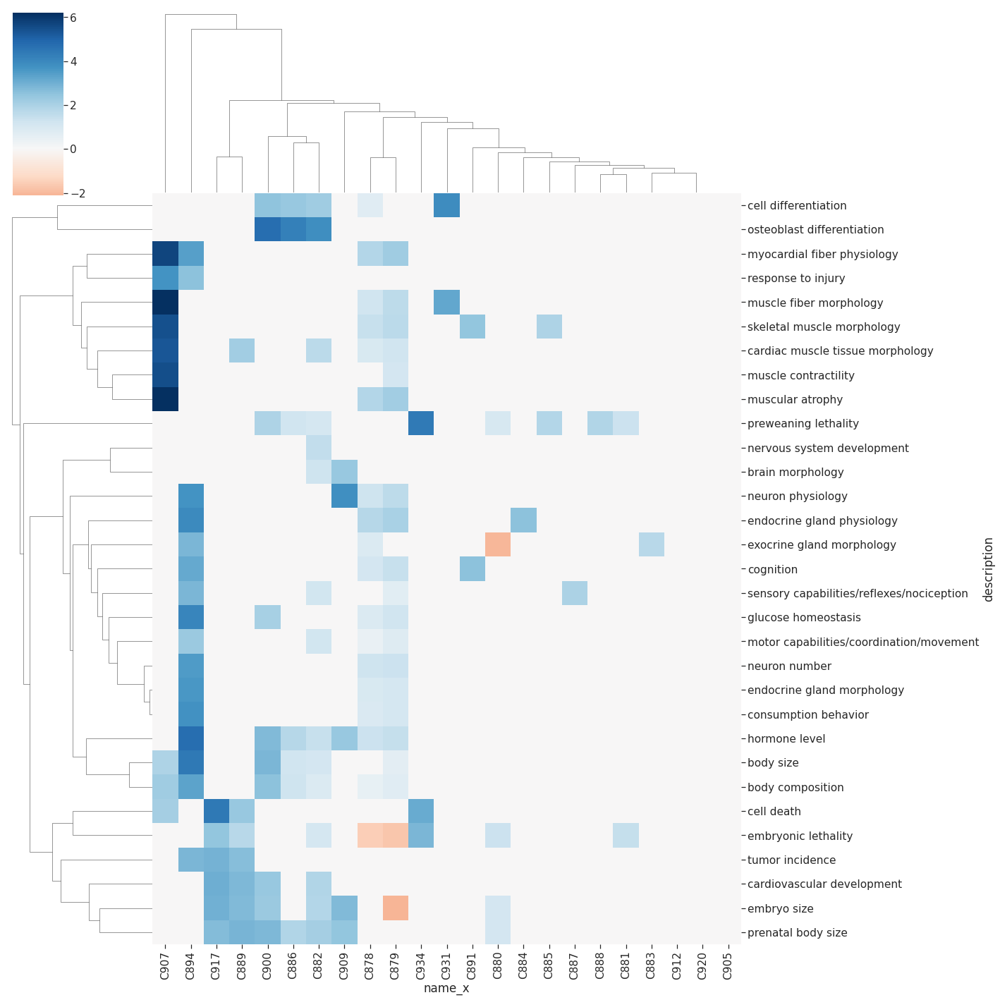

In [134]:
a2 = np.log2(a)
sns.clustermap(a2.fillna(0), method= "average", col_cluster=True, cmap="RdBu", center=0, figsize=(20,20))

# Unnamed Communities

In [53]:
unnamed_nodes = list(set(results["name"].unique()).difference(set(new_node_list)))

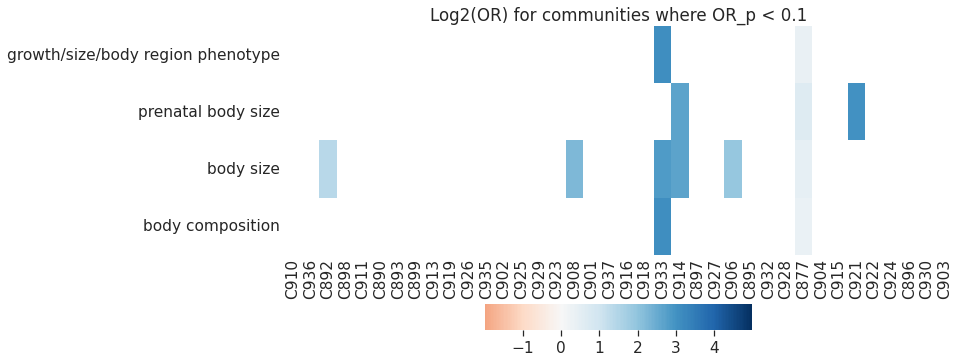

In [108]:
_ = plot_community_heatmap(results, body_size_traits, unnamed_nodes, new_annotations, stat="OR", filter_stat="OR_p", 
                       color_range = [-2, 0, 5], MPO=MPO2, vert = 6, filter_th=0.1)


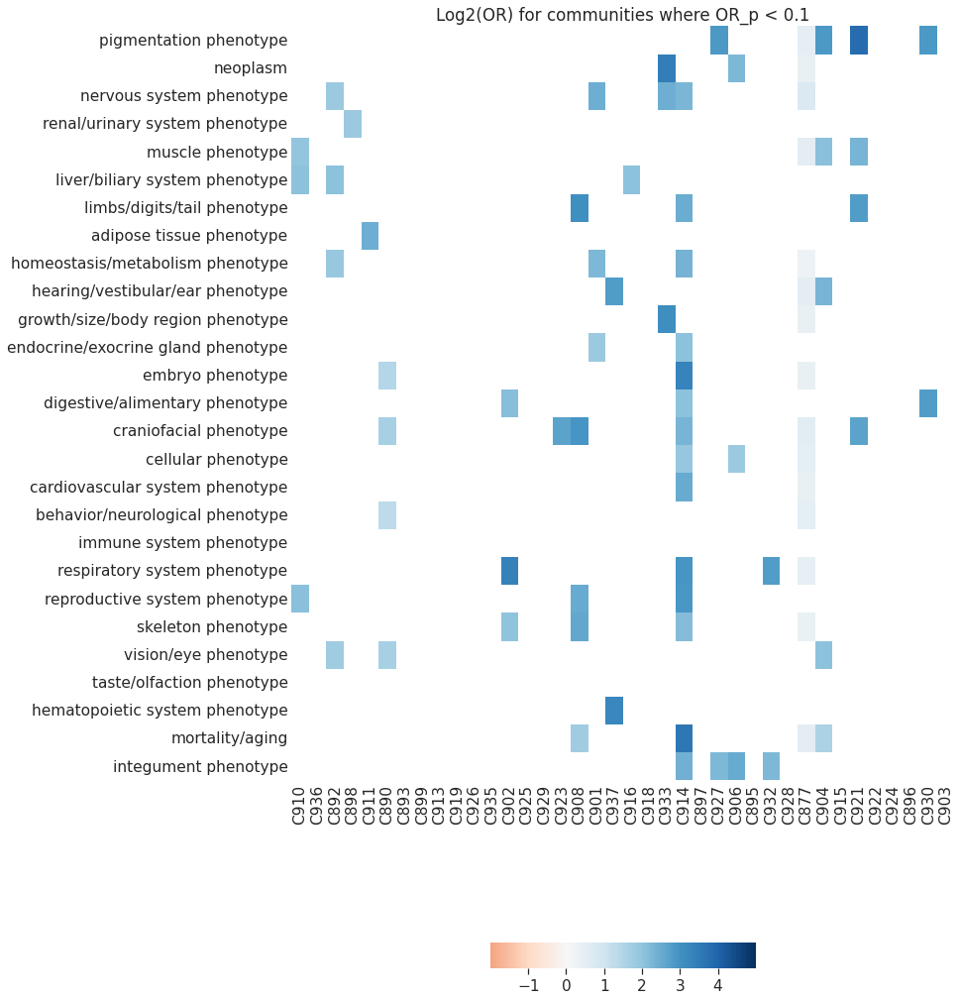

In [109]:
plot_data = plot_community_heatmap(results, top_level, unnamed_nodes, new_annotations, stat="OR", filter_stat="OR_p", 
                       color_range = [-2, 0, 5], MPO=MPO2, vert=20, filter_th=0.1)

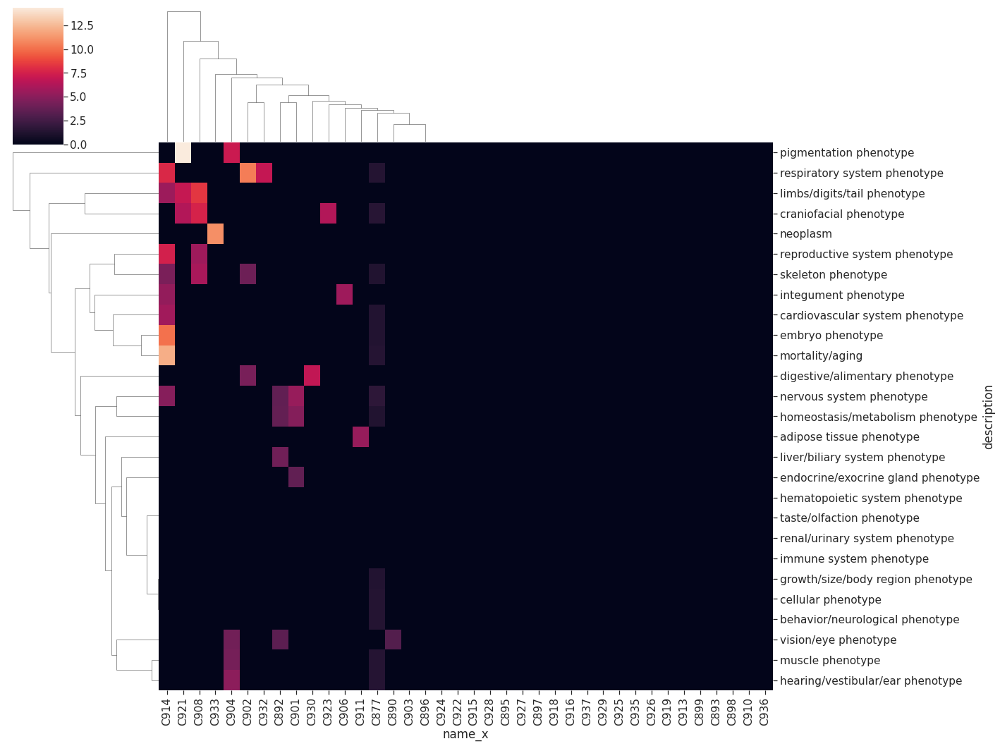

In [83]:
x= sns.clustermap(plot_data.fillna(0), figsize=(20,15))

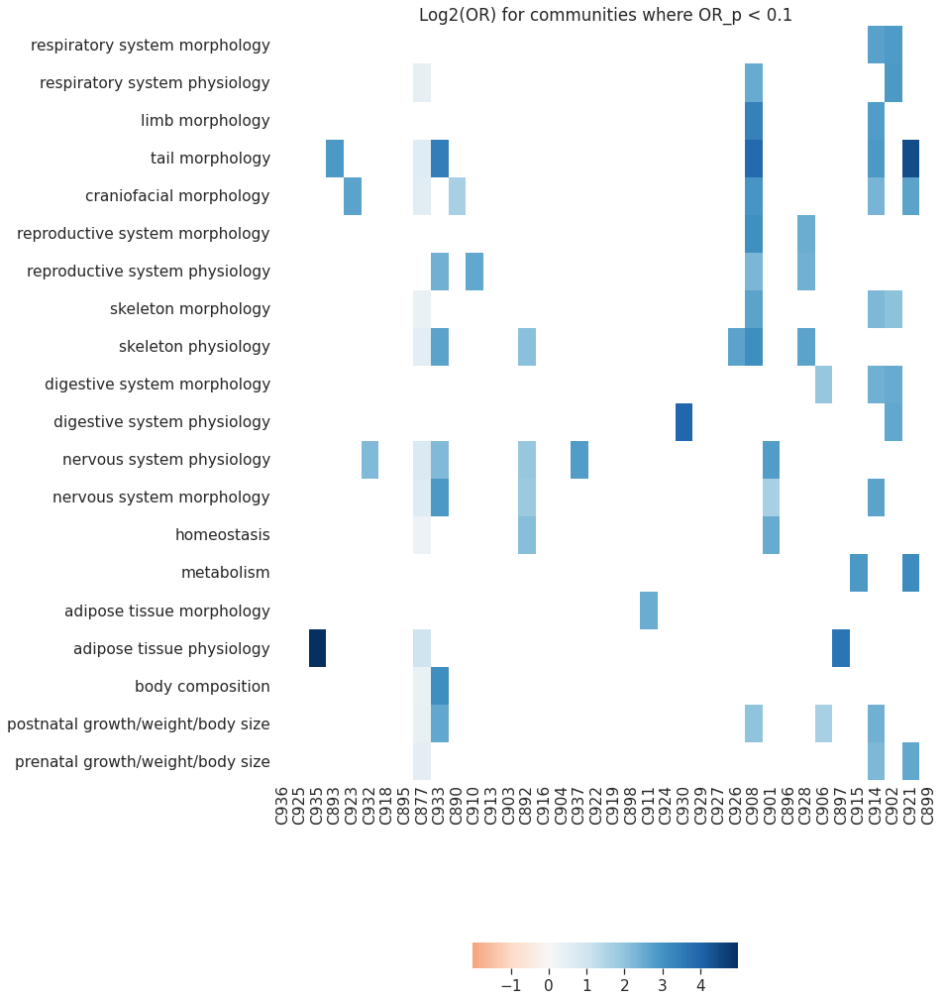

In [54]:
traits = [num_to_mp(i) for i in [2132,2133,2109,2111,428,2160,1919,5508,1533,462,1663,3633,3632,1764,5266,3,5666,5451,2089,4196]]

plot_data = plot_community_heatmap(results, traits, unnamed_nodes, new_annotations, stat="OR", filter_stat="OR_p", 
                       color_range = [-2, 0, 5], MPO=MPO2, vert=20, filter_th=0.1)

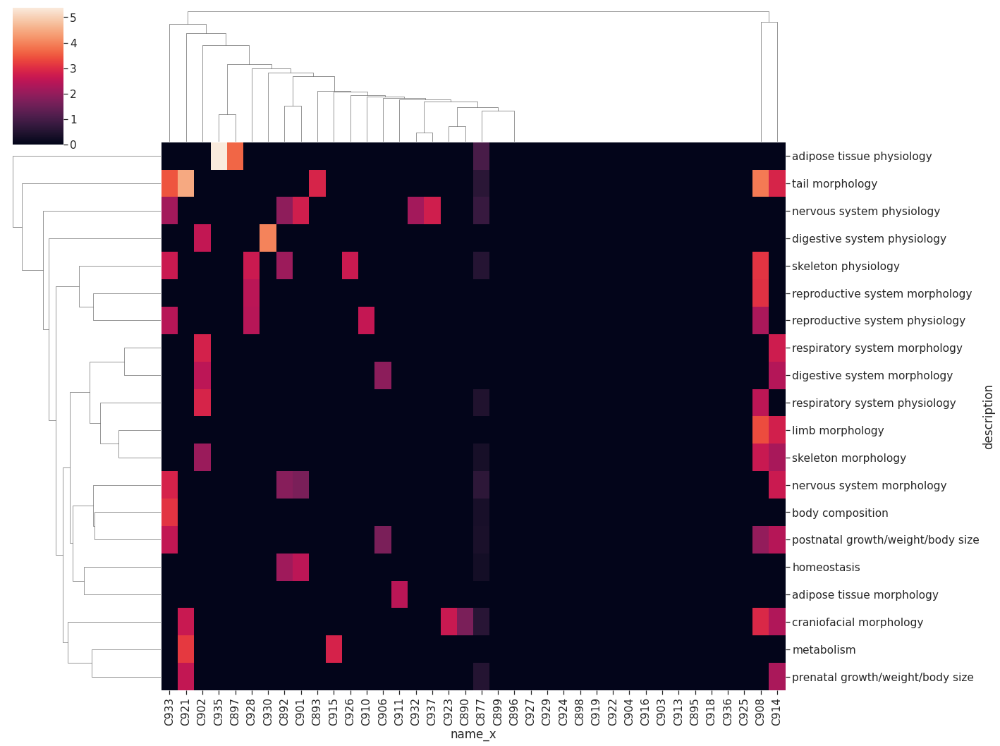

In [56]:
x= sns.clustermap(np.log2(plot_data).fillna(0), figsize=(20,15))

In [88]:
cluster_order = [plot_data.columns[i] for i in x.dendrogram_col.reordered_ind]

In [ ]:
comm_names={}

In [101]:
for comm in cluster_order[:14]:
    print(results[(results["OR_p"]< 0.05)&(results["observed"]>1)&(results["name"]==comm)].head(15))
    comm_names[comm] = input()

            observed  total         OR      OR_p  OR_CI_lower  OR_CI_upper  \
MP:0010768         6   6248  12.083627  0.021068     1.454454   100.390941   
MP:0010770         6   5265  15.463776  0.011242     1.861268   128.476086   
MP:0010769         6   5844  13.335046  0.016486     1.605070   110.788614   
MP:0002080         5   2936  13.546571  0.001846     2.626985    69.855602   
MP:0002089         4   3782   5.306158  0.028930     1.187079    23.718142   
MP:0005389         4   2846   7.492845  0.008390     1.676100    33.496051   
MP:0005380         4   2206  10.058129  0.002519     2.249649    44.969666   
MP:0005385         4   3542   5.756548  0.021961     1.287811    25.731908   
MP:0003956         4   3300   6.277104  0.016203     1.404231    28.059515   
MP:0002127         4   2812   7.599715  0.007943     1.699997    33.973982   
MP:0003632         4   3255   6.382446  0.015262     1.427789    28.530559   
MP:0003631         4   4074   4.829812  0.039269     1.080537   

skeletal
            observed  total         OR      OR_p  OR_CI_lower  OR_CI_upper  \
MP:0003956         3   3300   7.060055  0.032312     1.179233    42.268481   
MP:0001262         3   2133  11.750000  0.006972     1.962248    70.359347   
MP:0005451         3   2786   8.641035  0.018189     1.443218    51.736790   
MP:0001259         3   2573   9.481518  0.013764     1.583546    56.770808   
MP:0003632         3   3255   7.178506  0.030870     1.199012    42.977830   
MP:0002080         3   2936   8.122400  0.021791     1.356622    48.630622   
MP:0012321         3   2411  10.220307  0.010912     1.706887    61.196009   
MP:0001265         3   2867   8.354225  0.020083     1.395330    50.019034   
MP:0012322         3   2134  11.743782  0.006985     1.961210    70.322098   
MP:0002619         2   1636   7.009792  0.032981     1.170457    41.981183   
MP:0002429         2   1211   9.708299  0.012824     1.620668    58.155699   
MP:0002123         2   1033  11.499515  0.007500     1.

skeleton, respiratory & digestive
            observed  total          OR          OR_p  OR_CI_lower  \
MP:0002069         2    763   15.816032  2.510540e-03     2.638895   
MP:0010678         2   1361    8.563159  1.870714e-02     1.429642   
MP:0030572         2    306   40.594298  5.143558e-05     6.758816   
MP:0001431         2    672   18.054726  1.542164e-03     3.011845   
MP:0002060         2   1389    8.376832  1.995202e-02     1.398556   
MP:0002882         2   1784    6.372241  4.256466e-02     1.064060   
MP:0011087         2    720   16.803157  2.013799e-03     2.803360   
MP:0002058         2   1031   11.523162  7.450418e-03     1.923337   
MP:0000377         2    241   51.815900  1.606675e-05     8.618915   
MP:0020982         2    233   53.633478  1.356256e-05     8.919862   
MP:0005388         2   1648    6.953827  3.370862e-02     1.161118   
MP:0003704         2     85  150.457831  4.959263e-08    24.817382   
MP:0002083         2   1618    7.095297  3.190657e-02   

homeostasis, & synaptic transmission
            observed  total         OR      OR_p  OR_CI_lower  OR_CI_upper  \
MP:0005381         2   1677   6.821891  0.035503     1.139101    40.855203   
MP:0001663         2    761  15.859464  0.002486     2.646132    95.052922   

             hyper_p  sig_5e6                           description  size  \
MP:0005381  0.006155    False        digestive/alimentary phenotype     5   
MP:0001663  0.000619    False  abnormal digestive system physiology     5   

            name          MP  
MP:0005381  C930  MP:0005381  
MP:0001663  C930  MP:0001663  
digestive
            observed  total         OR      OR_p  OR_CI_lower  OR_CI_upper  \
MP:0000428         2   1380   6.326560  0.033252     1.157766    34.571206   
MP:0005382         2   1380   6.326560  0.033252     1.157766    34.571206   
MP:0001614         2   1484   5.847503  0.041528     1.070159    31.951593   
MP:0002191         2    577  15.860000  0.001435     2.899078    86.765374   
MP:

roo


Manual annotations based on enrichment results?  
```{'C890': 'eye and head development',
 'C903': 'vertical activity',
 'C896': 'None',
 'C924': 'None',
 'C922': 'None',
 'C915': 'Enzyme activity',
 'C928': 'abnormal cell movement',
 'C895': 'prenatal lethality',
 'C927': 'abnormal blood factors',
 'C897': 'endocrine gland physiology',
 'C918': 'heat morphology',
 'C916': 'glucose level',
 'C937': 'abnormal blood factors',
 'C929': 'cell differentiation',
 'C925': 'None',
 'C935': 'abnormal blood and immune factors',
 'C926': 'motor capabilities',
 'C919': 'abnormal blood and immune factors',
 'C913': 'abnormal immune factors',
 'C899': 'cell proliferation and male fertility',
 'C893': 'vertebral development',
 'C898': 'body weight and behavior',
 'C910': 'muscle and fertility',
 'C936': 'None',
 'C914': 'mortality and body size',
 'C921': 'Unclear',
 'C908': 'skeletal',
 'C933': 'body size and blood factors',
 'C904': 'Unclear',
 'C902': 'skeleton, respiratory & digestive',
 'C932': 'skin, nervous, & consumption behavior',
 'C892': 'homeostasis, eye, nervous',
 'C901': 'homeostasis, & synaptic transmission',
 'C930': 'digestive',
 'C923': 'craniofacial & blood',
 'C906': 'Unclear',
 'C911': 'adipose tissue',
 'C877': 'root'}
 ```

In [105]:
updated_annotations=new_annotations[new_annotations["represents"].isin(cluster_order)]
updated_annotations.assign(mgd = [comm_names[x] for x in updated_annotations["represents"]])

,name,represents,mgd
0,C877,C877,roo
1,regulation of secretion,C898,body weight and behavior
2,regulation of transcription/biosynthesis,C904,Unclear
3,C906-None,C906,Unclear
4,regulation of transcription by RNA polymerase II,C911,adipose tissue
5,C913-None,C913,abnormal immune factors
6,C914-None,C914,mortality and body size
7,C915-None,C915,Enzyme activity
8,C924-None,C924,None
9,C925-None,C925,None


In [49]:
for comm in ["C933", "C914", "C908", "C892", "C911", "C906", "C921"]:
    genes = hier_df_genes.loc[comm, "CD_MemberList"].split(" ")
    pd.DataFrame({"gene": genes}).to_csv("/cellar/users/snwright/Data/Transfer/rat/"+ comm + ".txt", header=False, index=False)

# __ Not updated ___ Results

## Prenatal - DM1/PP/RPA

In [40]:
prenatal = [10866, 1697]
cell = [5076, 13202, 12555]
nervous = [3861, 2152, 4811]
cardio = [1614, 2925]
#repro = [1925,2161 ]
ag = [10770, 8762]
neo = [2019]
#digestive = [10155]
embryonic = [2085, 1672]
#homestasis = [1764]
#urinary = [1756]
prenatal_terms = prenatal + cell + ag + nervous + cardio + neo +embryonic
prenatal_terms = [num_to_mp(term) for term in prenatal_terms]

prenatal_groups = [1,1] + [0]*3 + [1,1] + [0]*3 + [1,1]+[0]+[1,1,]


In [41]:
for term in prenatal_terms:
    print(get_MP_description(term, MPO2))
    

abnormal prenatal body size
abnormal embryo size
abnormal cell differentiation
abnormal cilium morphology
decreased cell death
preweaning lethality
embryonic lethality
abnormal nervous system development
abnormal brain morphology
abnormal neuron physiology
abnormal blood vessel morphology
abnormal cardiovascular development
abnormal tumor incidence
abnormal embryonic tissue morphology
abnormal embryo development


In [42]:
print(prenatal_terms)

['MP:0010866', 'MP:0001697', 'MP:0005076', 'MP:0013202', 'MP:0012555', 'MP:0010770', 'MP:0008762', 'MP:0003861', 'MP:0002152', 'MP:0004811', 'MP:0001614', 'MP:0002925', 'MP:0002019', 'MP:0002085', 'MP:0001672']


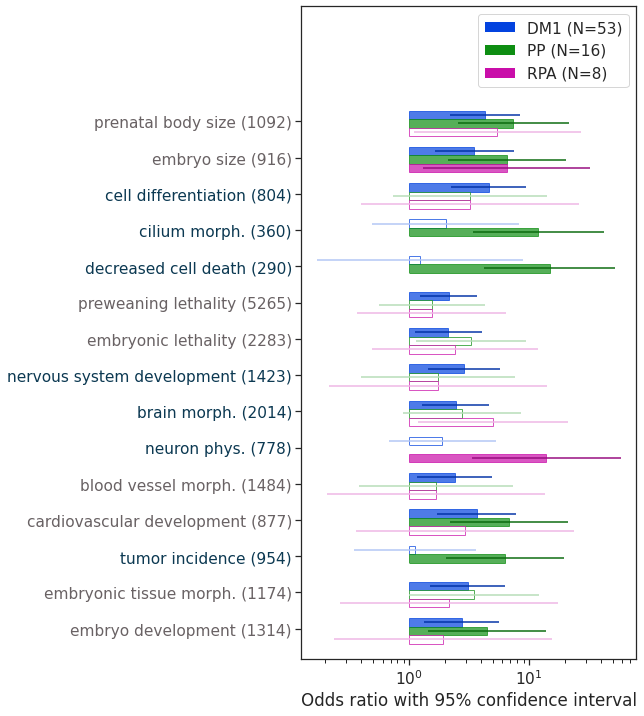

In [43]:
_, ax = plot_hbar_comparison(all_results, communities=["C882", "C889", "C909"], mps=prenatal_terms, sig_level=0.05, 
                         community_names=["DM1", "PP", "RPA"], sort_by=None, 
                         label_number="total", vert=12, color_idx=[1,0,4] , mp_graph=None, horz=6, save_to=None,
                            ylabel_groups=prenatal_groups)


## Postnatal - GSR/MSC

In [88]:
size = [1259, 1265, 1264,  1256, 12321]
homestasis = [5164, 9642, 3953, 2078]
exo = [13561, 13560, 13558]
behavior = [2069, 14114, 2067]
nervous = [8946]
immune = [2723]
muscleP = [5330, 5620]
muscleM = [2269,4087, 759 ]
cardio = [4215, 2972, 10630, 266]
postnatal_terms = size+ homestasis + exo + behavior + nervous + immune + muscleP + muscleM + cardio
postnatal_terms = [num_to_mp(term) for term in postnatal_terms]

postnatal_groups = [1]*5 + [0]*4 + [1]*3 + [0]*3 + [1,0,1,1] + [0]*3 + [1] *4

In [89]:
print(postnatal_terms)

['MP:0001259', 'MP:0001265', 'MP:0001264', 'MP:0001256', 'MP:0012321', 'MP:0005164', 'MP:0009642', 'MP:0003953', 'MP:0002078', 'MP:0013561', 'MP:0013560', 'MP:0013558', 'MP:0002069', 'MP:0014114', 'MP:0002067', 'MP:0008946', 'MP:0002723', 'MP:0005330', 'MP:0005620', 'MP:0002269', 'MP:0004087', 'MP:0000759', 'MP:0004215', 'MP:0002972', 'MP:0010630', 'MP:0000266']


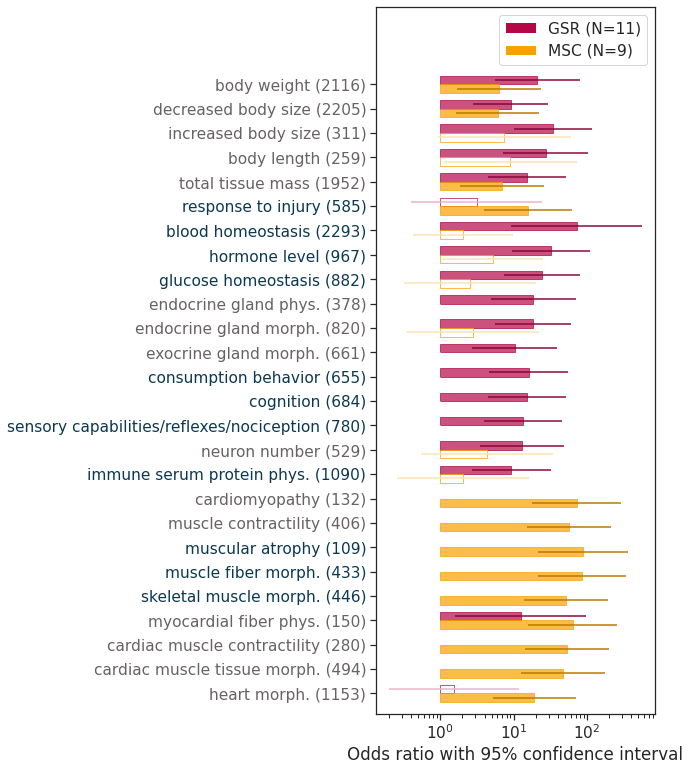

In [484]:
_, ax = plot_hbar_comparison(all_results, communities=["C894", "C907"], mps=postnatal_terms, sig_level=0.05, 
                         community_names=["GSR", "MSC"], sort_by=None, 
                         label_number="total", vert=13, color_idx=[3,2], mp_graph=None, horz=5, save=True,
                            ylabel_groups = postnatal_groups)


In [680]:
results.loc[num_to_mp(5376)]

,observed,total,OR,OR_p,OR_CI_lower,OR_CI_upper,hyper_p,sig_5e6,description,size,name,MP
MP:0005376,160.0,4161.0,1.176220,0.080878,0.980267,1.411344,3.766563e-02,False,homeostasis/metabolism phenotype,642.0,C877,MP:0005376
MP:0005376,1.0,4161.0,0.352139,0.319728,0.045065,2.751615,7.361578e-01,False,homeostasis/metabolism phenotype,11.0,C898,MP:0005376
MP:0005376,3.0,4161.0,1.510204,0.550370,0.390356,5.842664,1.608314e-01,False,homeostasis/metabolism phenotype,10.0,C904,MP:0005376
MP:0005376,3.0,4161.0,1.762025,0.423216,0.440490,7.048363,1.160118e-01,False,homeostasis/metabolism phenotype,9.0,C906,MP:0005376
MP:0005376,1.0,4161.0,0.587059,0.621975,0.070657,4.877602,4.804771e-01,False,homeostasis/metabolism phenotype,7.0,C913,MP:0005376
MP:0005376,3.0,4161.0,2.643398,0.203233,0.591391,11.815457,4.688351e-02,False,homeostasis/metabolism phenotype,7.0,C914,MP:0005376
MP:0005376,2.0,4161.0,1.409377,0.681769,0.273340,7.266923,1.861142e-01,False,homeostasis/metabolism phenotype,7.0,C915,MP:0005376
MP:0005376,1.0,4161.0,0.704519,0.749209,0.082286,6.031944,3.963734e-01,False,homeostasis/metabolism phenotype,6.0,C924,MP:0005376
MP:0005376,1.0,4161.0,0.880709,0.909552,0.098411,7.881742,3.063969e-01,False,homeostasis/metabolism phenotype,5.0,C926,MP:0005376
MP:0005376,1.0,4161.0,0.880709,0.909552,0.098411,7.881742,3.063969e-01,False,homeostasis/metabolism phenotype,5.0,C930,MP:0005376


## Full Heatmap

In [93]:
## All prenatal
prenatal = [1697,10866 ]
cell = [5076, 313]
nervous1 = [4811, 2152]
cardio1 = [2925]
#repro = [1925,2161 ]
ag = [8762,10770]
neo = [2019]
#digestive = [10155]
embryonic = [1672,2085 ]

In [94]:
# All postnatal
#size = [1259, 1256, 1265, 1264]
size = [3956, 5451]
homeostasis = [5164, 3953, 2078]
exo = [13560,13561 , 13558]
behavior = [2069, 14114, 2067]
nervous2 = [8946]
immune = [2723]
muscle = [4087, 759,5620, 2269]
cardio2 = [266,10630,  4215]

In [95]:
growth = prenatal + size
cell = cell
nervous = nervous2 + nervous1
cardio = cardio1+cardio2
ag = ag
neo = neo
embryonic = embryonic
all_terms = []
groups = []
group_id = 0
for group in [growth , cell, embryonic , ag ,  cardio, muscle,
              homeostasis , exo ,neo,  behavior,nervous]:
    all_terms += [num_to_mp(term) for term in group]
    groups += [group_id]*len(group)
    if group_id == 1:
        group_id = 0
    else:
        group_id = 1

ValueError: too many values to unpack (expected 2)

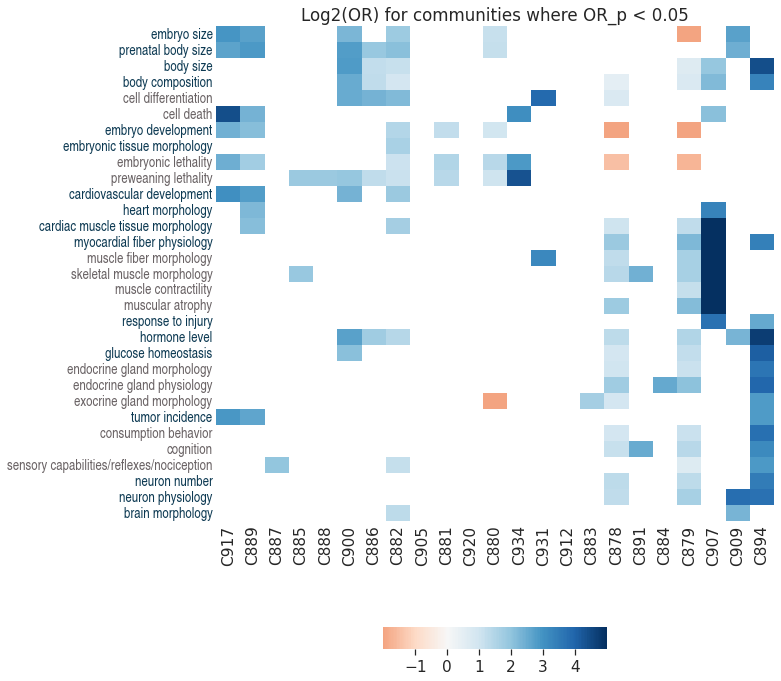

In [96]:
a, b  = plot_community_heatmap(results, all_terms, node_list, new_annotations, stat="OR", filter_stat="OR_p", MPO=MPO2,
                             ylabel_groups = groups, color_range = [-2, 0, 5], vert=13, horz = 10)

ValueError: too many values to unpack (expected 2)

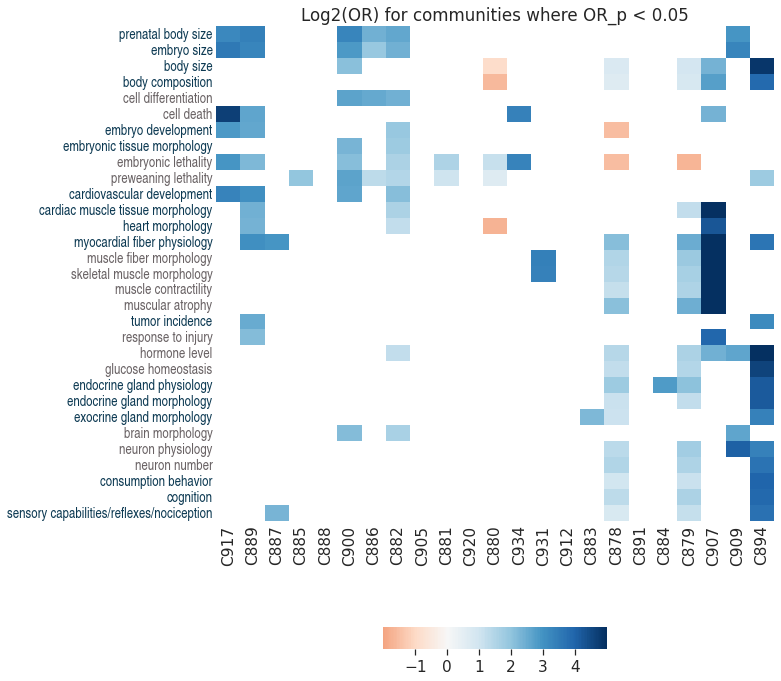

In [149]:
a, b  = plot_community_heatmap(results, all_terms, node_list, new_annotations, stat="OR", filter_stat="OR_p", MPO=MPO2,
                             ylabel_groups = groups, color_range = [-2, 0, 5], vert=13, horz = 10)

In [33]:
new_node_list = [900, 886, 882,917, 889, 885, 888, 920, 905, 881, 880, 934, 931, 887, 
                 912,  883, 878, 891, 884, 879, 909, 907, 894]
new_node_list = ["C" + str(node) for node in new_node_list]

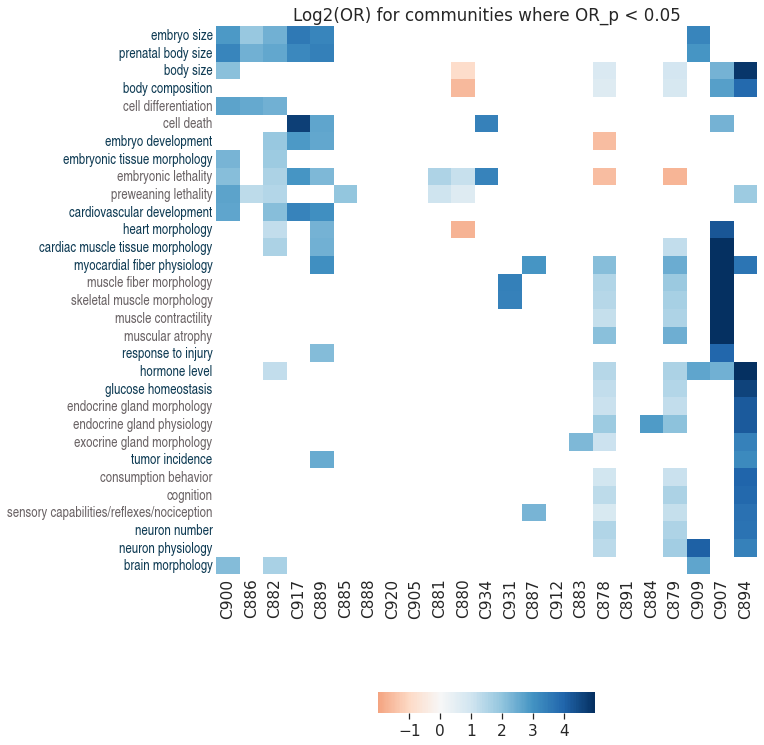

In [173]:
a  = plot_community_heatmap(results, all_terms, new_node_list, new_annotations, stat="OR", filter_stat="OR_p", MPO=MPO2,
                             ylabel_groups = groups, color_range = [-2, 0, 5], vert=14.4, horz=9.7)

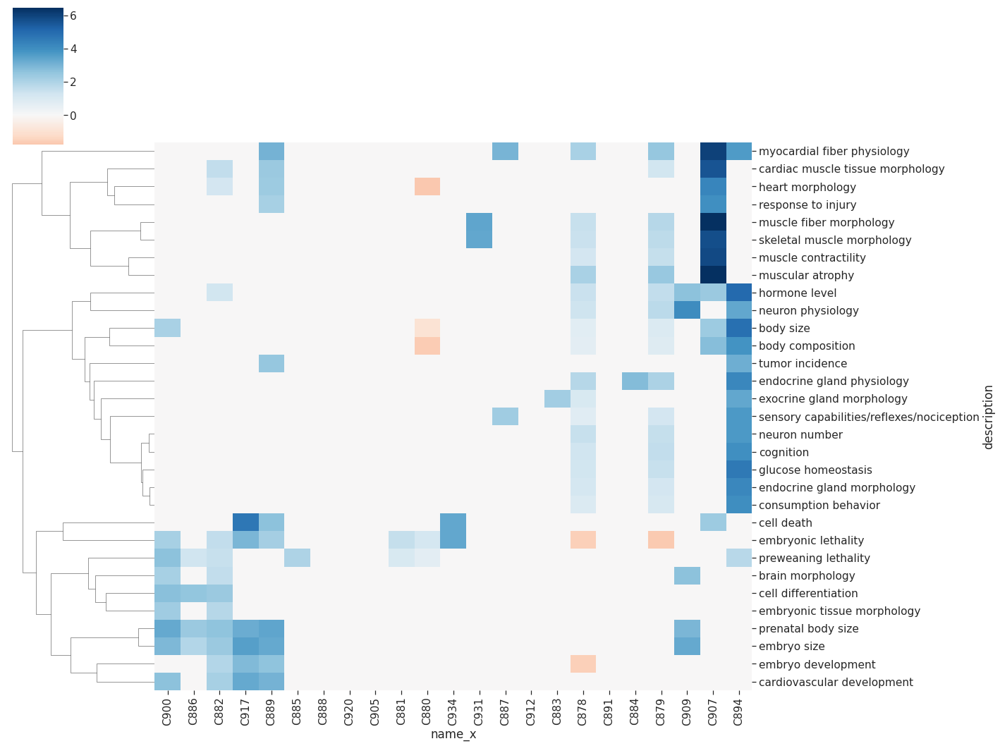

In [147]:
a2 = np.log2(a)
sns.clustermap(a2.fillna(0), method = "average", col_cluster=False, cmap="RdBu", center=0, figsize=(20,15))